#**| Deep Learning Final Project: Multiclass Yoga Pose Recognition |**

---

<br>

- Adrià Cortés Cugat | U214395
- Joan Company Company | U215245

<br>

## **Project Introduction and Motivation**

In this final project for the Deep Learning course, we explore the application of Convolutional Neural Networks (CNNs) for the task of multiclass yoga pose recognition. The aim is to develop a robust model capable of accurately identifying yoga poses from images, leveraging real-world datasets and deep learning techniques studied during the course.

Our motivation lies in the growing role of computer vision in health and wellness, especially in fitness monitoring and pose correction. By automating yoga pose recognition, we contribute to the development of intelligent systems that promote healthy habits and enable personalized guidance through AI.

### **Objectives**
- Build an image classification pipeline using CNNs to recognize 47 different yoga poses.
- Explore both custom CNNs and transfer learning with pretrained models.
- Apply data augmentation and handle class imbalance effectively.
- Tune hyperparameters to improve performance and efficiency.
- Evaluate and interpret model results using standard classification metrics.

### **Project Pipeline**
To achieve these goals, we structured our project as follows:
1. **Dataset selection and preprocessing** (stratified splits, normalization, augmentation).
2. **Baseline model creation** using simple CNN architectures.
3. **Transfer learning experiments** with pretrained CNNs.
4. **Model improvement and hyperparameter tuning**.
5. **Final evaluation** with performance metrics and visualizations.

<br>

---


# **Library Imports and Setup**

In this section, we import all the necessary libraries for data handling, visualization, model training, and evaluation. We also set up the working environment, including mounting Google Drive and selecting the available computing device (GPU, MPS, or CPU).


In [19]:
# ========== 🔁 IMPORTS ==========

# System and data handling
import os
import glob
import random
from pathlib import Path
from collections import Counter

# Data processing and visualization
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import seaborn as sns

# Sklearn
from sklearn.model_selection import train_test_split

# PyTorch and torchvision
import torch
from torch.utils.data import Dataset, DataLoader, Subset, WeightedRandomSampler
from torchvision.datasets import ImageFolder
import torchvision.transforms as T

# ========== 🚫 SUPPRESS PIL TRANSPARENCY WARNINGS ==========
import warnings
warnings.filterwarnings("ignore", message="Palette images with Transparency.*")

# ========== 🔗 MOUNT GOOGLE DRIVE ==========
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
# ========== 💻 DEVICE ==========
device = torch.device("cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu")
print(f"✅ Using device: {device}")

✅ Using device: cuda


# **1. Dataset Download & Loading**


## 📁 Dataset Download and Organization

We used the **Yoga Posture Dataset** created by *tr1gg3rtrash*, available on [Kaggle](https://www.kaggle.com/datasets/tr1gg3rtrash/yoga-posture-dataset). This dataset contains approximately 2,759 labeled images distributed across 47 different yoga pose classes, stored in class-named folders and formatted as `.png` images. Its structure makes it ideal for multiclass image classification tasks using CNNs.

To download the dataset, we manually used the "Download dataset as zip" button available on the Kaggle page.

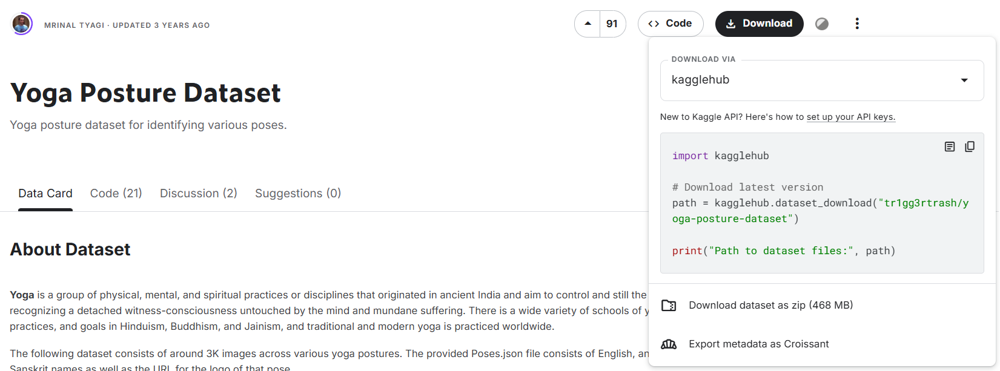

After downloading, we unzipped the contents locally and moved the dataset folder to our desired project directory in Google Drive, allowing us to access it programmatically in our notebook.

Once the dataset was in place, we defined the necessary paths to both the dataset and results directories to be used consistently throughout the project.


In [3]:
#################################################################################################################################################################################

# ========== 🛣️ PATHS ==========

data_dir = '/content/drive/MyDrive/Final_Project_Joan_Adria/data/dl_dataset_yoga_poses'
results_dir = '/content/drive/MyDrive/Final_Project_Joan_Adria/results'

#################################################################################################################################################################################

## 🗂️ Dataset Structure Overview

We collect all image file paths and extract their labels based on folder names. This information is stored in a DataFrame to inspect:
- Total number of images
- Number of yoga pose classes
- Class names
- A few random samples for verification


In [4]:
#################################################################################################################################################################################

# 📁 Gather all image paths
extensions = ('*.jpg', '*.jpeg', '*.png')
image_paths = []
for ext in extensions:
    image_paths.extend(Path(data_dir).rglob(ext))

# 🏷️ Extract labels (folder names)
labels = [p.parent.name for p in image_paths]

# 🧱 Build the dataframe
df = pd.DataFrame({
    'Filepath': [str(p) for p in image_paths],
    'Label': labels
})

# ✅ Basic stats
print(f"✅ Total images: {len(df)}")
print(f"📦 Total yoga pose classes: {df['Label'].nunique()}\n")

# 📋 Display sorted list of unique labels
print("🧘 Yoga Pose Classes:")
for i, label in enumerate(sorted(df['Label'].unique()), 1):
    print(f"{i:>2}. {label}")

# 🔍 Show 10 random samples
print("\n🎲 Sample images:")
display(df.sample(10))

###################################################################################################################################

✅ Total images: 2756
📦 Total yoga pose classes: 47

🧘 Yoga Pose Classes:
 1. Adho Mukha Svanasana
 2. Adho Mukha Vrksasana
 3. Alanasana
 4. Anjaneyasana
 5. Ardha Chandrasana
 6. Ardha Matsyendrasana
 7. Ardha Navasana
 8. Ardha Pincha Mayurasana
 9. Ashta Chandrasana
10. Baddha Konasana
11. Bakasana
12. Balasana
13. Bitilasana
14. Camatkarasana
15. Dhanurasana
16. Eka Pada Rajakapotasana
17. Garudasana
18. Halasana
19. Hanumanasana
20. Malasana
21. Marjaryasana
22. Navasana
23. Padmasana
24. Parsva Virabhadrasana
25. Parsvottanasana
26. Paschimottanasana
27. Phalakasana
28. Pincha Mayurasana
29. Salamba Bhujangasana
30. Salamba Sarvangasana
31. Setu Bandha Sarvangasana
32. Sivasana
33. Supta Kapotasana
34. Trikonasana
35. Upavistha Konasana
36. Urdhva Dhanurasana
37. Urdhva Mukha Svsnssana
38. Ustrasana
39. Utkatasana
40. Uttanasana
41. Utthita Hasta Padangusthasana
42. Utthita Parsvakonasana
43. Vasisthasana
44. Virabhadrasana One
45. Virabhadrasana Three
46. Virabhadrasana Two
47. 

,Filepath,Label
459,/content/drive/MyDrive/Final_Project_Joan_Adri...,Anjaneyasana
1108,/content/drive/MyDrive/Final_Project_Joan_Adri...,Bakasana
924,/content/drive/MyDrive/Final_Project_Joan_Adri...,Malasana
1057,/content/drive/MyDrive/Final_Project_Joan_Adri...,Bakasana
1524,/content/drive/MyDrive/Final_Project_Joan_Adri...,Halasana
2140,/content/drive/MyDrive/Final_Project_Joan_Adri...,Ustrasana
1830,/content/drive/MyDrive/Final_Project_Joan_Adri...,Marjaryasana
1226,/content/drive/MyDrive/Final_Project_Joan_Adri...,Garudasana
956,/content/drive/MyDrive/Final_Project_Joan_Adri...,Malasana
1117,/content/drive/MyDrive/Final_Project_Joan_Adri...,Bakasana


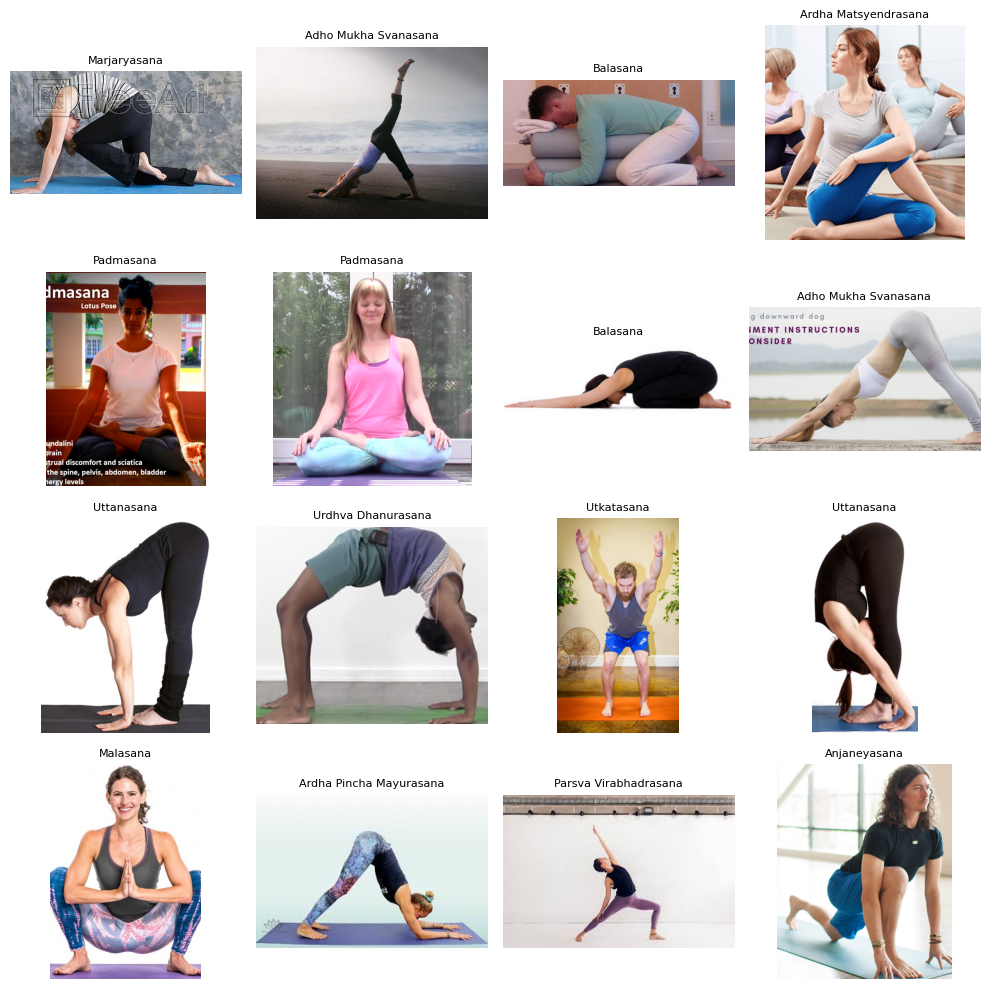

In [5]:
# #################################################################################################################################################################################

# Visualize 16 random yoga poses
plt.figure(figsize=(10, 10))
for i in range(16):
    sample = df.sample(1).iloc[0]
    img = Image.open(sample['Filepath']).convert("RGB")
    label = sample['Label']

    plt.subplot(4, 4, i+1)
    plt.imshow(img)
    plt.title(label, fontsize=8)
    plt.axis('off')

plt.tight_layout()
plt.show()

# #################################################################################################################################################################################

# **2. Dataset Analysis & Imbalance Detection**

Before training our model, we analyze the class distribution to understand whether the dataset is balanced across the 47 yoga poses. Class imbalance can negatively affect model performance, so it’s important to visualize and quantify it early.







### 🔍 Visualizing Class Distribution

We count how many images exist for each pose class and plot a horizontal bar chart to visualize the dataset distribution. This helps us quickly identify overrepresented and underrepresented classes.


<ipython-input-88-f9827cf8df7d>:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=label_counts.values, y=label_counts.index, palette="viridis")
<ipython-input-88-f9827cf8df7d>:17: UserWarning: Glyph 129496 (\N{PERSON IN LOTUS POSITION}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129496 (\N{PERSON IN LOTUS POSITION}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


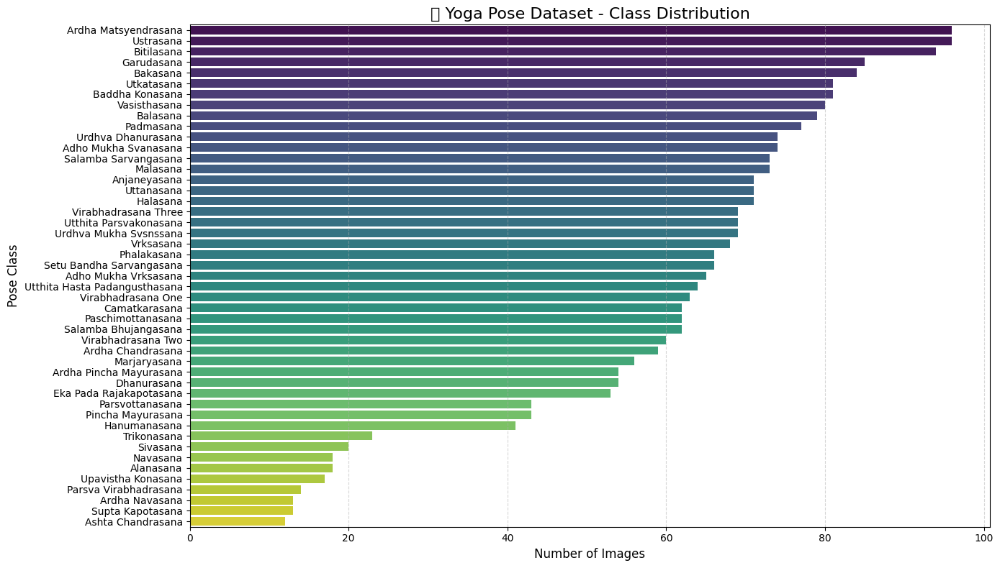

In [ ]:
#################################################################################################################################################################################

import matplotlib.pyplot as plt
import seaborn as sns

# 🧮 Count number of samples per label
label_counts = df['Label'].value_counts().sort_values(ascending=False)

# 📊 Plot histogram
plt.figure(figsize=(14, 8))
sns.barplot(x=label_counts.values, y=label_counts.index, palette="viridis")

plt.title("🧘 Yoga Pose Dataset - Class Distribution", fontsize=16)
plt.xlabel("Number of Images", fontsize=12)
plt.ylabel("Pose Class", fontsize=12)
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

#################################################################################################################################################################################

### 📐 Class Distribution Percentages

We compute the percentage of samples per class and display them in a sorted list. This quantifies the imbalance observed in the previous plot and guides how we later apply class weighting during training.


In [ ]:
#################################################################################################################################################################################

# Count samples per class
label_counts = df['Label'].value_counts()
total_samples = len(df)

# Calculate percentages and sort by descending %
percentages = (label_counts / total_samples * 100).round(2)
combined = pd.DataFrame({
    'Count': label_counts,
    'Percentage': percentages
}).sort_values(by='Percentage', ascending=False)

# Print nicely
print("📊 Class distribution (sorted by % of total):\n")
for label, row in combined.iterrows():
    print(f"{label:<30} {row['Percentage']:>5.2f} %  ({int(row['Count'])} images)")

#################################################################################################################################################################################

📊 Class distribution (sorted by % of total):

Ardha Matsyendrasana            3.48 %  (96 images)
Ustrasana                       3.48 %  (96 images)
Bitilasana                      3.41 %  (94 images)
Garudasana                      3.08 %  (85 images)
Bakasana                        3.05 %  (84 images)
Utkatasana                      2.94 %  (81 images)
Baddha Konasana                 2.94 %  (81 images)
Vasisthasana                    2.90 %  (80 images)
Balasana                        2.87 %  (79 images)
Padmasana                       2.79 %  (77 images)
Urdhva Dhanurasana              2.69 %  (74 images)
Adho Mukha Svanasana            2.69 %  (74 images)
Salamba Sarvangasana            2.65 %  (73 images)
Malasana                        2.65 %  (73 images)
Anjaneyasana                    2.58 %  (71 images)
Uttanasana                      2.58 %  (71 images)
Halasana                        2.58 %  (71 images)
Virabhadrasana Three            2.50 %  (69 images)
Utthita Parsvakona

The analysis confirmed a significant imbalance in the dataset: while some classes contain nearly 100 images, others have fewer than 20, with several representing less than 1% of the total samples. This uneven distribution can cause the model to prioritize frequent classes during training, reducing its ability to generalize.

To mitigate this, we later compute class weights based on inverse class frequency and apply them to the loss function. This helps balance the contribution of each class during training and improves performance on underrepresented poses.


# **3. Dataset Improvements**
To enhance model generalization and address class imbalance, we apply several preprocessing and augmentation techniques to the dataset. This includes carefully designed image transformations, a custom dataset wrapper, a stratified data split, and a weighted sampling strategy.

## 🧹 Dataset Improvements

We first load the dataset using PyTorch’s `ImageFolder`, which automatically assigns labels based on folder structure. We then define two transformation pipelines:
- **Training transforms** include resizing, random cropping, flipping, rotation, and slight brightness/contrast shifts to create visual diversity while preserving the semantic meaning of each pose.
- **Validation/test transforms** apply only resizing and tensor conversion to maintain consistency and avoid data leakage from augmentation.

To ensure fair class representation, we perform a stratified split into training (70%), validation (15%), and test (15%) sets based on class labels.

A custom `Dataset` class applies the corresponding transform to each image dynamically during loading, giving us full flexibility and efficiency.

Due to the imbalance in class distribution, we compute class weights inversely proportional to their frequency:

$$
w_i \propto \frac{1}{f_i}
$$

These weights are used in a weighted random sampler to ensure underrepresented classes are seen more often during training, reducing bias.

Finally, we create optimized `DataLoader`s for each split, verify their integrity, and visualize a sample of augmented training images alongside the original and validation version to confirm the transformations behave as expected.


In [6]:
#################################################################################################################################################################################

# =========================
# LOAD RAW DATASET FOR YOGA POSE RECOGNITION
# =========================
from torchvision.datasets import ImageFolder
from torchvision import transforms as T
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from sklearn.model_selection import train_test_split
from collections import Counter
from PIL import Image
import torch
import os

# ✅ CONFIG
BATCH_SIZE = 32

# ✅ Load dataset using ImageFolder
raw_ds = ImageFolder(root=data_dir)
targets = [label for _, label in raw_ds.samples]
NUM_CLASSES = len(raw_ds.classes)

print(f"✅ Loaded samples: {len(raw_ds.samples)}")
print(f"🏷️  Classes: {NUM_CLASSES}")

# =========================
# DEFINE TRANSFORMS
# =========================
train_transforms = T.Compose([
    T.Resize((256, 256)),                        # Resize to fixed dimensions
    T.RandomResizedCrop(224, scale=(0.85, 1.0)), # Slight zooms
    T.RandomHorizontalFlip(p=0.5),               # Flip left-right
    T.RandomRotation(degrees=10),                # Small angle rotation
    T.ColorJitter(brightness=0.1, contrast=0.1), # Slight brightness/contrast shift
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406],
                [0.229, 0.224, 0.225])

])

val_test_transforms = T.Compose([
    T.Resize((256, 256)),               # First resize to a known size
    T.CenterCrop(224),                  # Crop to fixed size
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406],
                [0.229, 0.224, 0.225])
])

# =========================
# STRATIFIED SPLIT (70/15/15)
# =========================
indices = list(range(len(targets)))
train_idx, temp_idx, _, temp_y = train_test_split(indices, targets, test_size=0.30, stratify=targets, random_state=42)
val_idx, test_idx, _, _ = train_test_split(temp_idx, temp_y, test_size=0.50, stratify=temp_y, random_state=42)

train_samples = [raw_ds.samples[i] for i in train_idx]
val_samples   = [raw_ds.samples[i] for i in val_idx]
test_samples  = [raw_ds.samples[i] for i in test_idx]

# =========================
# DEFINE Custom Dataset class
# =========================
class ImageDatasetWithTransform(Dataset):
    def __init__(self, samples, transform):
        self.samples = samples
        self.transform = transform

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        path, label = self.samples[idx]
        try:
            image = Image.open(path).convert("RGB")
            image = self.transform(image)
        except Exception as e:
            print(f"⚠️ Skipping corrupted or unreadable image: {path} — {e}")
            # Attempt to recover by returning the next item in the dataset
            return self.__getitem__((idx + 1) % len(self.samples))
        return image, label

# ✅ Apply transforms to datasets
train_dataset = ImageDatasetWithTransform(train_samples, train_transforms) # Uses previous sampler to benefit the underrepresented classes.
val_dataset   = ImageDatasetWithTransform(val_samples, val_test_transforms)
test_dataset  = ImageDatasetWithTransform(test_samples, val_test_transforms)

# =========================
# CLASS-WEIGHTED SAMPLER
# =========================
counts = Counter(targets)
class_counts = torch.tensor([counts[i] for i in range(NUM_CLASSES)], dtype=torch.float)
class_weights = 1.0 / class_counts
sample_weights = [class_weights[label] for _, label in train_samples]

sampler = WeightedRandomSampler(
    weights=sample_weights,
    num_samples=len(sample_weights),
    replacement=True
)

# =========================
# DATALOADERS
# =========================
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, sampler=sampler, num_workers=2, pin_memory=True)
val_loader   = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)
test_loader  = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)

# =========================
# FINAL CHECK
# =========================
print("\n✅ DataLoader verification")
print(f"   🟢 Train samples: {len(train_dataset)}")
print(f"   🔵 Validation samples: {len(val_dataset)}")
print(f"   🟠 Test samples: {len(test_dataset)}")

batch = next(iter(train_loader))
print("📦 Batch type:", type(batch[0]), batch[0].shape)
print("🎯 Ready for training!")

#################################################################################################################################################################################


✅ Loaded samples: 2756
🏷️  Classes: 47

✅ DataLoader verification
   🟢 Train samples: 1929
   🔵 Validation samples: 413
   🟠 Test samples: 414
📦 Batch type: <class 'torch.Tensor'> torch.Size([32, 3, 224, 224])
🎯 Ready for training!


### 🖼️ Augmentation Visualization

In this step, we visualize how our data transformations affect a sample image from the dataset. We load one image and apply:
- The **validation/test transform** (resize only, no augmentation).
- The **training transform** six times to generate different augmented versions.

This allows us to verify that our data augmentation pipeline introduces appropriate visual variation (e.g., slight zoom, rotation, horizontal flip, color jitter), while still preserving the semantic structure of the pose.

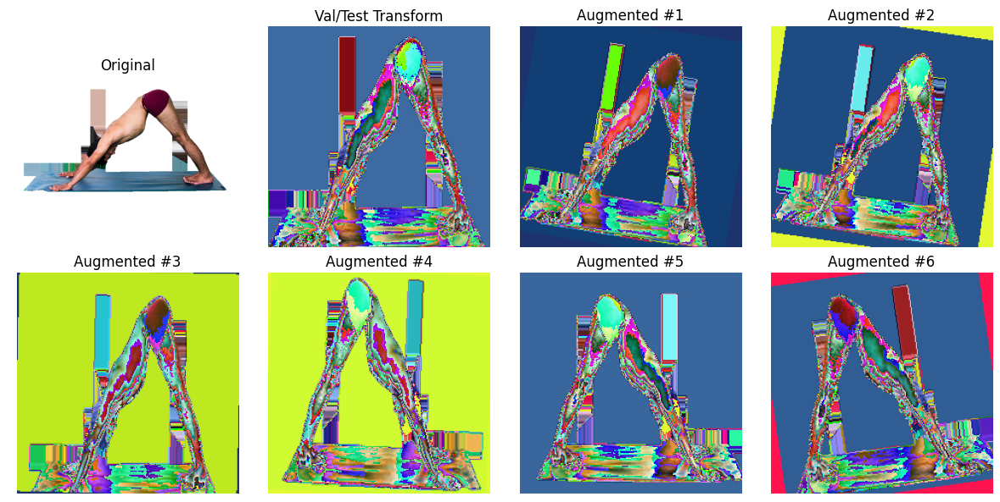

In [7]:
import matplotlib.pyplot as plt
import torchvision.transforms.functional as F
from PIL import Image

# =========================
# Load a sample image path from raw_ds
# =========================
example_path, example_label = raw_ds.samples[0]
original_img = Image.open(example_path).convert("RGB")

# =========================
# Apply transformations
# =========================
val_transformed_img = val_test_transforms(original_img)
augmented_imgs = [train_transforms(original_img) for _ in range(6)]

# =========================
# Utility: Convert tensor to PIL for visualization
# =========================
def tensor_to_pil(t):
    return F.to_pil_image(t.cpu().clone().detach())

# =========================
# Plot original + transformed versions
# =========================
plt.figure(figsize=(12, 6))

# Original image
plt.subplot(2, 4, 1)
plt.imshow(original_img)
plt.title("Original")
plt.axis('off')

# Validation-style transform (center crop, no aug)
plt.subplot(2, 4, 2)
plt.imshow(tensor_to_pil(val_transformed_img))
plt.title("Val/Test Transform")
plt.axis('off')

# Multiple augmentations
for i, img in enumerate(augmented_imgs):
    plt.subplot(2, 4, i + 3)
    plt.imshow(tensor_to_pil(img))
    plt.title(f"Augmented #{i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()


As shown in the output, the training augmentations produce visibly distinct but realistic variants of the original yoga pose, which helps improve model robustness and generalization.

# **4. CNN Architecture Comparison**

In this section, we experiment with multiple Convolutional Neural Network (CNN) architectures to evaluate their performance on the yoga pose classification task. Our goal is to compare model complexity, accuracy, and training efficiency across a range of networks, from simple custom CNNs to modern pretrained and lightweight models. This exploration helps us identify the most suitable architecture for our final model.


## ⚙️ **4.1 Training, Inference & Model Evaluation Utilities**

In this section, we define a set of reusable utility functions to streamline training, validation, testing, and evaluation of different CNN architectures. These functions ensure that all models are trained and tested consistently using the same pipeline. Below is a brief overview of what each function does.

In [8]:
#################################################################################################################################################################################

NUM_CLASSES = len(raw_ds.classes)
print("Number of Classes:",NUM_CLASSES)

# Directory where checkpoints are saved (update if necessary)
saved_dir = "/content/drive/MyDrive/Final_Project_Joan_Adria/results"

#################################################################################################################################################################################

Number of Classes: 47


`train_step()`:

- This function runs one full training epoch for a given model. It loops over all batches in the training DataLoader, computes the loss using the provided criterion, performs backpropagation, and updates the model weights using the specified optimizer.

- **Used in:** the main `train()` loop.  
- **Returns:** average training loss and accuracy for the epoch.

In [9]:
#################################################################################################################################################################################

# REUSED & NEW FUNCTOINS FOR MODEL ARCHITECTURE TRAINING AND FOR TUNNING

from typing import Tuple, List
import time
import torch
import torch.nn as nn
import torch.optim as optim

def train_step(model: nn.Module,
               dataloader: torch.utils.data.DataLoader,
               criterion: nn.Module,
               optimizer: torch.optim.Optimizer,
               device: torch.device) -> Tuple[float, float]:
    """
    Executes one full training epoch on the given dataloader.

    Args:
        model (nn.Module): The CNN model to train.
        dataloader (torch.utils.data.DataLoader): The DataLoader for the training dataset.
        criterion (nn.Module): Loss function used to compute training loss.
        optimizer (torch.optim.Optimizer): Optimizer used for weight updates.
        device (torch.device): Device to perform computation ('cuda' or 'cpu').

    Returns:
        Tuple[float, float]: Average training loss and training accuracy for the epoch.
    """
    model.train()  # Set model to training mode
    model.to(device)  # Move model to the computation device
    total_loss = 0.0
    correct = 0
    total = 0

    for images, labels in dataloader:
        images = images.to(device)  # Move inputs to the computation device
        labels = labels.type(torch.LongTensor).to(device)  # Convert labels and move to device

        outputs = model(images)  # Forward pass
        loss = criterion(outputs, labels)  # Compute loss

        optimizer.zero_grad()  # Reset gradients
        loss.backward()        # Backpropagation
        optimizer.step()       # Update weights

        total_loss += loss.item()  # Accumulate total loss
        _, predicted = torch.max(outputs, 1)  # Get class predictions
        correct += (predicted == labels).sum().item()  # Count correct predictions
        total += labels.size(0)  # Accumulate total number of samples

    avg_loss = total_loss / len(dataloader)  # Average loss
    accuracy = 100 * correct / total         # Accuracy in percentage

    return avg_loss, accuracy

#################################################################################################################################################################################

`val_step()`:

- This function evaluates the model on the validation set for a single epoch. It computes the loss and accuracy without updating the model weights or computing gradients.
- **Used in:** the main `train()` loop.
- **Returns:** average validation loss and accuracy for the epoch.


In [10]:
#################################################################################################################################################################################

def val_step(model: nn.Module,
             dataloader: torch.utils.data.DataLoader,
             criterion: nn.Module,
             device: torch.device) -> Tuple[float, float]:
    """
    Evaluates the model on the validation set for one epoch.

    Args:
        model (nn.Module): The CNN model to evaluate.
        dataloader (torch.utils.data.DataLoader): The DataLoader for the validation dataset.
        criterion (nn.Module): Loss function used to compute validation loss.
        device (torch.device): Device to perform computation ('cuda' or 'cpu').

    Returns:
        Tuple[float, float]: Average validation loss and validation accuracy.
    """
    model.eval()  # Set model to evaluation mode
    model.to(device)  # Move model to the computation device
    total_loss = 0.0
    correct = 0
    total = 0

    with torch.inference_mode():  # Disable gradient computation
        for images, labels in dataloader:
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)  # Forward pass
            loss = criterion(outputs, labels)  # Compute loss

            total_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            correct += (predicted == labels).sum().item()
            total += labels.size(0)

    avg_loss = total_loss / len(dataloader)
    accuracy = 100 * correct / total

    return avg_loss, accuracy

#################################################################################################################################################################################

`train()`:

- This is the main training function that runs for multiple epochs. It uses `train_step()` and `val_step()` at each epoch to update the model and track its performance. The best-performing model (based on validation loss) is saved.
- **Used for:** training and checkpointing models.
- **Returns:** lists of training and validation losses and accuracies per epoch.


In [11]:
#################################################################################################################################################################################

def train(model: nn.Module,
          train_loader: torch.utils.data.DataLoader,
          val_loader: torch.utils.data.DataLoader,
          criterion: nn.Module,
          optimizer: torch.optim.Optimizer,
          device: torch.device,
          num_epochs: int = 10,
          model_name: str = "best_model.pt") -> Tuple[List[float], List[float], List[float], List[float]]:
    """
    Trains and evaluates the CNN model for several epochs. Tracks best validation loss and saves model accordingly.

    Args:
        model (nn.Module): The CNN model to train and evaluate.
        train_loader (torch.utils.data.DataLoader): DataLoader for the training data.
        val_loader (torch.utils.data.DataLoader): DataLoader for the validation data.
        criterion (nn.Module): Loss function for both training and validation.
        optimizer (torch.optim.Optimizer): Optimizer used for training.
        device (torch.device): Device for computation ('cuda' or 'cpu').
        num_epochs (int): Number of training epochs.
        model_name (str): File name to save the best model.

    Returns:
        Tuple[List[float], List[float], List[float], List[float]]:
            - List of train losses per epoch
            - List of train accuracies per epoch
            - List of validation losses per epoch
            - List of validation accuracies per epoch
    """
    model.to(device)  # Move model to computation device
    best_val_loss = float('inf')  # Initialize best loss

    # Lists to store metrics
    train_losses: List[float] = []
    train_accuracies: List[float] = []
    val_losses: List[float] = []
    val_accuracies: List[float] = []

    for epoch in range(num_epochs):
        start_time = time.time()

        # Perform one epoch of training and validation
        train_loss, train_acc = train_step(model, train_loader, criterion, optimizer, device)
        val_loss, val_acc = val_step(model, val_loader, criterion, device)

        # Store metrics
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)

        # Calculate elapsed time
        elapsed_time = time.time() - start_time
        mins, secs = divmod(elapsed_time, 60)

        # Print formatted metrics
        print(f"- Epoch {epoch+1}: Metrics --> Train Loss: {train_loss:.4f} | Train  Acc: {train_acc:.4f} | "
              f"Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.4f} | Time: {int(mins)}m {secs:.2f}s")

        # Save model if current val_loss is the best so far
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            torch.save(model.state_dict(), results_dir + '/' + model_name)

    return train_losses, train_accuracies, val_losses, val_accuracies

#################################################################################################################################################################################

`plot_training_results()`:

- This function visualizes the training and validation loss and accuracy curves over all epochs. It helps detect overfitting, underfitting, or training instability.
- **Used for:** interpreting training performance over time.


In [12]:
#################################################################################################################################################################################

def plot_training_results(train_losses, val_losses, train_accuracies, val_accuracies, model_name):
    """
    Plots loss and accuracy curves for training and validation.
    """
    epochs = range(1, len(train_losses) + 1)
    plt.figure(figsize=(14, 5))

    # Plot Loss
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_losses, label="Train Loss")
    plt.plot(epochs, val_losses, label="Validation Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title(f"{model_name} - Loss Curves")
    plt.legend()

    # Plot Accuracy
    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_accuracies, label="Train Accuracy")
    plt.plot(epochs, val_accuracies, label="Validation Accuracy")
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy (%)")
    plt.title(f"{model_name} - Accuracy Curves")
    plt.legend()

    plt.tight_layout()
    plt.show()

#################################################################################################################################################################################

`inference()`:

- This function runs a trained model on the test set in evaluation mode, computing the final test accuracy.
- **Used for:** quick evaluation of a trained model.
- **Returns:** test accuracy.


In [13]:
#################################################################################################################################################################################

def inference(model: torch.nn.Module,
         test_loader: torch.utils.data.DataLoader,
         device: torch.device) -> float:
    """
    Tests a CNN model on a given dataset.

    Args:
        test_loader (torch.utils.data.DataLoader): DataLoader for the testing data.
        device (torch.device): Device to perform the computation on ('cpu' or 'cuda').

    Returns:
        float: Accuracy percentage of the model on the test set.
    """
    model.eval()  # Switches the model to evaluation mode.
    # Move the model to the specified device
    model.to(device)
    correct = 0
    total = 0

    with torch.inference_mode():  # Disables gradient calculation
        for images, labels in test_loader:
            images = images.to(device)  # Moves images to the specified device
            labels = labels.to(device)  # Moves labels to the specified device

            outputs = model(images)  # Forward pass
            _, predicted = torch.max(outputs.data, 1)  # Get predicted class

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

        accuracy = 100 * correct / total
        return accuracy
#################################################################################################################################################################################

`compute_model_params()`:

- This function computes the total number of trainable parameters in a model and warns if it exceeds a predefined threshold, helping assess model size and complexity.
- **Used for:** comparing model parameter sizes.
- **Returns:** total number of trainable parameters.


In [14]:
#################################################################################################################################################################################

def compute_model_params(model: nn.Module, max_params: int = 150_000) -> int:
    """
    Computes the total number of trainable parameters in a PyTorch model.

    Also issues a warning if the number of parameters exceeds a defined threshold.

    Args:
        model (nn.Module): The PyTorch model to evaluate.
        max_params (int, optional): Maximum allowed parameters before warning is triggered. Default is 150,000.

    Returns:
        int: Total number of trainable parameters in the model.
    """
    total_params = 0

    # Iterate through all parameters and sum their sizes
    for param in model.parameters():
        total_params += param.numel()

    # Trigger a warning if the model exceeds the allowed threshold
    if total_params > max_params:
        warnings.warn(
            f"⚠️ Model contains {total_params:,} parameters — this exceeds the {max_params:,} limit.",
            category=UserWarning
        )

    return total_params

#################################################################################################################################################################################

`inference_with_metrics()`:

- This function performs inference on the test set while measuring accuracy, precision, recall, F1-score, and inference time per image. It is useful for comprehensive evaluation of trained models.
- **Used for:** final model evaluation with detailed metrics.
- **Returns:** accuracy, precision, recall, F1-score, and average inference time per image.


In [15]:
#################################################################################################################################################################################

from sklearn.metrics import precision_score, recall_score, f1_score

# Inference with time measurement and additional metrics
def inference_with_metrics(model: torch.nn.Module,
                        test_loader: torch.utils.data.DataLoader,
                        device: torch.device) -> tuple:
    """
    Tests a CNN model on a given dataset, measures inference time, and computes precision, recall, and F1-score.

    Args:
        test_loader (torch.utils.data.DataLoader): DataLoader for the testing data.
        device (torch.device): Device to perform the computation on ('cpu' or 'cuda').

    Returns:
        tuple: Accuracy, precision, recall, F1-score, and inference time per image.
    """
    model.eval()  # Switches the model to evaluation mode.
    model.to(device)
    correct = 0
    total = 0
    total_time = 0.0
    all_preds = []
    all_labels = []

    with torch.inference_mode():  # Disables gradient calculation
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)

            start_time = time.time()  # Start timing
            outputs = model(images)  # Forward pass
            end_time = time.time()  # End timing

            total_time += (end_time - start_time)  # Accumulate time taken for each batch
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            all_preds.extend(predicted.cpu().numpy())  # Store predictions
            all_labels.extend(labels.cpu().numpy())    # Store ground truth labels

    # Calculate metrics
    accuracy = 100 * correct / total
    avg_inference_time = total_time / len(test_loader.dataset)  # Average time per image
    precision = precision_score(all_labels, all_preds, average='weighted', zero_division=1)
    recall = recall_score(all_labels, all_preds, average='weighted', zero_division=1)
    f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=1)

    return accuracy, precision, recall, f1, avg_inference_time

#################################################################################################################################################################################

`compute_metrics()`:

- This function runs the model on the test set and computes standard classification metrics along with a confusion matrix to visualize prediction errors across classes.
- **Used for:** detailed evaluation and error analysis.
- **Returns:** accuracy, precision, recall, F1-score, and the confusion matrix.


In [16]:
#################################################################################################################################################################################

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Function to compute Precision, Recall, F1-Score, and Confusion Matrix
def compute_metrics(model, test_loader, device):
    all_labels = []
    all_preds = []

    model.eval()  # Set model to evaluation mode
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)

            outputs = model(images)
            _, preds = torch.max(outputs, 1)

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(preds.cpu().numpy())

    # Compute metrics
    accuracy = accuracy_score(all_labels, all_preds)
    precision = precision_score(all_labels, all_preds, average='weighted', zero_division=1)
    recall = recall_score(all_labels, all_preds, average='weighted', zero_division=1)
    f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=1)

    # Confusion matrix
    cm = confusion_matrix(all_labels, all_preds)

    # Plot confusion matrix
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=np.unique(all_labels), yticklabels=np.unique(all_labels))
    plt.title(f"Confusion Matrix")
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()

    return accuracy, precision, recall, f1, cm

#################################################################################################################################################################################

## **🧱 4.2 Simple CNN**

In this section, we implement and evaluate a simple Convolutional Neural Network (CNN) as a baseline model for the yoga pose classification task. The architecture consists of three convolutional layers followed by two fully connected layers. This model allows us to assess the learning capacity of a straightforward CNN design before moving on to more complex pretrained or custom architectures.


`SimpleCNN` Class:

- We define a basic CNN architecture with three convolutional layers, each followed by a ReLU activation and 2×2 max pooling to reduce spatial dimensions.
- After the convolutional layers, the feature maps are flattened and passed through two fully connected layers.
- This model serves as a lightweight baseline, helping us evaluate how well a non-pretrained, manually designed architecture performs on this multi-class task.


In [ ]:
#################################################################################################################################################################################

import torch
import torch.nn as nn
import torch.nn.functional as F

class SimpleCNN(nn.Module):
    def __init__(self, num_classes):
        super(SimpleCNN, self).__init__()

        # Convolutional layers
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)  # 3 input channels (RGB), 32 output channels
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)

        # Fully connected layers
        self.fc1 = nn.Linear(128 * 28 * 28, 512)  # 128 channels, 28x28 feature maps after conv layers and pooling
        self.fc2 = nn.Linear(512, num_classes)  # Output layer

        # Max pooling layer
        self.pool = nn.MaxPool2d(2, 2)  # 2x2 max pooling

    def forward(self, x):
        # Apply the conv layers + max pooling + ReLU activations
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = self.pool(F.relu(self.conv3(x)))

        # Flatten the tensor before passing it to fully connected layers
        x = x.view(-1, 128 * 28 * 28)  # Flatten the output
        x = F.relu(self.fc1(x))  # Fully connected layer 1 with ReLU
        x = self.fc2(x)  # Fully connected layer 2 (output layer)

        return x

# Instantiate the model for the specific number of classes
model_simple_cnn = SimpleCNN(num_classes=NUM_CLASSES).to(device)

# Print the model architecture to verify
print(model_simple_cnn)

#################################################################################################################################################################################

SimpleCNN(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (fc1): Linear(in_features=100352, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=47, bias=True)
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
)


🔧 Training Setup & Results Visualization:

- We initialize the training pipeline for the Simple CNN using CrossEntropyLoss and the Adam optimizer.
- The model is trained for 10 epochs using our reusable `train()` function.
- We record training and validation losses and accuracies for each epoch.
- We use `plot_training_results()` to visualize how the model's loss and accuracy evolved over time.
- This helps us understand whether the model is learning effectively and if it's overfitting or underfitting.


- Epoch 1: Metrics --> Train Loss: 4.2591 | Train  Acc: 1.8144 | Val Loss: 3.8510 | Val Acc: 1.9370 | Time: 2m 48.63s
- Epoch 2: Metrics --> Train Loss: 3.8447 | Train  Acc: 2.8512 | Val Loss: 3.7915 | Val Acc: 5.8111 | Time: 0m 38.14s
- Epoch 3: Metrics --> Train Loss: 3.5451 | Train  Acc: 9.9533 | Val Loss: 3.3332 | Val Acc: 16.9492 | Time: 0m 35.78s
- Epoch 4: Metrics --> Train Loss: 2.9748 | Train  Acc: 24.3131 | Val Loss: 3.0329 | Val Acc: 23.9709 | Time: 0m 30.94s
- Epoch 5: Metrics --> Train Loss: 2.5224 | Train  Acc: 34.6812 | Val Loss: 2.7146 | Val Acc: 34.3826 | Time: 0m 30.60s
- Epoch 6: Metrics --> Train Loss: 2.1694 | Train  Acc: 42.6128 | Val Loss: 2.6822 | Val Acc: 40.9201 | Time: 0m 29.96s
- Epoch 7: Metrics --> Train Loss: 1.9245 | Train  Acc: 48.7818 | Val Loss: 2.4953 | Val Acc: 43.0993 | Time: 0m 28.99s
- Epoch 8: Metrics --> Train Loss: 1.7585 | Train  Acc: 54.2768 | Val Loss: 2.3269 | Val Acc: 42.6150 | Time: 0m 29.86s
- Epoch 9: Metrics --> Train Loss: 1.5346 | T

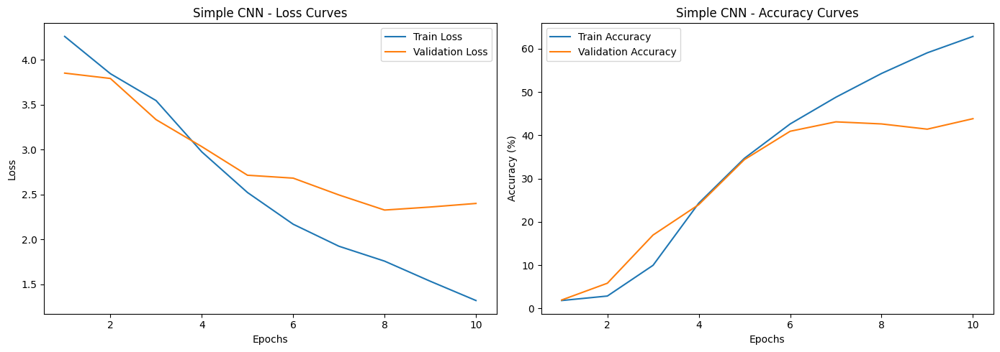

In [ ]:
#################################################################################################################################################################################

# Define the loss and optimizer for training
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model_simple_cnn.parameters(), lr=0.001, weight_decay=1e-4)

# Train the model
simple_cnn_train_losses, simple_cnn_train_accuracies, simple_cnn_val_losses, simple_cnn_val_accuracies = train(
    model_simple_cnn,
    train_loader,
    val_loader,
    criterion,
    optimizer,
    device=device,
    num_epochs=10,
    model_name="simple_cnn_yoga.pt"
)

# Plot the training results
plot_training_results(
    simple_cnn_train_losses,
    simple_cnn_val_losses,
    simple_cnn_train_accuracies,
    simple_cnn_val_accuracies,
    model_name="Simple CNN"
)

#################################################################################################################################################################################

📊 Evaluation and Metrics Summary:

In this block, we evaluate the previously trained Simple CNN model by loading its best checkpoint and testing its performance on all three datasets: training, validation, and test.

We:

- Measure the model's **accuracy** on each dataset using our standard inference utilities.
- Compute **precision**, **recall**, and **F1-score** on the test set to assess classification quality across the 47 yoga pose classes.
- Display a **confusion matrix** to visualize misclassifications and better understand class-specific errors.
- Calculate the total number of **trainable parameters** to estimate model complexity.
- Measure the **average inference time per image** to evaluate computational efficiency.
- Summarize all results in a **formatted comparison table**, which will help benchmark this model against others in later sections.



Loading simple_cnn_yoga.pt → factory key 'simple_cnn'


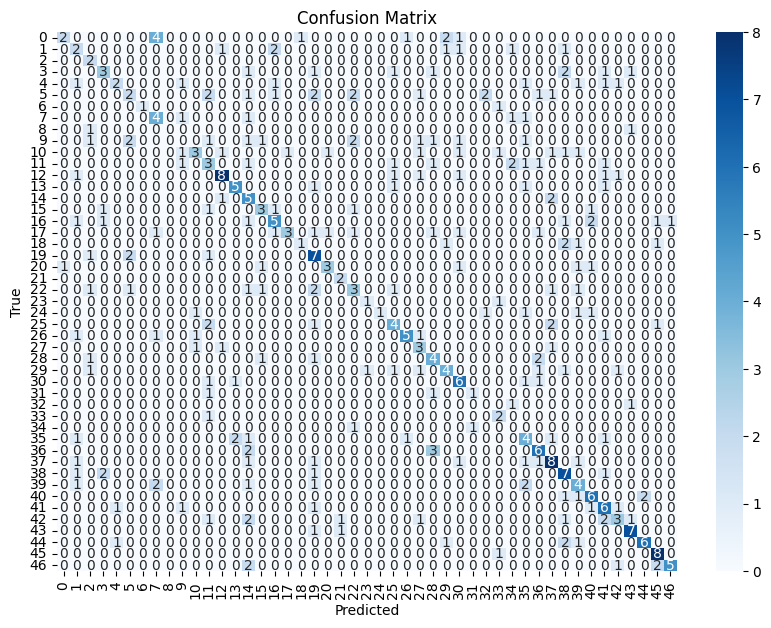


Confusion Matrix for simple_cnn:
[[2 0 0 ... 0 0 0]
 [0 2 0 ... 0 0 0]
 [0 0 2 ... 0 0 0]
 ...
 [0 0 0 ... 6 0 0]
 [0 0 0 ... 0 8 0]
 [0 0 0 ... 0 2 5]]
+------------+--------------+-------------+-----------+------------+-------------+----------+------------+------------------------------+
| Model      | Parameters   | Train Acc   | Val Acc   | Test Acc   |   Precision |   Recall |   F1-Score | Inference Time (sec/image)   |
+============+==============+=============+===========+============+=============+==========+============+==============================+
| simple_cnn | 51,498,095   | 57.18%      | 42.62%    | 41.06%     |        0.45 |     0.41 |        0.4 | 0.000046 sec/image           |
+------------+--------------+-------------+-----------+------------+-------------+----------+------------+------------------------------+


In [ ]:
#################################################################################################################################################################################

import os
import torch
from tabulate import tabulate  # Import for neat table printing
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import time
import numpy as np

# Single checkpoint for the Simple CNN model
checkpoints = [
    "simple_cnn_yoga.pt",
]

# Function to compute model parameters
def compute_model_params(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

# Results container
results = []

# Loop through the single checkpoint
for ckpt in checkpoints:
    key = ckpt.replace("_yoga.pt", "")
    print(f"\nLoading {ckpt} → factory key '{key}'")

    # Instantiate Simple CNN model and load weights
    model = SimpleCNN(num_classes=NUM_CLASSES).to(device)
    model.load_state_dict(torch.load(os.path.join(saved_dir, ckpt), map_location=device))
    model.eval()

    # Run inference and collect basic accuracies
    acc_train = inference(model, train_loader, device)
    acc_val   = inference(model, val_loader, device)

    # For the test set, gather test accuracy, precision, recall, F1, and per-image inference time
    acc_test, precision, recall, f1, inference_time = inference_with_metrics(model, test_loader, device)

    # Compute additional metrics: overall accuracy, per-class precision/recall/F1, and confusion matrix
    acc_overall, precision_overall, recall_overall, f1_overall, cm = compute_metrics(model, test_loader, device)

    # Print the confusion matrix for the Simple CNN
    print(f"\nConfusion Matrix for {key}:")
    print(cm)

    # Compute number of trainable parameters
    param_count = compute_model_params(model)

    # Append results
    results.append([
        key,
        f"{param_count:,}",                     # Parameter count with commas
        f"{acc_train:.2f}%",                    # Train accuracy
        f"{acc_val:.2f}%",                      # Validation accuracy
        f"{acc_test:.2f}%",                     # Test accuracy (from inference_with_metrics)
        f"{precision_overall:.2f}",             # Overall precision
        f"{recall_overall:.2f}",                # Overall recall
        f"{f1_overall:.2f}",                    # Overall F1-Score
        f"{inference_time:.6f} sec/image",      # Inference time per image
    ])

# Print the summary table
headers = [
    "Model",
    "Parameters",
    "Train Acc",
    "Val Acc",
    "Test Acc",
    "Precision",
    "Recall",
    "F1-Score",
    "Inference Time (sec/image)"
]
print(tabulate(results, headers=headers, tablefmt="grid"))

#################################################################################################################################################################################

📌 Observations:

- The Simple CNN achieved strong training accuracy (up to 96%), confirming its ability to fit the training data.
- However, validation and test accuracies remained low (around 35% and 31% respectively), indicating overfitting and poor generalization.
- This result highlights the limitations of using a shallow, unregularized CNN architecture for a challenging 47-class classification task.
- These findings motivate the use of more advanced models with deeper architectures or pretrained weights.


## **🔁 4.3 Several Pretrained CNNs**

In this section, we explore a wide range of pretrained CNN architectures by retraining them on our yoga pose classification dataset. These models have been pretrained on ImageNet, and we adapt them by replacing their final classification layer to match our 47 yoga classes.

We evaluate each model’s performance in terms of accuracy, precision, recall, F1-score, number of parameters, and inference time per image. This helps us identify the best-performing architecture for further fine-tuning and experimentation.

🧱 Model Factory Definitions:

Here, we define factory functions for a set of popular pretrained CNN architectures (e.g., ResNet, VGG, DenseNet, EfficientNet, ConvNeXt, etc.). Each function:
- Loads the model with pretrained ImageNet weights.
- Replaces the final layer to match the number of classes (47 yoga poses).
- Returns a ready-to-train PyTorch model.

These functions allow us to instantiate models dynamically for evaluation and comparison.


In [ ]:
#################################################################################################################################################################################

import torch.nn as nn
from torchvision import models
from collections import OrderedDict

# ── 1) Factory functions for each architecture ────────────────────────────────────
def make_resnet18(n):    m=models.resnet18(pretrained=True);    m.fc=nn.Linear(m.fc.in_features,n); return m
def make_resnet34(n):    m=models.resnet34(pretrained=True);    m.fc=nn.Linear(m.fc.in_features,n); return m
def make_resnet50(n):    m=models.resnet50(pretrained=True);    m.fc=nn.Linear(m.fc.in_features,n); return m
def make_wide_resnet50_2(n): m=models.wide_resnet50_2(pretrained=True); m.fc=nn.Linear(m.fc.in_features,n); return m
def make_resnext50_32x4d(n): m=models.resnext50_32x4d(pretrained=True); m.fc=nn.Linear(m.fc.in_features,n); return m

def make_densenet121(n): m=models.densenet121(pretrained=True);    m.classifier=nn.Linear(m.classifier.in_features,n); return m
def make_densenet169(n): m=models.densenet169(pretrained=True);    m.classifier=nn.Linear(m.classifier.in_features,n); return m

def make_efficientnet_b0(n): m=models.efficientnet_b0(pretrained=True); m.classifier[1]=nn.Linear(m.classifier[1].in_features,n); return m
def make_efficientnet_b1(n): m=models.efficientnet_b1(pretrained=True); m.classifier[1]=nn.Linear(m.classifier[1].in_features,n); return m
def make_efficientnet_b2(n): m=models.efficientnet_b2(pretrained=True); m.classifier[1]=nn.Linear(m.classifier[1].in_features,n); return m

def make_vgg16_bn(n):   m=models.vgg16_bn(pretrained=True);   m.classifier[6]=nn.Linear(m.classifier[6].in_features,n); return m
def make_vgg19_bn(n):   m=models.vgg19_bn(pretrained=True);   m.classifier[6]=nn.Linear(m.classifier[6].in_features,n); return m

def make_inception_v3(n):
    m=models.inception_v3(pretrained=True)
    m.aux_logits = False
    m.fc = nn.Linear(m.fc.in_features, n)
    return m

def make_mobilenet_v2(n):      m=models.mobilenet_v2(pretrained=True);    m.classifier[1]=nn.Linear(m.classifier[1].in_features,n); return m
# def make_mobilenet_v3_large(n):m=models.mobilenet_v3_large(pretrained=True);m.classifier[1]=nn.Linear(m.classifier[1].in_features,n); return m
def make_mobilenet_v3_large(n):
    # Load the pretrained MobileNetV3 large model
    m = models.mobilenet_v3_large(pretrained=True)

    # Modify the final classifier layer
    # Replace the last layer with a new fully connected layer
    # MobileNetV3 uses Hardswish before the final linear layer
    m.classifier[3] = nn.Linear(m.classifier[3].in_features, n)

    return m
def make_shufflenet_v2_x1_0(n):m=models.shufflenet_v2_x1_0(pretrained=True);m.fc=nn.Linear(m.fc.in_features,n); return m
def make_squeezenet1_1(n):
    m=models.squeezenet1_1(pretrained=True)
    m.classifier[1]=nn.Conv2d(512, n, kernel_size=1)
    m.num_classes = n
    return m

def make_convnext_tiny(n):
    m=models.convnext_tiny(pretrained=True)
    m.classifier[2]=nn.Linear(m.classifier[2].in_features,n)
    return m

#################################################################################################################################################################################

🔗 Model Factory Mapping:

We organize all the model factory functions into an `OrderedDict`, allowing us to easily loop through them by name and automate training and evaluation in a consistent way.


In [ ]:
#################################################################################################################################################################################

# Mapping
model_factories = OrderedDict([
    ("resnet18",    make_resnet18),
    ("resnet34",    make_resnet34),
    ("resnet50",    make_resnet50),
    ("wide_resnet50_2", make_wide_resnet50_2),
    ("resnext50_32x4d", make_resnext50_32x4d),
    ("densenet121", make_densenet121),
    ("densenet169", make_densenet169),
    ("efficientnet_b0", make_efficientnet_b0),
    ("efficientnet_b1", make_efficientnet_b1),
    ("efficientnet_b2", make_efficientnet_b2),
    ("vgg16_bn",    make_vgg16_bn),
    ("vgg19_bn",    make_vgg19_bn), #### DONE TILL HERE BECAUSE OF GPU
    ("inception_v3",make_inception_v3), #### FROM HERE NOT RETRAINED
    ("mobilenet_v2", make_mobilenet_v2),
    ("mobilenet_v3_large", make_mobilenet_v3_large),
    ("shufflenet_v2_x1_0", make_shufflenet_v2_x1_0),
    ("squeezenet1_1", make_squeezenet1_1),
    ("convnext_tiny", make_convnext_tiny),
])

# Directory where checkpoints are saved (update if necessary)
saved_dir = "/content/drive/MyDrive/Data Science Enginnering/3r/T3/Deep Learning/DL Labs & Project/Final_Project_Joan_Adria/results"

#################################################################################################################################################################################

🛠️ Model Training Loop:

This block defines the training loop for all pretrained models, running each one for 10 epochs and storing the best validation accuracy.  
We also plot training and validation curves for visual comparison.

**Note:** This code is commented out to avoid re-running training during evaluation. The models have already been trained and saved as checkpoints.




📣 Training mobilenet_v3_large for 10 epochs


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V3_Large_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V3_Large_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/mobilenet_v3_large-8738ca79.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v3_large-8738ca79.pth
100%|██████████| 21.1M/21.1M [00:00<00:00, 103MB/s]


- Epoch 1: Metrics --> Train Loss: 3.4271 | Train  Acc: 24.2094 | Val Loss: 3.2854 | Val Acc: 24.6973 | Time: 13m 50.78s
- Epoch 2: Metrics --> Train Loss: 2.1471 | Train  Acc: 59.1498 | Val Loss: 2.0358 | Val Acc: 51.3317 | Time: 4m 3.80s
- Epoch 3: Metrics --> Train Loss: 1.0710 | Train  Acc: 77.9160 | Val Loss: 1.4085 | Val Acc: 60.7748 | Time: 2m 0.89s
- Epoch 4: Metrics --> Train Loss: 0.5995 | Train  Acc: 87.5065 | Val Loss: 1.1535 | Val Acc: 67.5545 | Time: 1m 22.56s
- Epoch 5: Metrics --> Train Loss: 0.4025 | Train  Acc: 91.4982 | Val Loss: 1.0837 | Val Acc: 68.5230 | Time: 0m 50.30s
- Epoch 6: Metrics --> Train Loss: 0.2605 | Train  Acc: 94.5049 | Val Loss: 1.0228 | Val Acc: 71.4286 | Time: 0m 45.09s
- Epoch 7: Metrics --> Train Loss: 0.2221 | Train  Acc: 94.9715 | Val Loss: 0.9500 | Val Acc: 72.3971 | Time: 0m 36.54s
- Epoch 8: Metrics --> Train Loss: 0.1472 | Train  Acc: 96.4749 | Val Loss: 1.0540 | Val Acc: 68.7651 | Time: 0m 35.62s
- Epoch 9: Metrics --> Train Loss: 0.1322

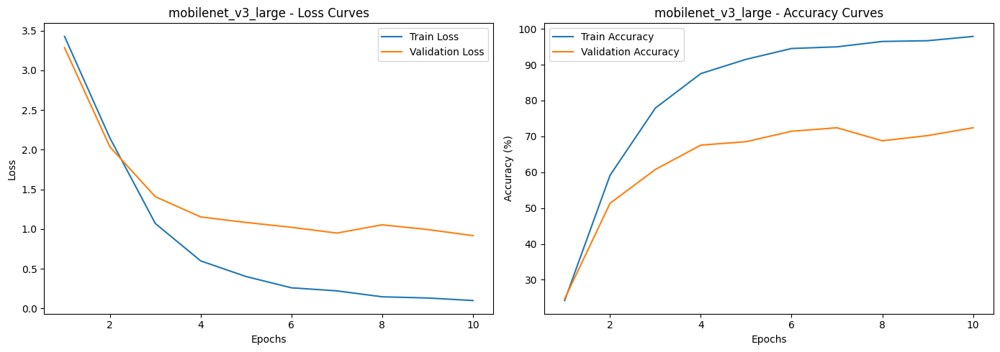

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ShuffleNet_V2_X1_0_Weights.IMAGENET1K_V1`. You can also use `weights=ShuffleNet_V2_X1_0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/shufflenetv2_x1-5666bf0f80.pth" to /root/.cache/torch/hub/checkpoints/shufflenetv2_x1-5666bf0f80.pth



📣 Training shufflenet_v2_x1_0 for 10 epochs


100%|██████████| 8.79M/8.79M [00:00<00:00, 36.7MB/s]


- Epoch 1: Metrics --> Train Loss: 3.8387 | Train  Acc: 7.5687 | Val Loss: 3.8315 | Val Acc: 7.5061 | Time: 0m 34.88s
- Epoch 2: Metrics --> Train Loss: 3.8001 | Train  Acc: 27.9419 | Val Loss: 3.7840 | Val Acc: 18.4019 | Time: 0m 30.53s
- Epoch 3: Metrics --> Train Loss: 3.7255 | Train  Acc: 38.3100 | Val Loss: 3.6670 | Val Acc: 21.5496 | Time: 0m 31.20s
- Epoch 4: Metrics --> Train Loss: 3.5660 | Train  Acc: 39.6579 | Val Loss: 3.5059 | Val Acc: 19.1283 | Time: 0m 32.78s
- Epoch 5: Metrics --> Train Loss: 3.3398 | Train  Acc: 42.0943 | Val Loss: 3.3610 | Val Acc: 22.7603 | Time: 0m 31.05s
- Epoch 6: Metrics --> Train Loss: 3.0699 | Train  Acc: 41.6278 | Val Loss: 3.1581 | Val Acc: 30.0242 | Time: 0m 30.34s
- Epoch 7: Metrics --> Train Loss: 2.8088 | Train  Acc: 42.1980 | Val Loss: 2.9648 | Val Acc: 30.7506 | Time: 0m 33.76s
- Epoch 8: Metrics --> Train Loss: 2.5226 | Train  Acc: 48.8854 | Val Loss: 2.7717 | Val Acc: 32.6877 | Time: 0m 30.49s
- Epoch 9: Metrics --> Train Loss: 2.2781 

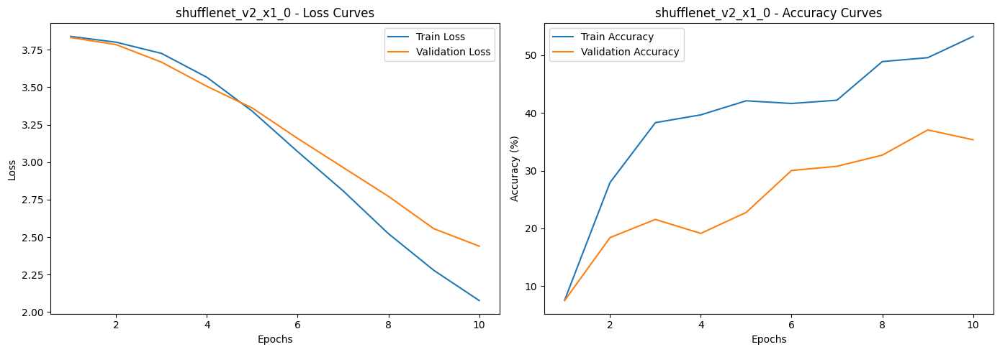

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=SqueezeNet1_1_Weights.IMAGENET1K_V1`. You can also use `weights=SqueezeNet1_1_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/squeezenet1_1-b8a52dc0.pth" to /root/.cache/torch/hub/checkpoints/squeezenet1_1-b8a52dc0.pth



📣 Training squeezenet1_1 for 10 epochs


100%|██████████| 4.73M/4.73M [00:00<00:00, 34.6MB/s]


- Epoch 1: Metrics --> Train Loss: 3.8461 | Train  Acc: 3.8880 | Val Loss: 3.8006 | Val Acc: 5.3269 | Time: 0m 29.47s
- Epoch 2: Metrics --> Train Loss: 3.4920 | Train  Acc: 12.3898 | Val Loss: 3.4460 | Val Acc: 12.5908 | Time: 0m 30.50s
- Epoch 3: Metrics --> Train Loss: 2.4863 | Train  Acc: 34.3183 | Val Loss: 2.8930 | Val Acc: 25.1816 | Time: 0m 30.82s
- Epoch 4: Metrics --> Train Loss: 1.6895 | Train  Acc: 53.3437 | Val Loss: 2.8091 | Val Acc: 32.9298 | Time: 0m 33.38s
- Epoch 5: Metrics --> Train Loss: 1.3291 | Train  Acc: 63.4007 | Val Loss: 2.6735 | Val Acc: 35.5932 | Time: 0m 30.57s
- Epoch 6: Metrics --> Train Loss: 1.0039 | Train  Acc: 72.5765 | Val Loss: 2.2724 | Val Acc: 44.3099 | Time: 0m 30.04s
- Epoch 7: Metrics --> Train Loss: 0.9510 | Train  Acc: 71.9544 | Val Loss: 2.1621 | Val Acc: 44.0678 | Time: 0m 30.54s
- Epoch 8: Metrics --> Train Loss: 0.6735 | Train  Acc: 80.7154 | Val Loss: 2.1136 | Val Acc: 47.6998 | Time: 0m 31.88s
- Epoch 9: Metrics --> Train Loss: 0.6792 

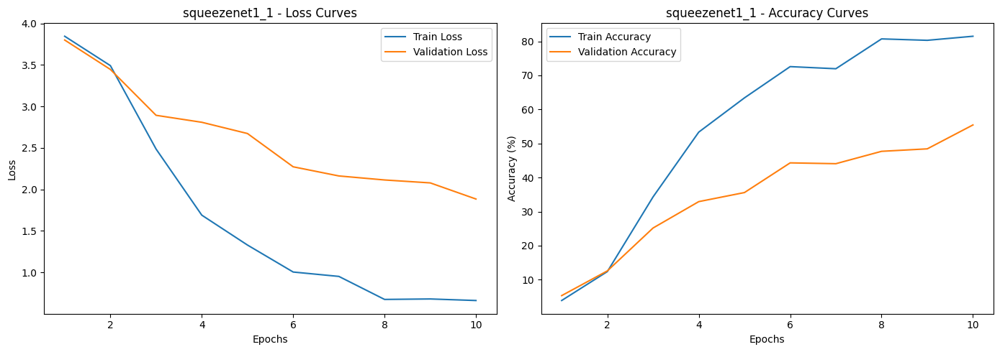


📣 Training convnext_tiny for 10 epochs


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ConvNeXt_Tiny_Weights.IMAGENET1K_V1`. You can also use `weights=ConvNeXt_Tiny_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/convnext_tiny-983f1562.pth" to /root/.cache/torch/hub/checkpoints/convnext_tiny-983f1562.pth
100%|██████████| 109M/109M [00:00<00:00, 147MB/s] 


- Epoch 1: Metrics --> Train Loss: 3.0326 | Train  Acc: 35.9772 | Val Loss: 2.4320 | Val Acc: 52.0581 | Time: 0m 43.08s
- Epoch 2: Metrics --> Train Loss: 1.1767 | Train  Acc: 84.3961 | Val Loss: 1.2125 | Val Acc: 71.1864 | Time: 0m 40.63s
- Epoch 3: Metrics --> Train Loss: 0.4743 | Train  Acc: 92.6387 | Val Loss: 0.8902 | Val Acc: 75.7869 | Time: 0m 46.12s
- Epoch 4: Metrics --> Train Loss: 0.2754 | Train  Acc: 96.2157 | Val Loss: 0.7647 | Val Acc: 78.4504 | Time: 0m 42.41s
- Epoch 5: Metrics --> Train Loss: 0.1803 | Train  Acc: 96.9414 | Val Loss: 0.6728 | Val Acc: 82.5666 | Time: 0m 44.25s
- Epoch 6: Metrics --> Train Loss: 0.1247 | Train  Acc: 97.9782 | Val Loss: 0.6848 | Val Acc: 80.1453 | Time: 0m 43.57s
- Epoch 7: Metrics --> Train Loss: 0.1083 | Train  Acc: 98.0819 | Val Loss: 0.6250 | Val Acc: 81.5981 | Time: 0m 40.55s
- Epoch 8: Metrics --> Train Loss: 0.0843 | Train  Acc: 98.4448 | Val Loss: 0.6616 | Val Acc: 82.3245 | Time: 0m 45.70s
- Epoch 9: Metrics --> Train Loss: 0.060

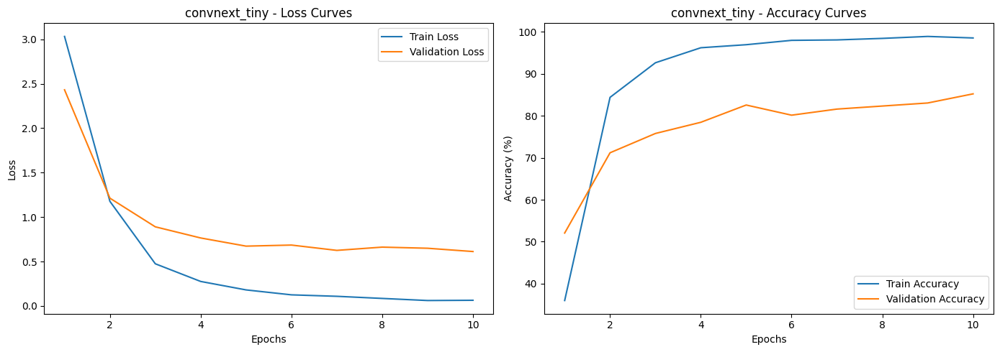


=== Best Validation Accuracies ===
mobilenet_v3_large  : 72.40%
shufflenet_v2_x1_0  : 37.05%
squeezenet1_1       : 55.45%
convnext_tiny       : 85.23%

🎉 Top performer: convnext_tiny with 85.23% val accuracy


In [ ]:
#################################################################################################################################################################################

# #### DO NOT RUNN IT, JUST FOR TRAINING ####
# #### DO NOT RUNN IT, JUST FOR TRAINING ####
# #### DO NOT RUNN IT, JUST FOR TRAINING ####

# ── 2) Train & evaluate each ────────────────────────────────────────────────────
results = []
EPOCHS = 10  # quick comparison; raise to 5–10 if time allows

for name, factory in model_factories.items():
    print(f"\n📣 Training {name} for {EPOCHS} epochs")
    model = factory(NUM_CLASSES).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)

    tr_l, tr_a, va_l, va_a = train(
        model, train_loader, val_loader,
        criterion, optimizer, device,
        num_epochs=EPOCHS,
        model_name=f"{name}_yoga.pt"
    )
    best_val = max(va_a)
    results.append((name, best_val))

    plot_training_results(tr_l, va_l, tr_a, va_a, model_name=name)

# ── 3) Summary ─────────────────────────────────────────────────────────────────
print("\n=== Best Validation Accuracies ===")
for name, acc in results:
    print(f"{name:<20}: {acc:.2f}%")
best_name, best_acc = max(results, key=lambda x: x[1])
print(f"\n🎉 Top performer: {best_name} with {best_acc:.2f}% val accuracy")

#################################################################################################################################################################################

📊 Pretrained Model Evaluation:

In the following block of code, we load the saved checkpoints for each pretrained model and evaluate their performance. For each model, we:
- Load the pretrained weights and adapt the output layer.
- Run inference on the train, validation, and test sets.
- Compute metrics: accuracy, precision, recall, F1-score, confusion matrix, and inference time.
- Count the number of trainable parameters.
- Store and print all results in a summary table.

This allows us to compare all architectures side-by-side and determine the most effective one.



Loading resnet18_yoga.pt → factory key 'resnet18'


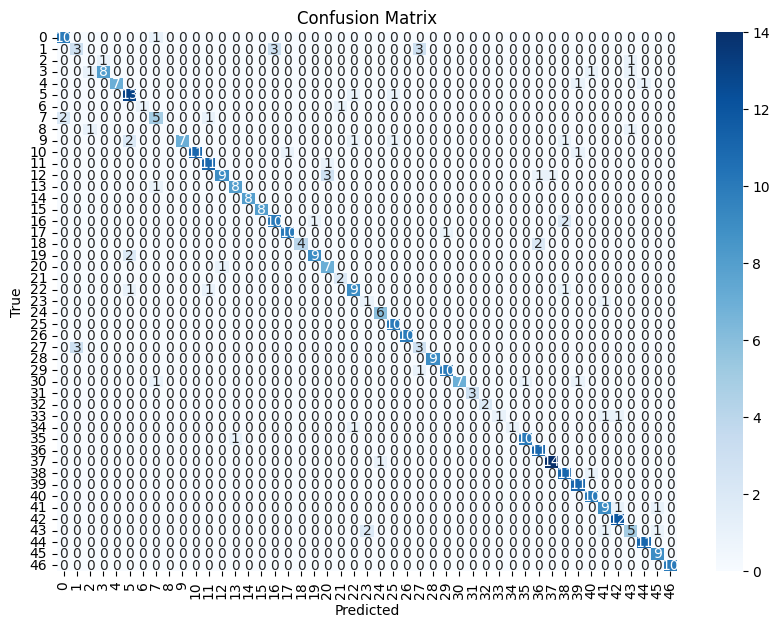

Confusion Matrix for resnet18:
[[10  0  0 ...  0  0  0]
 [ 0  3  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]
 ...
 [ 0  0  0 ... 11  0  0]
 [ 0  0  0 ...  0  9  0]
 [ 0  0  0 ...  0  0 10]]

Loading resnet34_yoga.pt → factory key 'resnet34'


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 162MB/s]


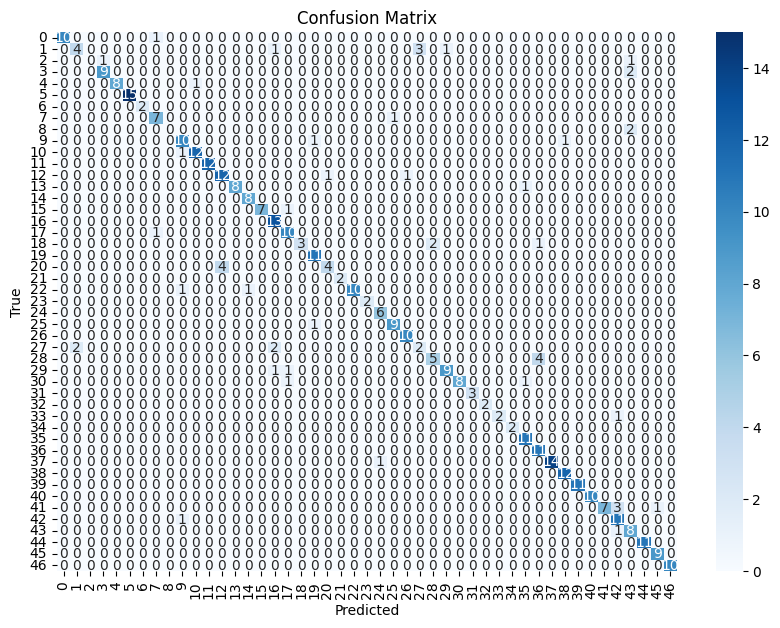

Confusion Matrix for resnet34:
[[10  0  0 ...  0  0  0]
 [ 0  4  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]
 ...
 [ 0  0  0 ... 11  0  0]
 [ 0  0  0 ...  0  9  0]
 [ 0  0  0 ...  0  0 10]]

Loading resnet50_yoga.pt → factory key 'resnet50'


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 187MB/s]


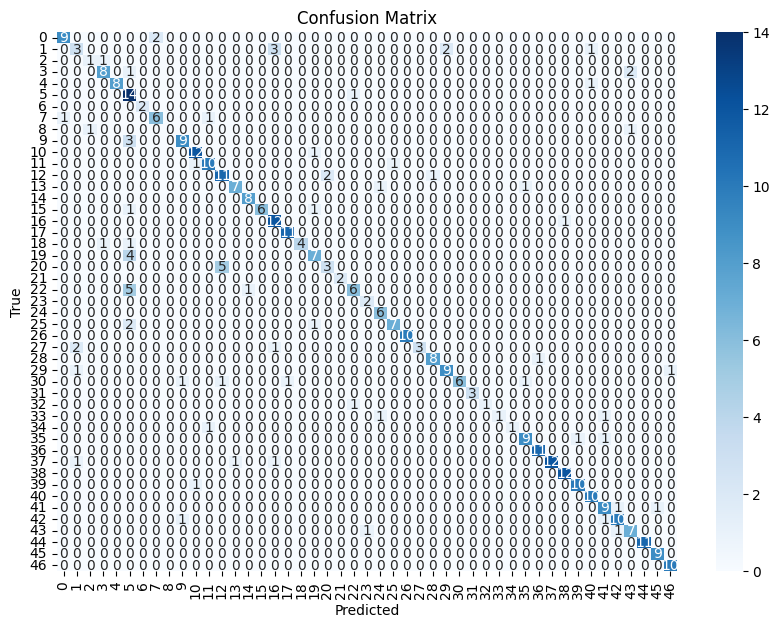

Confusion Matrix for resnet50:
[[ 9  0  0 ...  0  0  0]
 [ 0  3  0 ...  0  0  0]
 [ 0  0  1 ...  0  0  0]
 ...
 [ 0  0  0 ... 11  0  0]
 [ 0  0  0 ...  0  9  0]
 [ 0  0  0 ...  0  0 10]]

Loading wide_resnet50_2_yoga.pt → factory key 'wide_resnet50_2'


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Wide_ResNet50_2_Weights.IMAGENET1K_V1`. You can also use `weights=Wide_ResNet50_2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/wide_resnet50_2-95faca4d.pth" to /root/.cache/torch/hub/checkpoints/wide_resnet50_2-95faca4d.pth
100%|██████████| 132M/132M [00:00<00:00, 154MB/s]


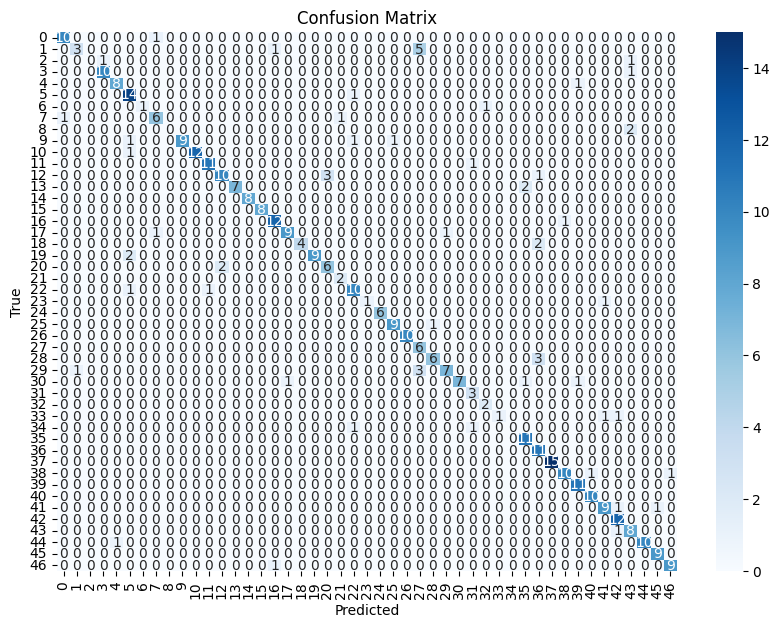

Confusion Matrix for wide_resnet50_2:
[[10  0  0 ...  0  0  0]
 [ 0  3  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]
 ...
 [ 0  0  0 ... 10  0  0]
 [ 0  0  0 ...  0  9  0]
 [ 0  0  0 ...  0  0  9]]

Loading resnext50_32x4d_yoga.pt → factory key 'resnext50_32x4d'


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNeXt50_32X4D_Weights.IMAGENET1K_V1`. You can also use `weights=ResNeXt50_32X4D_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnext50_32x4d-7cdf4587.pth" to /root/.cache/torch/hub/checkpoints/resnext50_32x4d-7cdf4587.pth
100%|██████████| 95.8M/95.8M [00:00<00:00, 193MB/s]


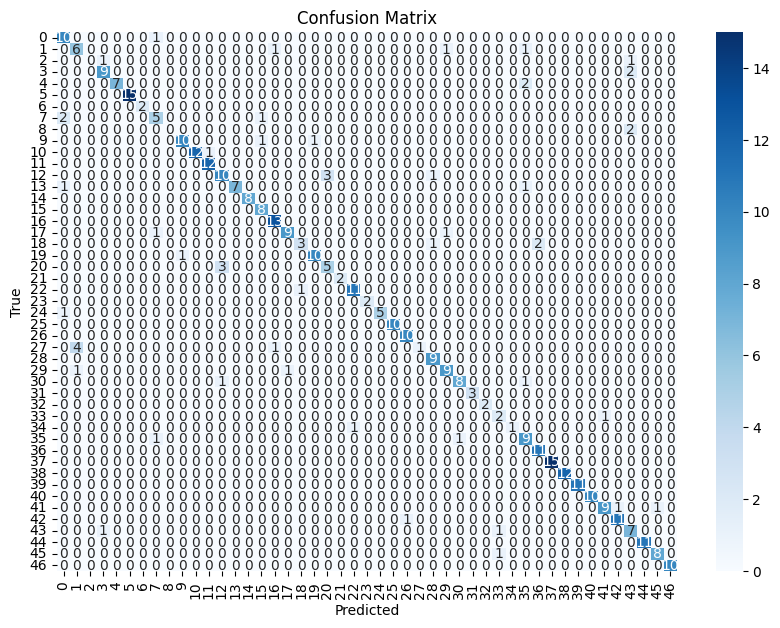

Confusion Matrix for resnext50_32x4d:
[[10  0  0 ...  0  0  0]
 [ 0  6  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]
 ...
 [ 0  0  0 ... 11  0  0]
 [ 0  0  0 ...  0  8  0]
 [ 0  0  0 ...  0  0 10]]

Loading densenet121_yoga.pt → factory key 'densenet121'


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth
100%|██████████| 30.8M/30.8M [00:00<00:00, 141MB/s]


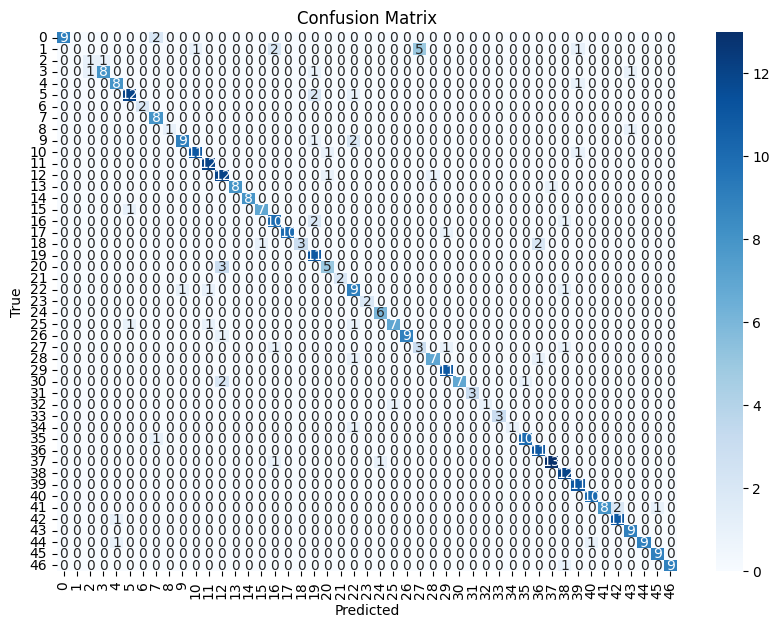

Confusion Matrix for densenet121:
[[9 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 1 ... 0 0 0]
 ...
 [0 0 0 ... 9 0 0]
 [0 0 0 ... 0 9 0]
 [0 0 0 ... 0 0 9]]

Loading densenet169_yoga.pt → factory key 'densenet169'


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet169_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet169_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/densenet169-b2777c0a.pth" to /root/.cache/torch/hub/checkpoints/densenet169-b2777c0a.pth
100%|██████████| 54.7M/54.7M [00:00<00:00, 189MB/s]


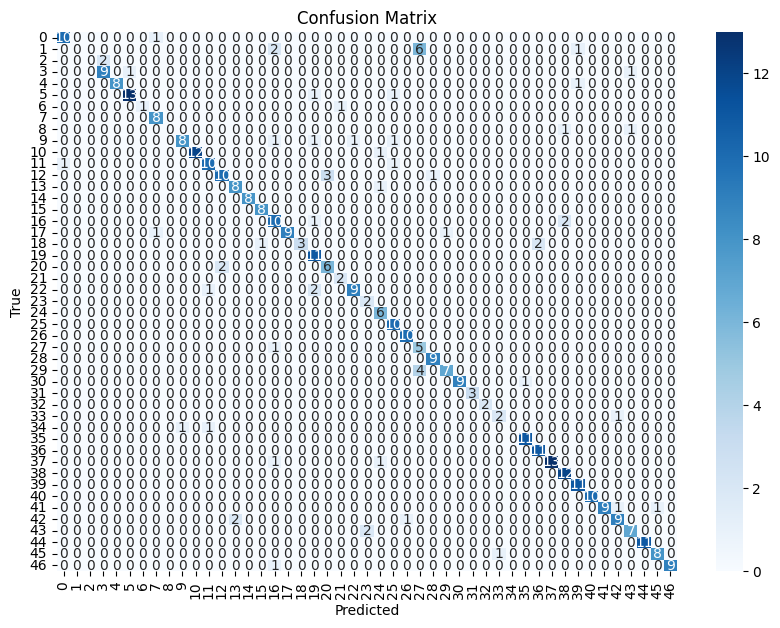

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth


Confusion Matrix for densenet169:
[[10  0  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]
 ...
 [ 0  0  0 ... 11  0  0]
 [ 0  0  0 ...  0  8  0]
 [ 0  0  0 ...  0  0  9]]

Loading efficientnet_b0_yoga.pt → factory key 'efficientnet_b0'


100%|██████████| 20.5M/20.5M [00:00<00:00, 142MB/s]


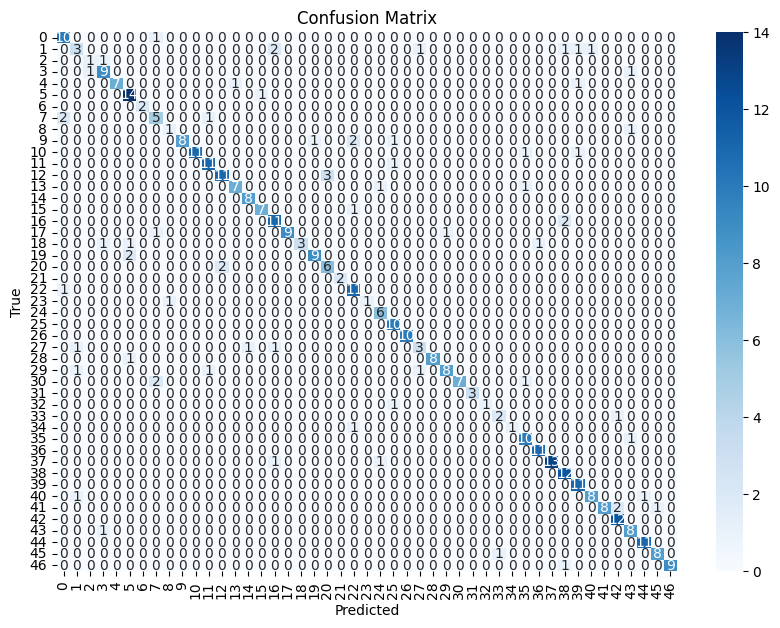

Confusion Matrix for efficientnet_b0:
[[10  0  0 ...  0  0  0]
 [ 0  3  0 ...  0  0  0]
 [ 0  0  1 ...  0  0  0]
 ...
 [ 0  0  0 ... 11  0  0]
 [ 0  0  0 ...  0  8  0]
 [ 0  0  0 ...  0  0  9]]

Loading efficientnet_b1_yoga.pt → factory key 'efficientnet_b1'


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B1_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B1_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/efficientnet_b1_rwightman-bac287d4.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b1_rwightman-bac287d4.pth
100%|██████████| 30.1M/30.1M [00:00<00:00, 98.1MB/s]


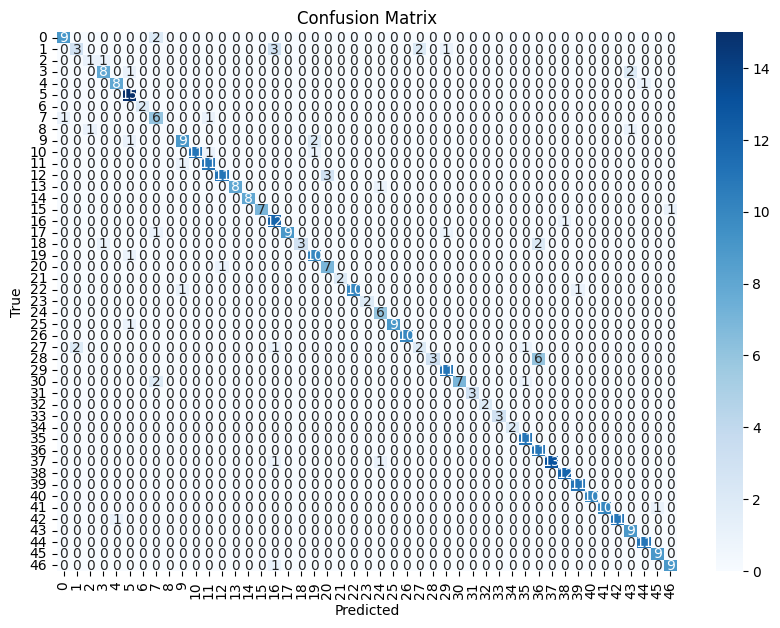

Confusion Matrix for efficientnet_b1:
[[ 9  0  0 ...  0  0  0]
 [ 0  3  0 ...  0  0  0]
 [ 0  0  1 ...  0  0  0]
 ...
 [ 0  0  0 ... 11  0  0]
 [ 0  0  0 ...  0  9  0]
 [ 0  0  0 ...  0  0  9]]

Loading efficientnet_b2_yoga.pt → factory key 'efficientnet_b2'


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B2_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/efficientnet_b2_rwightman-c35c1473.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b2_rwightman-c35c1473.pth
100%|██████████| 35.2M/35.2M [00:00<00:00, 169MB/s]


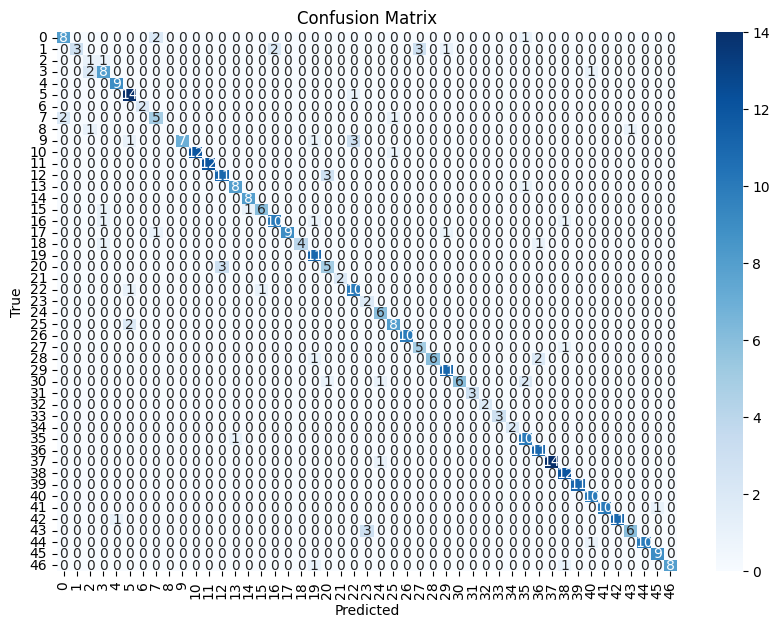

Confusion Matrix for efficientnet_b2:
[[ 8  0  0 ...  0  0  0]
 [ 0  3  0 ...  0  0  0]
 [ 0  0  1 ...  0  0  0]
 ...
 [ 0  0  0 ... 10  0  0]
 [ 0  0  0 ...  0  9  0]
 [ 0  0  0 ...  0  0  8]]

Loading vgg16_bn_yoga.pt → factory key 'vgg16_bn'


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_BN_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_BN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16_bn-6c64b313.pth" to /root/.cache/torch/hub/checkpoints/vgg16_bn-6c64b313.pth
100%|██████████| 528M/528M [00:03<00:00, 168MB/s]


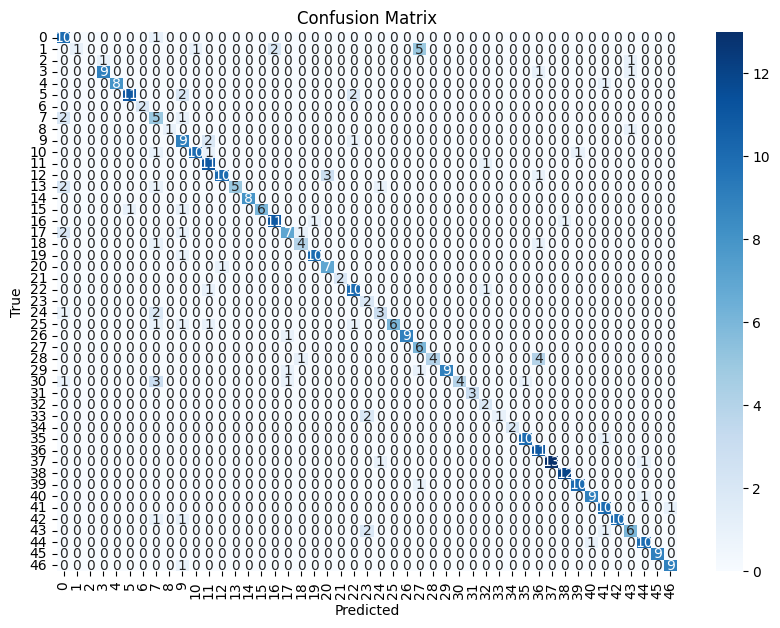

Confusion Matrix for vgg16_bn:
[[10  0  0 ...  0  0  0]
 [ 0  1  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]
 ...
 [ 0  0  0 ... 10  0  0]
 [ 0  0  0 ...  0  9  0]
 [ 0  0  0 ...  0  0  9]]

Loading vgg19_bn_yoga.pt → factory key 'vgg19_bn'


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_BN_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_BN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19_bn-c79401a0.pth" to /root/.cache/torch/hub/checkpoints/vgg19_bn-c79401a0.pth
100%|██████████| 548M/548M [00:06<00:00, 89.0MB/s]


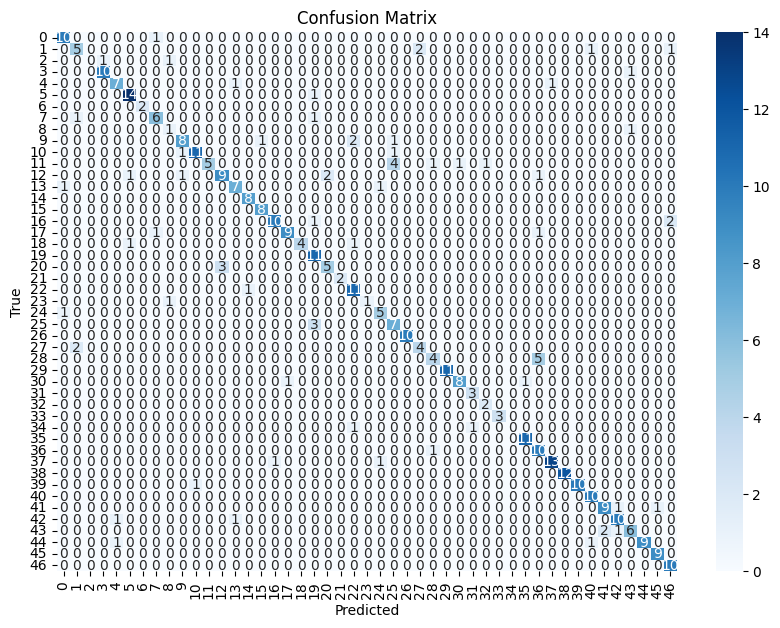

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth


Confusion Matrix for vgg19_bn:
[[10  0  0 ...  0  0  0]
 [ 0  5  0 ...  0  0  1]
 [ 0  0  0 ...  0  0  0]
 ...
 [ 0  0  0 ...  9  0  0]
 [ 0  0  0 ...  0  9  0]
 [ 0  0  0 ...  0  0 10]]

Loading mobilenet_v2_yoga.pt → factory key 'mobilenet_v2'


100%|██████████| 13.6M/13.6M [00:00<00:00, 121MB/s]


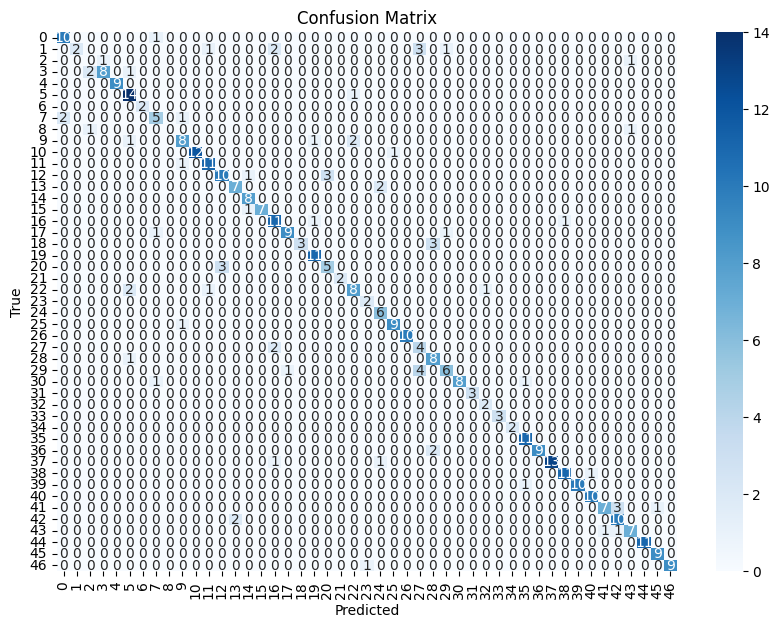

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V3_Large_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V3_Large_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/mobilenet_v3_large-8738ca79.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v3_large-8738ca79.pth


Confusion Matrix for mobilenet_v2:
[[10  0  0 ...  0  0  0]
 [ 0  2  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]
 ...
 [ 0  0  0 ... 11  0  0]
 [ 0  0  0 ...  0  9  0]
 [ 0  0  0 ...  0  0  9]]

Loading mobilenet_v3_large_yoga.pt → factory key 'mobilenet_v3_large'


100%|██████████| 21.1M/21.1M [00:00<00:00, 138MB/s]


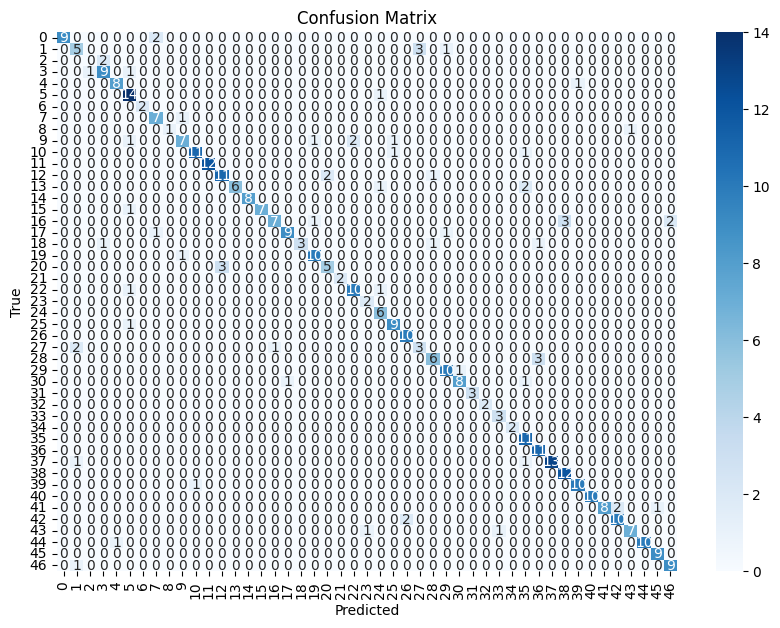

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ShuffleNet_V2_X1_0_Weights.IMAGENET1K_V1`. You can also use `weights=ShuffleNet_V2_X1_0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/shufflenetv2_x1-5666bf0f80.pth" to /root/.cache/torch/hub/checkpoints/shufflenetv2_x1-5666bf0f80.pth


Confusion Matrix for mobilenet_v3_large:
[[ 9  0  0 ...  0  0  0]
 [ 0  5  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]
 ...
 [ 0  0  0 ... 10  0  0]
 [ 0  0  0 ...  0  9  0]
 [ 0  1  0 ...  0  0  9]]

Loading shufflenet_v2_x1_0_yoga.pt → factory key 'shufflenet_v2_x1_0'


100%|██████████| 8.79M/8.79M [00:00<00:00, 94.5MB/s]


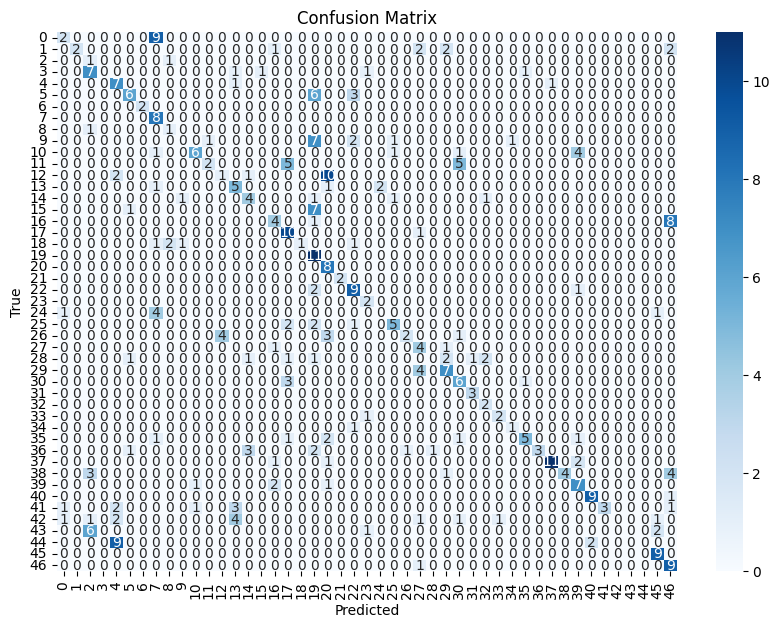

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=SqueezeNet1_1_Weights.IMAGENET1K_V1`. You can also use `weights=SqueezeNet1_1_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/squeezenet1_1-b8a52dc0.pth" to /root/.cache/torch/hub/checkpoints/squeezenet1_1-b8a52dc0.pth


Confusion Matrix for shufflenet_v2_x1_0:
[[2 0 0 ... 0 0 0]
 [0 2 0 ... 0 0 2]
 [0 0 1 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 9 0]
 [0 0 0 ... 0 0 9]]

Loading squeezenet1_1_yoga.pt → factory key 'squeezenet1_1'


100%|██████████| 4.73M/4.73M [00:00<00:00, 32.3MB/s]


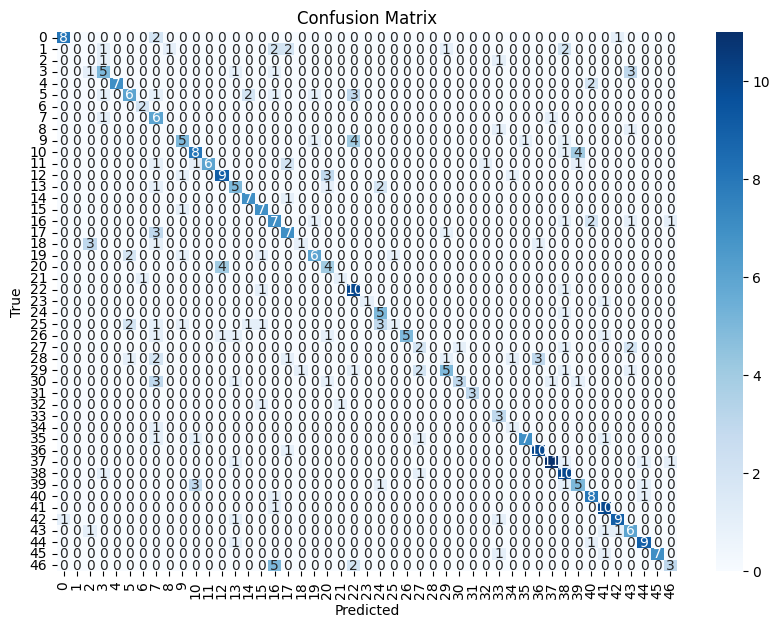

Confusion Matrix for squeezenet1_1:
[[8 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 9 0 0]
 [0 0 0 ... 0 7 0]
 [0 0 0 ... 0 0 3]]

Loading convnext_tiny_yoga.pt → factory key 'convnext_tiny'


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ConvNeXt_Tiny_Weights.IMAGENET1K_V1`. You can also use `weights=ConvNeXt_Tiny_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/convnext_tiny-983f1562.pth" to /root/.cache/torch/hub/checkpoints/convnext_tiny-983f1562.pth
100%|██████████| 109M/109M [00:00<00:00, 158MB/s] 


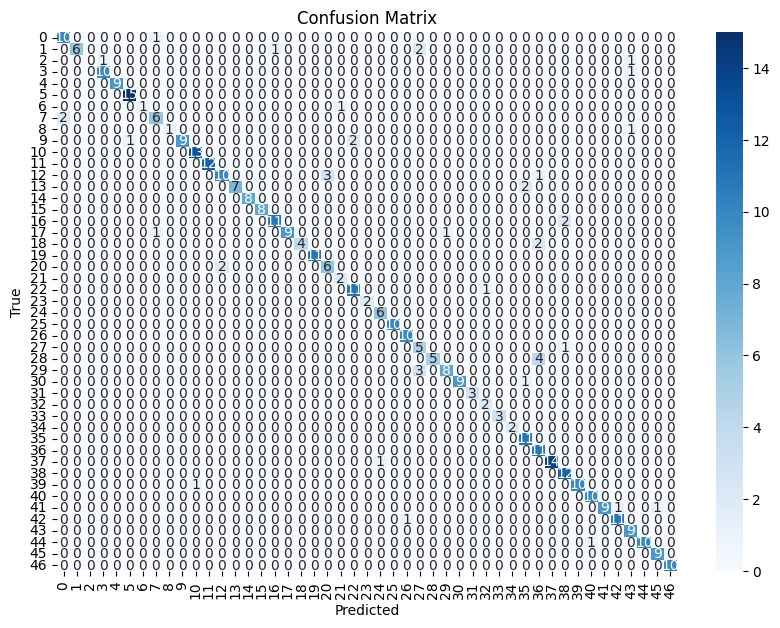

Confusion Matrix for convnext_tiny:
[[10  0  0 ...  0  0  0]
 [ 0  6  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]
 ...
 [ 0  0  0 ... 10  0  0]
 [ 0  0  0 ...  0  9  0]
 [ 0  0  0 ...  0  0 10]]
+--------------------+--------------+-------------+-----------+------------+-------------+----------+------------+------------------------------+
| Model              | Parameters   | Train Acc   | Val Acc   | Test Acc   |   Precision |   Recall |   F1-Score | Inference Time (sec/image)   |
+====================+==============+=============+===========+============+=============+==========+============+==============================+
| resnet18           | 11,200,623   | 93.52%      | 82.57%    | 83.57%     |        0.85 |     0.84 |       0.83 | 0.000211 sec/image           |
+--------------------+--------------+-------------+-----------+------------+-------------+----------+------------+------------------------------+
| resnet34           | 21,308,783   | 93.83%      | 83.29%    | 87.44%     |  

In [ ]:
#################################################################################################################################################################################

import os
import torch
from tabulate import tabulate  # Import for neat table printing
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import time
import numpy as np

# List of checkpoints for your selected models
checkpoints = [
    "resnet18_yoga.pt",
    "resnet34_yoga.pt",
    "resnet50_yoga.pt",
    "wide_resnet50_2_yoga.pt",
    "resnext50_32x4d_yoga.pt",
    "densenet121_yoga.pt",
    "densenet169_yoga.pt",
    "efficientnet_b0_yoga.pt",
    "efficientnet_b1_yoga.pt",
    "efficientnet_b2_yoga.pt",
    "vgg16_bn_yoga.pt",
    "vgg19_bn_yoga.pt",
    "mobilenet_v2_yoga.pt",
    "mobilenet_v3_large_yoga.pt",
    "shufflenet_v2_x1_0_yoga.pt",
    "squeezenet1_1_yoga.pt",
    "convnext_tiny_yoga.pt",
]

# Function to compute model parameters
def compute_model_params(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

# Results container
results = []

# Loop through the checkpoints
for ckpt in checkpoints:
    key = ckpt.replace("_yoga.pt", "")  # Strip "_yoga.pt" to match the dictionary keys
    print(f"\nLoading {ckpt} → factory key '{key}'")

    # Check if the model is in the dictionary
    if key not in model_factories:
        print(f"⚠️ Model {key} not found in model_factories. Skipping.")
        continue

    # Instantiate model from the factory mapping and load weights
    model = model_factories[key](NUM_CLASSES).to(device)
    model.load_state_dict(torch.load(os.path.join(saved_dir, ckpt), map_location=device))
    model.eval()

    # Run inference and get metrics
    acc_train = inference(model, train_loader, device)
    acc_val = inference(model, val_loader, device)
    acc_test, precision, recall, f1, inference_time = inference_with_metrics(model, test_loader, device)

    # Compute number of parameters
    param_count = compute_model_params(model)

    # Compute additional metrics (confusion matrix, precision, recall, F1)
    acc, precision, recall, f1, cm = compute_metrics(model, test_loader, device)

    # Print the confusion matrix for the current model
    print(f"Confusion Matrix for {key}:")
    print(cm)

    # Append results with the new metrics
    results.append([
        key,
        f"{param_count:,}",   # Display parameter count with commas
        f"{acc_train:.2f}%",   # Train accuracy
        f"{acc_val:.2f}%",     # Validation accuracy
        f"{acc_test:.2f}%",    # Test accuracy
        f"{precision:.2f}",    # Precision
        f"{recall:.2f}",       # Recall
        f"{f1:.2f}",           # F1-Score
        f"{inference_time:.6f} sec/image",  # Inference time per image
    ])

# Print the summary table
headers = ["Model", "Parameters", "Train Acc", "Val Acc", "Test Acc", "Precision", "Recall", "F1-Score", "Inference Time (sec/image)"]
print(tabulate(results, headers=headers, tablefmt="grid"))

#################################################################################################################################################################################

📌 **Observations:**

Based on the updated comparison, **ConvNeXt Tiny** clearly emerged as the top-performing model with a test accuracy of **89.37%**, the highest F1-score (**0.89**), and excellent generalization. It balances strong performance with reasonable parameter size and fast inference, making it the best candidate for fine-tuning.

Other notable models:
- **ResNet34** and **ResNeXt50_32x4d** achieved excellent results (test accuracies above **86%** and F1-scores of **0.86–0.87**) with efficient inference and moderate model sizes.
- **EfficientNet-B1** also stood out with a strong accuracy (**86.23%**) and very compact size (**6.5M parameters**), offering an ideal trade-off for lightweight applications.
- **EfficientNet-B2** and **MobileNetV3-Large** maintained high accuracy while remaining efficient, though slightly below B1 and ResNeXt.

On the other hand:
- **VGG16_bn** and **VGG19_bn** underperformed despite their extremely large size, confirming they are not ideal for this task.
- Lightweight architectures like **ShuffleNet v2** and **SqueezeNet** had significantly lower accuracy and F1, suggesting that this classification task requires higher-capacity models.

📌 **Conclusion:**  
**ConvNeXt Tiny** stands out as the most promising architecture for further fine-tuning and deployment, with **ResNeXt50_32x4d**, **ResNet34**, and **EfficientNet-B1** as strong alternatives depending on resource constraints.


## **🧩 4.4 Custom CNN with Depthwise Separable Convolutions**

In this section, we experiment with custom lightweight CNN architectures designed to reduce model complexity and training cost without sacrificing too much accuracy. We implement two models:
- A **Depthwise Separable CNN**, inspired by MobileNet, that uses depthwise and pointwise convolutions.
- A **LightweightNet**, which adds squeeze-and-excitation (SE) blocks and inverted bottlenecks for enhanced efficiency and feature recalibration.

We evaluate these models against the same training, validation, and test sets to compare performance and computational efficiency.

🧱 `DepthwiseSeparableCNN` Architecture:

This model is a custom convolutional neural network that uses **depthwise separable convolutions** to significantly reduce parameter count and computation. Each block:
- Applies a depthwise convolution per channel
- Follows with a 1×1 pointwise convolution to mix channels
- Uses max pooling for downsampling

After three such blocks, the output is flattened and passed through fully connected layers to classify the input. This design is efficient and inspired by MobileNet-like architectures.


In [ ]:
#################################################################################################################################################################################

import torch
import torch.nn as nn
import torch.nn.functional as F

class DepthwiseSeparableCNN(nn.Module):
    def __init__(self, num_classes):
        super(DepthwiseSeparableCNN, self).__init__()

        # ─── 1) First depthwise+pointwise pair ───────────────────────────────────
        # Depthwise on 3 channels (out_channels = 3, groups=3),
        # followed by pointwise to expand to 32 channels.
        self.dw_conv1 = nn.Conv2d(3, 3, kernel_size=3, padding=1, groups=3)   # → [3×H×W]
        self.pw_conv1 = nn.Conv2d(3, 32, kernel_size=1, bias=False)           # → [32×H×W]

        # ─── 2) Second depthwise+pointwise pair ──────────────────────────────────
        # Depthwise on 32 channels, then pointwise to expand to 64 channels.
        self.dw_conv2 = nn.Conv2d(32, 32, kernel_size=3, padding=1, groups=32) # → [32×H×W]
        self.pw_conv2 = nn.Conv2d(32, 64, kernel_size=1, bias=False)          # → [64×H×W]

        # ─── 3) Third depthwise+pointwise pair ───────────────────────────────────
        # Depthwise on 64 channels, then pointwise to expand to 128 channels.
        self.dw_conv3 = nn.Conv2d(64, 64, kernel_size=3, padding=1, groups=64) # → [64×H×W]
        self.pw_conv3 = nn.Conv2d(64, 128, kernel_size=1, bias=False)         # → [128×H×W]

        # ─── Max‐pooling after each depthwise block ───────────────────────────────
        self.pool = nn.MaxPool2d(2, 2)

        # ─── Fully‐connected layers ────────────────────────────────────────────────
        # After 3 pools on a 224×224 input, the feature map is 128×28×28.
        # So flattening yields 128 * 28 * 28 features.
        self.fc1 = nn.Linear(128 * 28 * 28, 512)
        self.fc2 = nn.Linear(512, num_classes)

    def forward(self, x):
        # ─── BLOCK 1 ───────────────────────────────────────────────────────────
        # Depthwise → ReLU → Pointwise → ReLU → Pool
        x = F.relu(self.dw_conv1(x))  # shape: [batch, 3, 224, 224] → [batch, 3, 224, 224]
        x = F.relu(self.pw_conv1(x))  # shape: [batch, 32, 224, 224]
        x = self.pool(x)              # shape: [batch, 32, 112, 112]

        # ─── BLOCK 2 ───────────────────────────────────────────────────────────
        x = F.relu(self.dw_conv2(x))  # shape: [batch, 32, 112, 112]
        x = F.relu(self.pw_conv2(x))  # shape: [batch, 64, 112, 112]
        x = self.pool(x)              # shape: [batch, 64, 56, 56]

        # ─── BLOCK 3 ───────────────────────────────────────────────────────────
        x = F.relu(self.dw_conv3(x))  # shape: [batch, 64, 56, 56]
        x = F.relu(self.pw_conv3(x))  # shape: [batch, 128, 56, 56]
        x = self.pool(x)              # shape: [batch, 128, 28, 28]

        # ─── FLATTEN + FULLY CONNECTED ─────────────────────────────────────────
        x = x.view(x.size(0), -1)       # shape: [batch, 128*28*28]
        x = F.relu(self.fc1(x))         # shape: [batch, 512]
        x = self.fc2(x)                 # shape: [batch, num_classes]
        return x

# ─── Instantiate and test ─────────────────────────────────────────────────────
model_depthwise_separable_cnn = DepthwiseSeparableCNN(num_classes=NUM_CLASSES).to(device)
print(model_depthwise_separable_cnn)

#################################################################################################################################################################################

DepthwiseSeparableCNN(
  (dw_conv1): Conv2d(3, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=3)
  (pw_conv1): Conv2d(3, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (dw_conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32)
  (pw_conv2): Conv2d(32, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (dw_conv3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=64)
  (pw_conv3): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=100352, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=47, bias=True)
)


🧠 `LightweightNet` with SE Blocks and Bottlenecks:

This model builds on the idea of depthwise separable convolutions by incorporating:
- **Squeeze-and-Excitation (SE) blocks** for channel-wise attention
- **Inverted bottleneck blocks**, inspired by MobileNetV2, to expand and compress feature maps efficiently
- **Adaptive average pooling** and a 1×1 conv head before classification

The network is structured in blocks defined by a configuration list and emphasizes high performance with low parameter count.


In [ ]:
#################################################################################################################################################################################

import torch
import torch.nn as nn
import torch.nn.functional as F

class SEBlock(nn.Module):
    def __init__(self, in_channels, reduction=8):
        super().__init__()
        mid = max(1, in_channels // reduction)
        self.fc1 = nn.Conv2d(in_channels, mid, kernel_size=1, bias=True)
        self.relu = nn.ReLU(inplace=True)
        self.fc2 = nn.Conv2d(mid, in_channels, kernel_size=1, bias=True)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        s = F.adaptive_avg_pool2d(x, 1)
        s = self.relu(self.fc1(s))
        s = self.sigmoid(self.fc2(s))
        return x * s

class DWConv(nn.Module):
    def __init__(self, in_channels, kernel_size=3, stride=1, padding=1):
        super().__init__()
        self.dw = nn.Conv2d(in_channels, in_channels, kernel_size=kernel_size,
                            stride=stride, padding=padding, groups=in_channels, bias=False)
        self.bn = nn.BatchNorm2d(in_channels)
        self.act = nn.ReLU(inplace=True)

    def forward(self, x):
        return self.act(self.bn(self.dw(x)))

class Bottleneck(nn.Module):
    def __init__(self, in_ch, out_ch, expansion=2, stride=1, use_se=True):
        super().__init__()
        mid_ch = in_ch * expansion
        self.use_res_connect = (stride == 1 and in_ch == out_ch)

        # 1×1 expand
        self.conv1 = nn.Conv2d(in_ch, mid_ch, kernel_size=1, bias=False)
        self.bn1 = nn.BatchNorm2d(mid_ch)
        # 3×3 depthwise
        self.dw = nn.Conv2d(mid_ch, mid_ch, kernel_size=3, stride=stride,
                            padding=1, groups=mid_ch, bias=False)
        self.bn2 = nn.BatchNorm2d(mid_ch)
        # SE
        self.se = SEBlock(mid_ch, reduction=8) if use_se else nn.Identity()
        # 1×1 project
        self.conv2 = nn.Conv2d(mid_ch, out_ch, kernel_size=1, bias=False)
        self.bn3 = nn.BatchNorm2d(out_ch)
        self.act = nn.ReLU(inplace=True)

    def forward(self, x):
        out = self.act(self.bn1(self.conv1(x)))
        out = self.act(self.bn2(self.dw(out)))
        out = self.se(out)
        out = self.bn3(self.conv2(out))
        if self.use_res_connect:
            return x + out
        else:
            return out

class LightweightNet(nn.Module):
    def __init__(self, num_classes=10, input_channels=3):
        super().__init__()
        # Stem
        self.stem = nn.Sequential(
            nn.Conv2d(input_channels, 16, kernel_size=3, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(16),
            nn.ReLU(inplace=True)
        )

        # Bottleneck config: (in_ch, out_ch, expansion, stride, repeats, use_se)
        cfgs = [
            (16,  16, 2, 1, 1, False),   # keep spatial=1/2
            (16,  32, 2, 2, 1, True),    # downsample to 1/4
            (32,  32, 2, 1, 1, True),
            (32,  64, 2, 2, 1, True),    # downsample to 1/8
            (64,  64, 2, 1, 1, True),
            (64, 128, 2, 2, 1, True),    # downsample to 1/16
            (128,128, 2, 1, 1, True),
        ]

        blocks = []
        for in_c, out_c, t, s, n, se in cfgs:
            for i in range(n):
                stride = s if i == 0 else 1
                blocks.append(Bottleneck(in_c if i == 0 else prev_out, out_c,
                                         expansion=t, stride=stride, use_se=se))
                prev_out = out_c
        self.blocks = nn.Sequential(*blocks)

        # Head
        self.conv_head = nn.Sequential(
            nn.Conv2d(prev_out, 128, kernel_size=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True)
        )

        # Classifier
        self.global_pool = nn.AdaptiveAvgPool2d(1)
        self.classifier = nn.Linear(128, num_classes)

        # Weight init
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out')
            elif isinstance(m, nn.BatchNorm2d):
                m.weight.data.fill_(1)
                m.bias.data.zero_()

    def forward(self, x):
        x = self.stem(x)      # → (B, 16, H/2, W/2)
        x = self.blocks(x)    # → (B, 128, H/16, W/16)
        x = self.conv_head(x) # → (B, 128, H/16, W/16)
        x = self.global_pool(x)
        x = x.view(x.size(0), -1)  # → (B, 128)
        x = self.classifier(x)     # → (B, num_classes)
        return x

# If you run this script directly, it will print param count:
if __name__ == "__main__":
    model = LightweightNet(num_classes=10, input_channels=3)
    total_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f"LightweightNet total params: {total_params/1e6:.2f} M")

#################################################################################################################################################################################


LightweightNet total params: 0.18 M


📊 Evaluation of Custom CNN Architectures:

Here, we load the previously trained checkpoints for `DepthwiseSeparableCNN` and `LightweightNet`, and evaluate them across all three datasets:
- Training and validation accuracy are computed using standard inference
- On the test set, we calculate precision, recall, F1-score, accuracy, and inference time
- We also display the confusion matrix for visual error analysis and count model parameters

The results are summarized in a comparison table to assess the trade-offs between performance and efficiency.



Loading checkpoint 'depthwise_separable_cnn_yoga.pt' → model key 'depthwise_separable_cnn'


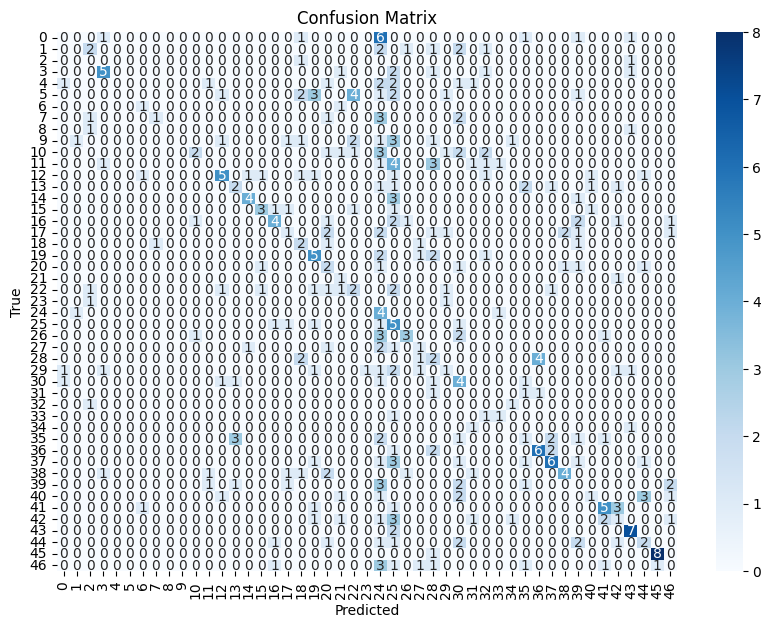


Confusion Matrix for 'depthwise_separable_cnn':
[[0 0 0 ... 0 0 0]
 [0 0 2 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 2 0 0]
 [0 0 0 ... 0 8 0]
 [0 0 0 ... 0 1 0]]

Loading checkpoint 'lightweightnet_yoga.pt' → model key 'lightweightnet'


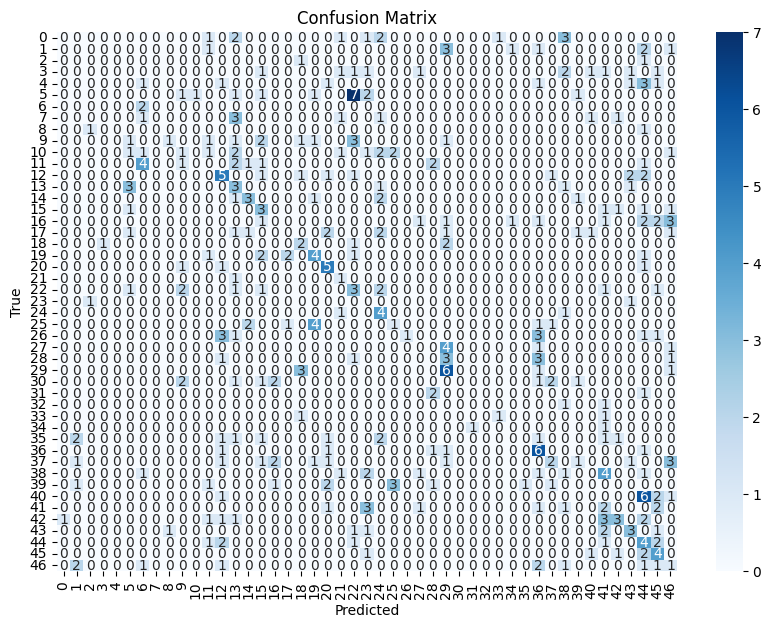


Confusion Matrix for 'lightweightnet':
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 2 0 1]
 [0 0 0 ... 1 0 0]
 ...
 [0 0 0 ... 4 2 0]
 [0 0 0 ... 2 4 0]
 [0 2 0 ... 1 1 1]]

+-------------------------+--------------+-------------+-----------+------------+-------------+----------+------------+------------------------------+
| Model                   | Parameters   | Train Acc   | Val Acc   | Test Acc   |   Precision |   Recall |   F1-Score | Inference Time (sec/image)   |
+=========================+==============+=============+===========+============+=============+==========+============+==============================+
| depthwise_separable_cnn | 51,416,173   | 25.92%      | 25.91%    | 24.64%     |        0.36 |     0.25 |       0.24 | 0.000062 sec/image           |
+-------------------------+--------------+-------------+-----------+------------+-------------+----------+------------+------------------------------+
| lightweightnet          | 180,179      | 21.20%      | 19.13%    | 16.91%     |   

In [ ]:
#################################################################################################################################################################################

# ─── Evaluate DepthwiseSeparableCNN, LightweightNet, and omit SimpleCNN ──────────────────────
# Assumptions:
# • DepthwiseSeparableCNN and LightweightNet classes have been defined in earlier cells.
# • train_loader, val_loader, test_loader, NUM_CLASSES, DEVICE, and saved_dir are already defined.
# • inference(), inference_with_metrics(), and compute_metrics() functions exist.

import os
import torch
from tabulate import tabulate

# List of checkpoint filenames (located in saved_dir), excluding simple_cnn
checkpoints = [
    "depthwise_separable_cnn_yoga.pt",
    "lightweightnet_yoga.pt"
]

# Helper to count trainable parameters
def compute_model_params(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

results = []

for ckpt in checkpoints:
    key = ckpt.replace("_yoga.pt", "")
    print(f"\nLoading checkpoint '{ckpt}' → model key '{key}'")

    # Instantiate the correct model based on the key
    if key == "depthwise_separable_cnn":
        model = DepthwiseSeparableCNN(num_classes=NUM_CLASSES).to(device)
    elif key == "lightweightnet":
        model = LightweightNet(num_classes=NUM_CLASSES).to(device)
    else:
        print(f"⚠️  Unrecognized key '{key}', skipping.")
        continue

    # Load the saved state_dict
    checkpoint_path = os.path.join(saved_dir, ckpt)
    if not os.path.isfile(checkpoint_path):
        print(f"⚠️  Checkpoint file not found: {checkpoint_path}. Skipping.")
        continue

    model.load_state_dict(torch.load(checkpoint_path, map_location=device))
    model.eval()

    # 1) Compute train and validation accuracy via inference()
    acc_train = inference(model, train_loader, device)
    acc_val   = inference(model, val_loader, device)

    # 2) On the test set: accuracy, precision, recall, F1, and inference time
    acc_test, precision_time, recall_time, f1_time, inference_time = inference_with_metrics(
        model, test_loader, device
    )

    # 3) Compute overall metrics and confusion matrix on test set
    acc_overall, precision_overall, recall_overall, f1_overall, cm = compute_metrics(
        model, test_loader, device
    )

    # 4) Display confusion matrix
    print(f"\nConfusion Matrix for '{key}':")
    print(cm)

    # 5) Count trainable parameters
    param_count = compute_model_params(model)

    # 6) Append results to summary
    results.append([
        key,
        f"{param_count:,}",
        f"{acc_train:.2f}%",
        f"{acc_val:.2f}%",
        f"{acc_test:.2f}%",
        f"{precision_overall:.2f}",
        f"{recall_overall:.2f}",
        f"{f1_overall:.2f}",
        f"{inference_time:.6f} sec/image"
    ])

# 7) Print a tabulated summary of all results
headers = [
    "Model",
    "Parameters",
    "Train Acc",
    "Val Acc",
    "Test Acc",
    "Precision",
    "Recall",
    "F1-Score",
    "Inference Time (sec/image)"
]
print("\n" + tabulate(results, headers=headers, tablefmt="grid"))

#################################################################################################################################################################################

📌 **Observations**

After experimenting with more complex architectures in earlier sections — some achieving strong generalization — we turned our focus to simplifying the models for use in real-time or resource-constrained environments. Specifically, we tested two efficient custom architectures:
- A **Depthwise Separable CNN**, based on depthwise + pointwise convolutions
- A **LightweightNet**, incorporating inverted bottlenecks and SE blocks inspired by MobileNetV2

These models drastically reduced the number of trainable parameters — from **over 51M in the Depthwise CNN** to just **180K in LightweightNet**. Inference time also improved substantially (as low as **0.000062 sec/image**). However, this gain in efficiency came with a severe drop in performance:

- **Test accuracy dropped** to **~24.6%** for the Depthwise Separable CNN and just **~16.9%** for the LightweightNet.
- **F1-scores** were extremely low (0.24 and 0.13, respectively), indicating poor generalization.
- Despite their compact size, both models struggled to learn meaningful representations for the classification task.

These results highlight a clear trade-off between **efficiency and accuracy**: while these lightweight models are fast and tiny, they fail to meet the performance requirements of our multiclass yoga pose classification task.

📌 **Conclusion:**  
Although promising in concept, this lightweight approach proved insufficient in practice. This motivated the shift in Section 4.5 toward hybrid solutions — leveraging pretrained models with architectural efficiency — to find a better balance between **model complexity** and **predictive performance**.


## **4.5 Transfer of Small CNNs from MNIST Lab**
In this section, we investigate whether previously used small CNN architectures (originally designed for SVHN digit classification in Lab 3) can generalize to our current task of yoga pose classification. These models are computationally efficient and had shown excellent performance on simpler datasets, which made them attractive candidates for real-time yoga pose recognition on limited hardware.

### 🧱 Reusing Small Models from Lab 3:

Given the limited time and computational resources available, we opted to reuse several pretrained small CNNs from Lab 3, which were originally trained on the SVHN dataset (a more complex variant than MNIST but still small-scale and single-object focused). These models included:

ResSimDW and its variants with batch normalization and fewer blocks

SmallMobileNet, SmallMobileNetV1, V2, V2_LeakyReLU, and V3

These architectures are compact (as small as ~55K parameters) and allowed for fast inference times.

In [ ]:
import torch
import torch.nn as nn

class ResSimDW(nn.Module):
    """
    Depthwise Separable Convolution version of ResSim.
    Preserves residual connections and architecture,
    but uses depthwise + pointwise convolutions.
    """
    def __init__(self, num_classes=10):
        super(ResSimDW, self).__init__()

        # Block 1
        self.block1 = nn.Sequential(
            # Depthwise convolution: 1 filter per input channel
            nn.Conv2d(3, 3, kernel_size=3, padding=1, groups=3),
            nn.ReLU(),
            # Pointwise convolution: mixes channels
            nn.Conv2d(3, 64, kernel_size=1),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, padding=1, groups=64),  # depthwise
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=1)  # pointwise
        )
        self.shortcut1 = nn.Conv2d(3, 64, kernel_size=1)  # Align input shape

        # Block 2
        self.block2 = nn.Sequential(
            nn.Conv2d(64, 64, kernel_size=3, padding=1, groups=64),  # depthwise
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=1),  # pointwise
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, padding=1, groups=64),  # depthwise
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=1)  # pointwise
        )

        self.relu = nn.ReLU()
        self.pool = nn.MaxPool2d(2, 2)
        self.fc = nn.Linear(8 * 8 * 64, num_classes)  # Assuming input is 32x32

    def forward(self, x):
        # First residual connection
        residual = self.shortcut1(x)
        x = self.block1(x)
        x = self.relu(x + residual)
        x = self.pool(x)

        # Second residual connection (no shortcut needed)
        residual = x
        x = self.block2(x)
        x = self.relu(x + residual)
        x = self.pool(x)

        x = x.view(x.size(0), -1)
        return self.fc(x)


In [ ]:
class ResSimDW_3Blocks(nn.Module):
    """
    Depthwise Separable Convolution version of ResSim.
    Preserves residual connections and architecture,
    but uses depthwise + pointwise convolutions.
    """
    def __init__(self, num_classes=10):
        super(ResSimDW_3Blocks, self).__init__()

        # Block 1
        self.block1 = nn.Sequential(
            # Depthwise convolution: 1 filter per input channel
            nn.Conv2d(3, 3, kernel_size=3, padding=1, groups=3),
            nn.ReLU(),
            # Pointwise convolution: mixes channels
            nn.Conv2d(3, 64, kernel_size=1),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, padding=1, groups=64),  # depthwise
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=1)  # pointwise
        )
        self.shortcut1 = nn.Conv2d(3, 64, kernel_size=1)  # aligns input channels

        # Block 2
        self.block2 = nn.Sequential(
            nn.Conv2d(64, 64, kernel_size=3, padding=1, groups=64),  # depthwise
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=1),  # pointwise
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, padding=1, groups=64),  # depthwise
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=1)  # pointwise
        )

        self.block3 = nn.Sequential(
            nn.Conv2d(64, 64, kernel_size=3, padding=1, groups=64),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=1),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, padding=1, groups=64),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=1)
        )

        self.relu = nn.ReLU()
        self.pool = nn.MaxPool2d(2, 2)
        self.fc = nn.Linear(4 * 4 * 64, num_classes)

    def forward(self, x):
        # First residual connection
        residual = self.shortcut1(x)
        x = self.block1(x)
        x = self.relu(x + residual)
        x = self.pool(x)

        # Second residual connection (no need for shortcut: same shape)
        residual = x
        x = self.block2(x)
        x = self.relu(x + residual)
        x = self.pool(x)

        # Third residual connection (no need for shortcut: same shape)
        residual = x
        x = self.block3(x)
        x = self.relu(x + residual)
        x = self.pool(x)  # down to 4x4

        x = x.view(x.size(0), -1)
        return self.fc(x)

In [ ]:
class ResSimDW_BatchNorm(nn.Module):
    """
    Depthwise Separable Convolution version of ResSim.
    Preserves residual connections and architecture,
    but uses depthwise + pointwise convolutions.
    """
    def __init__(self, num_classes=10):
        super(ResSimDW_BatchNorm, self).__init__()

        # Block 1
        self.block1 = nn.Sequential(
            # Depthwise convolution: 1 filter per input channel
            nn.Conv2d(3, 3, kernel_size=3, padding=1, groups=3),
            nn.BatchNorm2d(3),
            nn.ReLU(),
            # Pointwise convolution: mixes channels
            nn.Conv2d(3, 64, kernel_size=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, padding=1, groups=64),  # depthwise
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=1),  # pointwise
            nn.BatchNorm2d(64),
            nn.ReLU()
        )
        self.shortcut1 = nn.Conv2d(3, 64, kernel_size=1)  # Align input shape

        # Block 2
        self.block2 = nn.Sequential(
            nn.Conv2d(64, 64, kernel_size=3, padding=1, groups=64),  # depthwise
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=1),  # pointwise
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, padding=1, groups=64),  # depthwise
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=1),  # pointwise
            nn.BatchNorm2d(64),
            nn.ReLU()
        )

        self.relu = nn.ReLU()
        self.pool = nn.MaxPool2d(2, 2)
        self.fc = nn.Linear(8 * 8 * 64, num_classes)  # Assuming input is 32x32

    def forward(self, x):
        # First residual connection
        residual = self.shortcut1(x)
        x = self.block1(x)
        x = self.relu(x + residual)
        x = self.pool(x)

        # Second residual connection (no shortcut needed)
        residual = x
        x = self.block2(x)
        x = self.relu(x + residual)
        x = self.pool(x)

        x = x.view(x.size(0), -1)
        return self.fc(x)


In [ ]:
class SmallMobileNet(nn.Module):
    def __init__(self, num_classes=10):
        super().__init__()

        self.stem = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1, stride=2, bias=False),
            nn.ReLU()
        )

        self.blocks = nn.Sequential(
            self.dw_block(32, 64),
            self.dw_block(64, 128),
            self.dw_block(128, 256)
        )

        self.pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Linear(256, num_classes)

    def dw_block(self, in_c, out_c):
        return nn.Sequential(
            nn.Conv2d(in_c, in_c, kernel_size=3, padding=1, groups=in_c, bias=False),
            nn.BatchNorm2d(in_c),
            nn.ReLU(),
            nn.Conv2d(in_c, out_c, kernel_size=1, bias=False),
            nn.BatchNorm2d(out_c),
            nn.ReLU()
        )

    def forward(self, x):
        x = self.stem(x)
        x = self.blocks(x)
        x = self.pool(x).view(x.size(0), -1)
        return self.fc(x)

In [ ]:
class SmallMobileNetV1(nn.Module):
    def __init__(self, num_classes=10):
        super().__init__()

        self.stem = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(32),
            nn.ReLU()
        )

        self.blocks = nn.Sequential(
            self.dw_block(32, 64, stride=1),
            self.dw_block(64, 128, stride=2),
            self.dw_block(128, 128, stride=1),
            self.dw_block(128, 256, stride=2),
            self.dw_block(256, 256, stride=1)
        )

        self.pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Linear(256, num_classes)

    def dw_block(self, in_c, out_c, stride):
        return nn.Sequential(
            nn.Conv2d(in_c, in_c, kernel_size=3, stride=stride, padding=1, groups=in_c, bias=False),
            nn.BatchNorm2d(in_c),
            nn.ReLU(),
            nn.Conv2d(in_c, out_c, kernel_size=1, bias=False),
            nn.BatchNorm2d(out_c),
            nn.ReLU()
        )

    def forward(self, x):
        x = self.stem(x)
        x = self.blocks(x)
        x = self.pool(x).view(x.size(0), -1)
        return self.fc(x)


In [ ]:
class SmallMobileNetV2(nn.Module):
    def __init__(self, num_classes=10):
        super().__init__()

        self.stem = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(16),
            nn.ReLU()
        )

        self.blocks = nn.Sequential(
            self.dw_block(16, 32, stride=2),
            self.dw_block(32, 64, stride=1),
            self.dw_block(64, 64, stride=2),
            self.dw_block(64, 128, stride=1),
            self.dw_block(128, 128, stride=1)
        )

        self.pool = nn.AdaptiveAvgPool2d(1)
        self.dropout = nn.Dropout(0.2)
        self.fc = nn.Linear(128, num_classes)

    def dw_block(self, in_c, out_c, stride):
        return nn.Sequential(
            nn.Conv2d(in_c, in_c, kernel_size=3, stride=stride, padding=1, groups=in_c, bias=False),
            nn.BatchNorm2d(in_c),
            nn.ReLU(),
            nn.Conv2d(in_c, out_c, kernel_size=1, bias=False),
            nn.BatchNorm2d(out_c),
            nn.ReLU()
        )

    def forward(self, x):
        x = self.stem(x)
        x = self.blocks(x)
        x = self.pool(x).view(x.size(0), -1)
        x = self.dropout(x)
        return self.fc(x)


In [ ]:
class SmallMobileNetV2_LeakyRelu(nn.Module):
    def __init__(self, num_classes=10):
        super().__init__()

        self.stem = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.01)
        )

        self.blocks = nn.Sequential(
            self.dw_block(16, 32, stride=2),
            self.dw_block(32, 64, stride=1),
            self.dw_block(64, 64, stride=2),
            self.dw_block(64, 128, stride=1),
            self.dw_block(128, 128, stride=1)
        )

        self.pool = nn.AdaptiveAvgPool2d(1)
        self.dropout = nn.Dropout(0.2)
        self.fc = nn.Linear(128, num_classes)

    def dw_block(self, in_c, out_c, stride):
        return nn.Sequential(
            nn.Conv2d(in_c, in_c, kernel_size=3, stride=stride, padding=1, groups=in_c, bias=False),
            nn.BatchNorm2d(in_c),
            nn.LeakyReLU(0.01),
            nn.Conv2d(in_c, out_c, kernel_size=1, bias=False),
            nn.BatchNorm2d(out_c),
            nn.LeakyReLU(0.01)
        )

    def forward(self, x):
        x = self.stem(x)
        x = self.blocks(x)
        x = self.pool(x).view(x.size(0), -1)
        x = self.dropout(x)
        return self.fc(x)


In [ ]:
class SmallMobileNetV3(nn.Module):
    def __init__(self, num_classes=10):
        super().__init__()

        # Initial stem: 3 → 24
        self.stem = nn.Sequential(
            nn.Conv2d(3, 24, kernel_size=3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(24),
            nn.LeakyReLU(0.01)
        )

        # Depthwise blocks with channel progression
        self.blocks = nn.Sequential(
            self.dw_block(24, 48, stride=2),   # 32x32 → 16x16
            self.dw_block(48, 96, stride=1),
            self.dw_block(96, 96, stride=2),   # 16x16 → 8x8
            self.dw_block(96, 128, stride=1),
            self.dw_block(128, 128, stride=1)
        )

        self.pool = nn.AdaptiveAvgPool2d(1)
        self.dropout = nn.Dropout(0.2)
        self.fc = nn.Linear(128, num_classes)

    def dw_block(self, in_c, out_c, stride):
        return nn.Sequential(
            nn.Conv2d(in_c, in_c, kernel_size=3, stride=stride, padding=1, groups=in_c, bias=False),
            nn.BatchNorm2d(in_c),
            nn.LeakyReLU(0.01),
            nn.Conv2d(in_c, out_c, kernel_size=1, bias=False),
            nn.BatchNorm2d(out_c),
            nn.LeakyReLU(0.01)
        )

    def forward(self, x):
        x = self.stem(x)
        x = self.blocks(x)
        x = self.pool(x).view(x.size(0), -1)
        x = self.dropout(x)
        return self.fc(x)


### 🧪 Adapting the Yoga Dataset to Model Constraints:

To make our current dataset compatible with the input requirements of these small CNNs:

We downsampled our 256×256 pose images to 32×32, matching the original input shape expected by these models.

This resizing likely caused a major loss of spatial information, which we suspected would negatively impact performance, especially for a task as complex as yoga pose classification, where subtle variations in limb positions are key.

In [ ]:
#################################################################################################################################################################################

# =========================
# LOAD RAW DATASET FOR YOGA POSE RECOGNITION
# =========================
from torchvision.datasets import ImageFolder
from torchvision import transforms as T
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from sklearn.model_selection import train_test_split
from collections import Counter
from PIL import Image
import torch
import os

# ✅ CONFIG
BATCH_SIZE = 32

# ✅ Load dataset using ImageFolder
raw_ds = ImageFolder(root=data_dir)
targets = [label for _, label in raw_ds.samples]
NUM_CLASSES = len(raw_ds.classes)

print(f"✅ Loaded samples: {len(raw_ds.samples)}")
print(f"🏷️  Classes: {NUM_CLASSES}")

# =========================
# DEFINE TRANSFORMS
# =========================

# train_transforms = T.Compose([
#    T.Resize((32, 32)),               # force input to 32×32
#    T.RandomHorizontalFlip(0.5),
#    T.ColorJitter(0.03, 0.03, 0.05, 0.02),
#    T.RandomPerspective(0.03, p=0.2),
#    T.ToTensor(),
#    T.Normalize([0.485,0.456,0.406], [0.229,0.224,0.225])
#])

# val_test_transforms = T.Compose([
#    T.Resize((32, 32)),               # force input to 32×32
#    T.ToTensor(),
#    T.Normalize([0.485,0.456,0.406], [0.229,0.224,0.225])
# ])

train_transforms = T.Compose([
    T.Resize((32, 32)),                        # Resize to fixed dimensions
    T.RandomHorizontalFlip(p=0.5),               # Flip left-right
    T.RandomRotation(degrees=10),                # Small angle rotation
    T.ColorJitter(brightness=0.1, contrast=0.1), # Slight brightness/contrast shift
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406],
                [0.229, 0.224, 0.225])

])

val_test_transforms = T.Compose([
    T.Resize((32, 32)),               # First resize to a known size
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406],
                [0.229, 0.224, 0.225])
])

# =========================
# STRATIFIED SPLIT (70/15/15)
# =========================
indices = list(range(len(targets)))
train_idx, temp_idx, _, temp_y = train_test_split(indices, targets, test_size=0.30, stratify=targets, random_state=42)
val_idx, test_idx, _, _ = train_test_split(temp_idx, temp_y, test_size=0.50, stratify=temp_y, random_state=42)

train_samples = [raw_ds.samples[i] for i in train_idx]
val_samples   = [raw_ds.samples[i] for i in val_idx]
test_samples  = [raw_ds.samples[i] for i in test_idx]

# =========================
# DEFINE Custom Dataset class
# =========================
class ImageDatasetWithTransform(Dataset):
    def __init__(self, samples, transform):
        self.samples = samples
        self.transform = transform

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        path, label = self.samples[idx]
        image = Image.open(path).convert("RGB")
        image = self.transform(image)
        return image, label

# ✅ Apply transforms to datasets
train_dataset = ImageDatasetWithTransform(train_samples, train_transforms)
val_dataset   = ImageDatasetWithTransform(val_samples, val_test_transforms)
test_dataset  = ImageDatasetWithTransform(test_samples, val_test_transforms)

# =========================
# CLASS-WEIGHTED SAMPLER
# =========================
counts = Counter(targets)
class_counts = torch.tensor([counts[i] for i in range(NUM_CLASSES)], dtype=torch.float)
class_weights = 1.0 / class_counts
sample_weights = [class_weights[label] for _, label in train_samples]

sampler = WeightedRandomSampler(
    weights=sample_weights,
    num_samples=len(sample_weights),
    replacement=True
)

# =========================
# DATALOADERS
# =========================
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, sampler=sampler, num_workers=2, pin_memory=True)
val_loader   = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)
test_loader  = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)

# =========================
# FINAL CHECK
# =========================
print("\n✅ DataLoader verification")
print(f"   🟢 Train samples: {len(train_dataset)}")
print(f"   🔵 Validation samples: {len(val_dataset)}")
print(f"   🟠 Test samples: {len(test_dataset)}")

batch = next(iter(train_loader))
print("📦 Batch type:", type(batch[0]), batch[0].shape)
print("🎯 Ready for training!")

#################################################################################################################################################################################


✅ Loaded samples: 2756
🏷️  Classes: 47

✅ DataLoader verification
   🟢 Train samples: 1929
   🔵 Validation samples: 413
   🟠 Test samples: 414
📦 Batch type: <class 'torch.Tensor'> torch.Size([32, 3, 32, 32])
🎯 Ready for training!


### 🛠️ Model Training Loop (Frozen Layers)

This section contains the training logic for evaluating whether small pretrained models can adapt to the yoga pose classification task.

To reduce training time and leverage existing knowledge from SVHN pretraining, we **froze all layers of each model except the last one**, allowing only the final classification layer to be fine-tuned on the yoga dataset. This technique — known as transfer learning with layer freezing — helps maintain learned features while adapting to a new domain.

**Note:** The code remains commented out to avoid retraining during evaluation. All models have already been fine-tuned and saved as checkpoints.




===== Training ResSimDW =====
- Epoch 1: Metrics --> Train Loss: 3.8317 | Train  Acc: 5.2359 | Val Loss: 3.8277 | Val Acc: 5.5690 | Time: 0m 38.27s
- Epoch 2: Metrics --> Train Loss: 3.5078 | Train  Acc: 11.7678 | Val Loss: 3.5579 | Val Acc: 15.9806 | Time: 0m 28.58s
- Epoch 3: Metrics --> Train Loss: 3.2337 | Train  Acc: 20.7361 | Val Loss: 3.4557 | Val Acc: 13.5593 | Time: 0m 29.89s
- Epoch 4: Metrics --> Train Loss: 3.0873 | Train  Acc: 23.3281 | Val Loss: 3.3220 | Val Acc: 17.9177 | Time: 0m 26.78s
- Epoch 5: Metrics --> Train Loss: 2.9793 | Train  Acc: 26.6978 | Val Loss: 3.1442 | Val Acc: 19.8547 | Time: 0m 27.09s
- Epoch 6: Metrics --> Train Loss: 2.8026 | Train  Acc: 30.5340 | Val Loss: 3.0006 | Val Acc: 29.0557 | Time: 0m 26.56s
- Epoch 7: Metrics --> Train Loss: 2.6540 | Train  Acc: 34.5775 | Val Loss: 2.9853 | Val Acc: 24.4552 | Time: 0m 26.21s
- Epoch 8: Metrics --> Train Loss: 2.6441 | Train  Acc: 34.4738 | Val Loss: 3.0527 | Val Acc: 27.6029 | Time: 0m 26.87s
- Epoch 9:

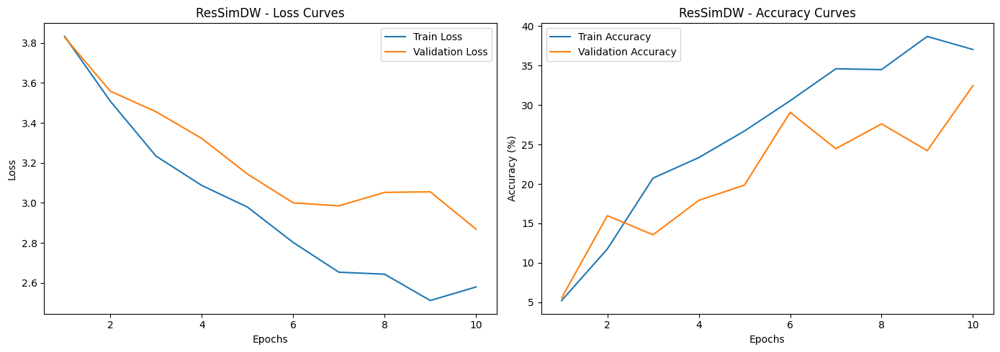



===== Training ResSimDW_3Blocks =====
- Epoch 1: Metrics --> Train Loss: 3.9007 | Train  Acc: 2.4883 | Val Loss: 3.8396 | Val Acc: 4.3584 | Time: 0m 25.72s
- Epoch 2: Metrics --> Train Loss: 3.7516 | Train  Acc: 4.7175 | Val Loss: 3.8157 | Val Acc: 2.4213 | Time: 0m 26.36s
- Epoch 3: Metrics --> Train Loss: 3.7148 | Train  Acc: 5.8580 | Val Loss: 3.7152 | Val Acc: 7.0218 | Time: 0m 25.11s
- Epoch 4: Metrics --> Train Loss: 3.6273 | Train  Acc: 8.8129 | Val Loss: 3.6833 | Val Acc: 9.9274 | Time: 0m 33.30s
- Epoch 5: Metrics --> Train Loss: 3.5740 | Train  Acc: 8.9165 | Val Loss: 3.6535 | Val Acc: 8.2324 | Time: 0m 25.45s
- Epoch 6: Metrics --> Train Loss: 3.5082 | Train  Acc: 11.4049 | Val Loss: 3.6065 | Val Acc: 10.6538 | Time: 0m 25.32s
- Epoch 7: Metrics --> Train Loss: 3.4576 | Train  Acc: 13.3230 | Val Loss: 3.5993 | Val Acc: 9.6852 | Time: 0m 26.26s
- Epoch 8: Metrics --> Train Loss: 3.4240 | Train  Acc: 15.0855 | Val Loss: 3.5189 | Val Acc: 13.0751 | Time: 0m 26.21s
- Epoch 9: 

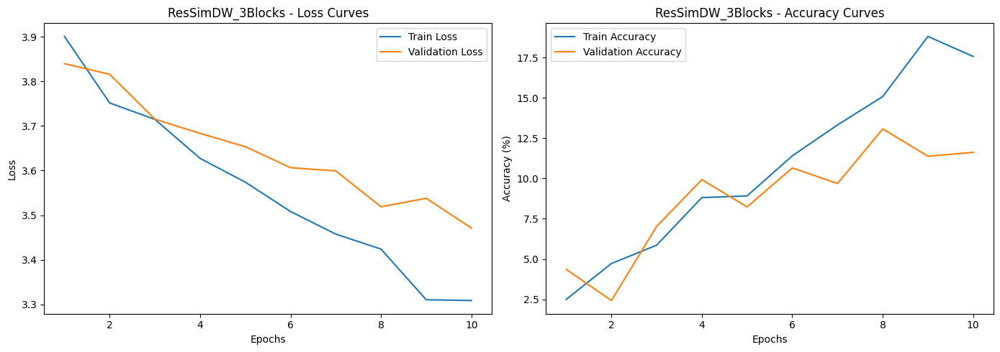



===== Training ResSimDW_BatchNorm =====
- Epoch 1: Metrics --> Train Loss: 4.6325 | Train  Acc: 16.8481 | Val Loss: 4.6493 | Val Acc: 14.5278 | Time: 0m 27.14s
- Epoch 2: Metrics --> Train Loss: 3.9687 | Train  Acc: 31.9336 | Val Loss: 4.5897 | Val Acc: 22.0339 | Time: 0m 27.89s
- Epoch 3: Metrics --> Train Loss: 3.1522 | Train  Acc: 40.2799 | Val Loss: 3.5064 | Val Acc: 37.2881 | Time: 0m 29.34s
- Epoch 4: Metrics --> Train Loss: 2.1512 | Train  Acc: 53.2400 | Val Loss: 3.8716 | Val Acc: 29.7821 | Time: 0m 27.32s
- Epoch 5: Metrics --> Train Loss: 2.3838 | Train  Acc: 54.4323 | Val Loss: 4.1534 | Val Acc: 40.6780 | Time: 0m 27.29s
- Epoch 6: Metrics --> Train Loss: 1.9378 | Train  Acc: 59.6682 | Val Loss: 3.0474 | Val Acc: 41.6465 | Time: 0m 26.86s
- Epoch 7: Metrics --> Train Loss: 1.4216 | Train  Acc: 66.7185 | Val Loss: 2.9889 | Val Acc: 39.4673 | Time: 0m 26.90s
- Epoch 8: Metrics --> Train Loss: 1.4068 | Train  Acc: 69.4660 | Val Loss: 3.0444 | Val Acc: 39.9516 | Time: 0m 27.01

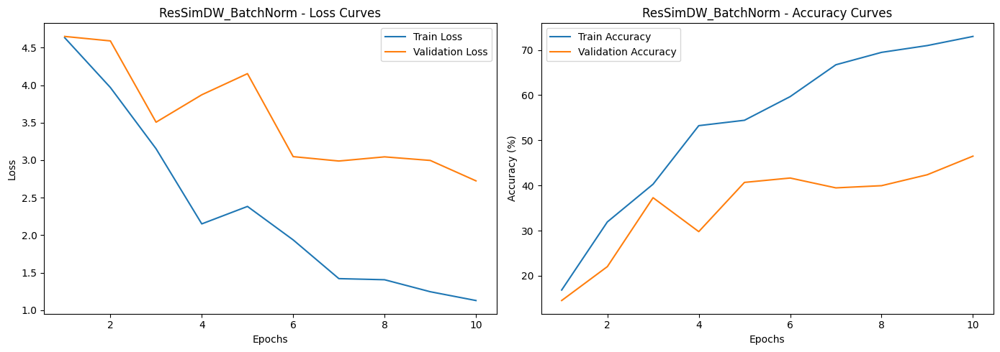



===== Training SmallMobileNet =====
- Epoch 1: Metrics --> Train Loss: 3.8640 | Train  Acc: 2.9031 | Val Loss: 3.8690 | Val Acc: 1.6949 | Time: 0m 25.33s
- Epoch 2: Metrics --> Train Loss: 3.8486 | Train  Acc: 1.8663 | Val Loss: 3.8531 | Val Acc: 2.4213 | Time: 0m 25.77s
- Epoch 3: Metrics --> Train Loss: 3.8404 | Train  Acc: 2.5402 | Val Loss: 3.8401 | Val Acc: 1.9370 | Time: 0m 24.77s
- Epoch 4: Metrics --> Train Loss: 3.8319 | Train  Acc: 3.1623 | Val Loss: 3.8369 | Val Acc: 2.4213 | Time: 0m 25.12s
- Epoch 5: Metrics --> Train Loss: 3.8252 | Train  Acc: 3.5251 | Val Loss: 3.8306 | Val Acc: 3.1477 | Time: 0m 25.45s
- Epoch 6: Metrics --> Train Loss: 3.8215 | Train  Acc: 3.4215 | Val Loss: 3.8203 | Val Acc: 2.4213 | Time: 0m 29.41s
- Epoch 7: Metrics --> Train Loss: 3.8094 | Train  Acc: 3.3696 | Val Loss: 3.8183 | Val Acc: 3.1477 | Time: 0m 25.46s
- Epoch 8: Metrics --> Train Loss: 3.8089 | Train  Acc: 2.6957 | Val Loss: 3.8179 | Val Acc: 2.6634 | Time: 0m 25.64s
- Epoch 9: Metrics

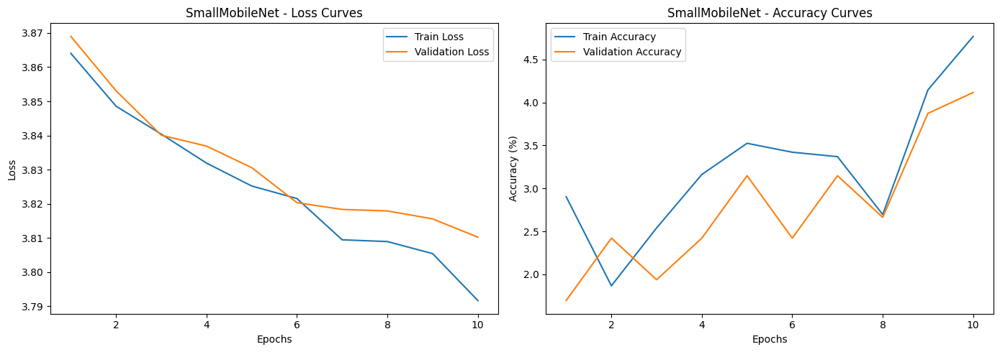



===== Training SmallMobileNetV1 =====
- Epoch 1: Metrics --> Train Loss: 3.8751 | Train  Acc: 2.5402 | Val Loss: 3.8592 | Val Acc: 3.6320 | Time: 0m 23.29s
- Epoch 2: Metrics --> Train Loss: 3.8590 | Train  Acc: 2.0736 | Val Loss: 3.8476 | Val Acc: 1.9370 | Time: 0m 23.64s
- Epoch 3: Metrics --> Train Loss: 3.8446 | Train  Acc: 3.0067 | Val Loss: 3.8480 | Val Acc: 1.4528 | Time: 0m 22.95s
- Epoch 4: Metrics --> Train Loss: 3.8422 | Train  Acc: 2.5920 | Val Loss: 3.8398 | Val Acc: 2.1792 | Time: 0m 23.36s
- Epoch 5: Metrics --> Train Loss: 3.8337 | Train  Acc: 3.0067 | Val Loss: 3.8300 | Val Acc: 2.6634 | Time: 0m 23.26s
- Epoch 6: Metrics --> Train Loss: 3.8343 | Train  Acc: 2.6957 | Val Loss: 3.8302 | Val Acc: 1.9370 | Time: 0m 22.72s
- Epoch 7: Metrics --> Train Loss: 3.8269 | Train  Acc: 3.7325 | Val Loss: 3.8253 | Val Acc: 2.1792 | Time: 0m 24.54s
- Epoch 8: Metrics --> Train Loss: 3.8195 | Train  Acc: 4.0954 | Val Loss: 3.8319 | Val Acc: 2.1792 | Time: 0m 24.31s
- Epoch 9: Metri

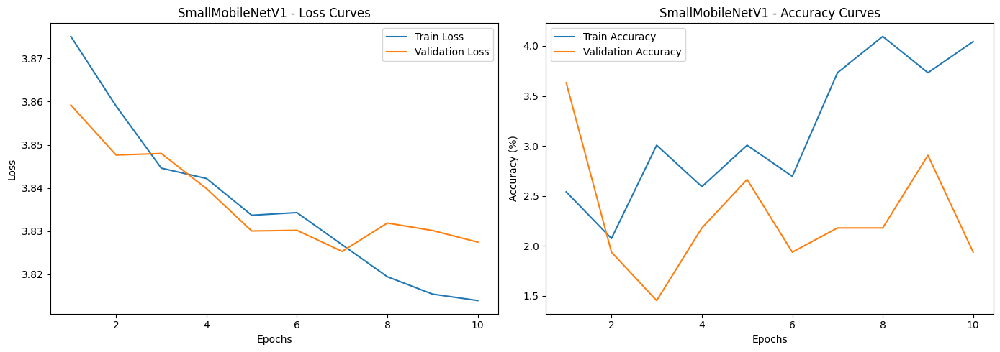



===== Training SmallMobileNetV2 =====
- Epoch 1: Metrics --> Train Loss: 3.8804 | Train  Acc: 2.4883 | Val Loss: 3.8552 | Val Acc: 3.1477 | Time: 0m 23.51s
- Epoch 2: Metrics --> Train Loss: 3.8761 | Train  Acc: 1.5552 | Val Loss: 3.8524 | Val Acc: 2.9056 | Time: 0m 22.57s
- Epoch 3: Metrics --> Train Loss: 3.8645 | Train  Acc: 2.1773 | Val Loss: 3.8458 | Val Acc: 2.9056 | Time: 0m 24.26s
- Epoch 4: Metrics --> Train Loss: 3.8513 | Train  Acc: 1.9699 | Val Loss: 3.8479 | Val Acc: 1.6949 | Time: 0m 23.15s
- Epoch 5: Metrics --> Train Loss: 3.8506 | Train  Acc: 2.7475 | Val Loss: 3.8432 | Val Acc: 2.1792 | Time: 0m 23.25s
- Epoch 6: Metrics --> Train Loss: 3.8460 | Train  Acc: 2.2810 | Val Loss: 3.8445 | Val Acc: 2.4213 | Time: 0m 24.86s
- Epoch 7: Metrics --> Train Loss: 3.8475 | Train  Acc: 2.5402 | Val Loss: 3.8467 | Val Acc: 2.4213 | Time: 0m 23.34s
- Epoch 8: Metrics --> Train Loss: 3.8476 | Train  Acc: 2.4365 | Val Loss: 3.8460 | Val Acc: 2.6634 | Time: 0m 24.09s
- Epoch 9: Metri

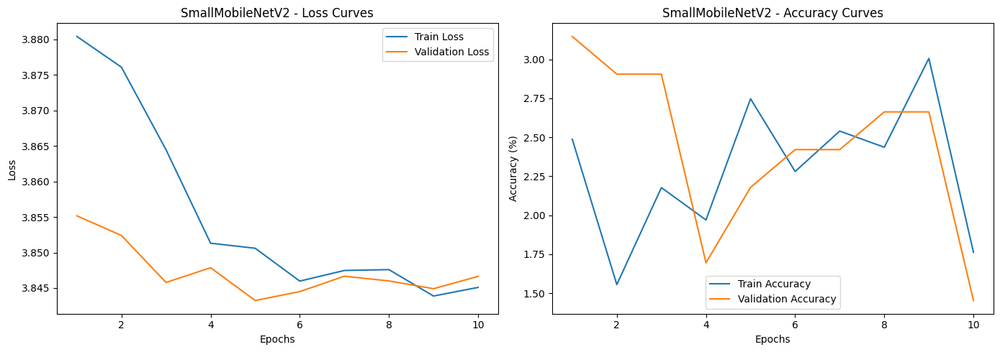



===== Training SmallMobileNetV2_LeakyRelu =====
- Epoch 1: Metrics --> Train Loss: 3.8765 | Train  Acc: 2.3847 | Val Loss: 3.8521 | Val Acc: 3.3898 | Time: 0m 24.16s
- Epoch 2: Metrics --> Train Loss: 3.8637 | Train  Acc: 2.1255 | Val Loss: 3.8528 | Val Acc: 3.6320 | Time: 0m 24.25s
- Epoch 3: Metrics --> Train Loss: 3.8649 | Train  Acc: 1.9181 | Val Loss: 3.8490 | Val Acc: 2.4213 | Time: 0m 22.35s
- Epoch 4: Metrics --> Train Loss: 3.8537 | Train  Acc: 2.0736 | Val Loss: 3.8444 | Val Acc: 3.3898 | Time: 0m 24.07s
- Epoch 5: Metrics --> Train Loss: 3.8555 | Train  Acc: 2.4883 | Val Loss: 3.8427 | Val Acc: 3.6320 | Time: 0m 23.95s
- Epoch 6: Metrics --> Train Loss: 3.8538 | Train  Acc: 1.9699 | Val Loss: 3.8416 | Val Acc: 4.3584 | Time: 0m 22.49s
- Epoch 7: Metrics --> Train Loss: 3.8462 | Train  Acc: 1.8663 | Val Loss: 3.8376 | Val Acc: 4.6005 | Time: 0m 24.71s
- Epoch 8: Metrics --> Train Loss: 3.8521 | Train  Acc: 2.1773 | Val Loss: 3.8364 | Val Acc: 4.6005 | Time: 0m 24.11s
- Epoc

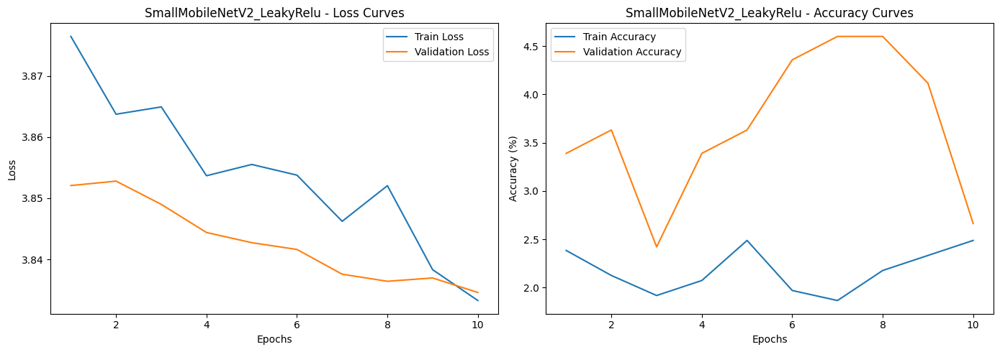



===== Training SmallMobileNetV3 =====
- Epoch 1: Metrics --> Train Loss: 3.8811 | Train  Acc: 2.0218 | Val Loss: 3.8590 | Val Acc: 1.2107 | Time: 0m 24.03s
- Epoch 2: Metrics --> Train Loss: 3.8694 | Train  Acc: 2.3328 | Val Loss: 3.8511 | Val Acc: 1.6949 | Time: 0m 23.19s
- Epoch 3: Metrics --> Train Loss: 3.8603 | Train  Acc: 2.7994 | Val Loss: 3.8439 | Val Acc: 2.9056 | Time: 0m 24.63s
- Epoch 4: Metrics --> Train Loss: 3.8549 | Train  Acc: 2.2291 | Val Loss: 3.8385 | Val Acc: 2.1792 | Time: 0m 24.21s
- Epoch 5: Metrics --> Train Loss: 3.8512 | Train  Acc: 2.5920 | Val Loss: 3.8372 | Val Acc: 2.9056 | Time: 0m 24.29s
- Epoch 6: Metrics --> Train Loss: 3.8469 | Train  Acc: 2.5402 | Val Loss: 3.8360 | Val Acc: 2.1792 | Time: 0m 24.72s
- Epoch 7: Metrics --> Train Loss: 3.8397 | Train  Acc: 2.8512 | Val Loss: 3.8326 | Val Acc: 3.3898 | Time: 0m 23.93s
- Epoch 8: Metrics --> Train Loss: 3.8368 | Train  Acc: 2.9031 | Val Loss: 3.8350 | Val Acc: 3.3898 | Time: 0m 23.61s
- Epoch 9: Metri

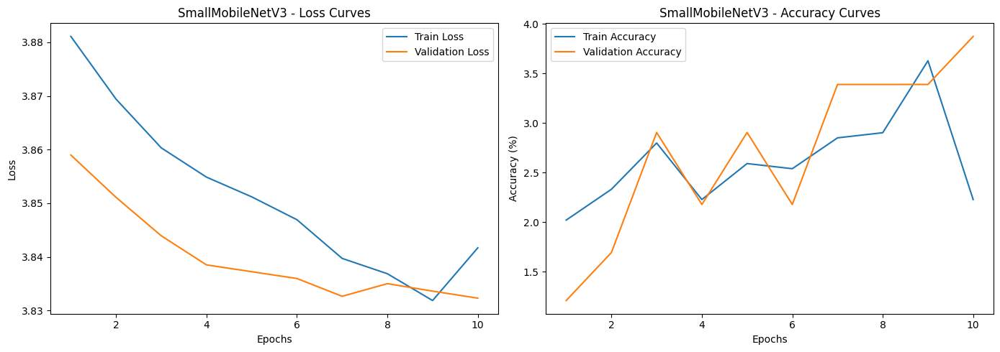


All models have been trained. Best checkpoints are saved in results_dir.


In [ ]:
# ─── Loop to train all model architectures ───────────────────────────────────────
# Note: Ensure the cells defining all model classes (ResSimDW, ResSimDW_3Blocks, etc.)
# and the train()/plot_training_results() functions have already been executed in this notebook.
# Also ensure train_loader, val_loader, NUM_CLASSES, DEVICE, and results_dir are defined.


import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import StepLR

# Dictionary mapping model names to their classes
model_factories = {
    "ResSimDW"                 : ResSimDW,
    "ResSimDW_3Blocks"         : ResSimDW_3Blocks,
    "ResSimDW_BatchNorm"       : ResSimDW_BatchNorm,
    "SmallMobileNet"           : SmallMobileNet,
    "SmallMobileNetV1"         : SmallMobileNetV1,
    "SmallMobileNetV2"         : SmallMobileNetV2,
    "SmallMobileNetV2_LeakyRelu": SmallMobileNetV2_LeakyRelu,
    "SmallMobileNetV3"         : SmallMobileNetV3,
}

# Hyperparameters (you can adjust these if desired)
NUM_EPOCHS      = 10
LR              = 1e-3
MOMENTUM        = 0.9
WEIGHT_DECAY    = 1e-4
STEP_LR_EPOCHS  = 5
GAMMA           = 0.1

# Store history for each model (optional, for further analysis)
history = {}

for name, ModelClass in model_factories.items():
    print(f"\n\n===== Training {name} =====")

    # 1) Instantiate model with correct number of output classes
    model = ModelClass(num_classes=NUM_CLASSES).to(device)

    # 2) Define loss function and optimizer
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(
        model.parameters(),
        lr=LR,
        momentum=MOMENTUM,
        weight_decay=WEIGHT_DECAY
    )

    #── OPTIONAL: Freeze all layers except final fc ────────────────────────────
    for p in model.parameters():
        p.requires_grad = False
    for p in model.fc.parameters():
        p.requires_grad = True
    optimizer = optim.SGD(model.fc.parameters(), lr=LR, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)

    # 3) (Optional) Learning-rate scheduler
    scheduler = StepLR(optimizer, step_size=STEP_LR_EPOCHS, gamma=GAMMA)

    # 4) Train and validate
    model_name_on_disk = f"{name}_yoga.pt"
    train_losses, train_accs, val_losses, val_accs = train(
        model        = model,
        train_loader = train_loader,
        val_loader   = val_loader,
        criterion    = criterion,
        optimizer    = optimizer,
        device       = device,
        num_epochs   = NUM_EPOCHS,
        model_name   = model_name_on_disk
    )

    # 5) Save training history
    history[name] = {
        "train_losses": train_losses,
        "train_accs"  : train_accs,
        "val_losses"  : val_losses,
        "val_accs"    : val_accs
    }

    # 6) Plot curves for this model
    plot_training_results(train_losses, val_losses, train_accs, val_accs, model_name=name)

print("\nAll models have been trained. Best checkpoints are saved in results_dir.")


### 🧪 Checkpoint Loading and Evaluation

This section defines a model factory and loads checkpoints for each small CNN model used in this study. For each model:
- The architecture is reconstructed using a factory function
- Pretrained weights are loaded from disk (trained on SVHN)
- The model is evaluated on train, validation, and test sets
- Key metrics (accuracy, precision, recall, F1-score, inference time) are computed
- A confusion matrix is generated for qualitative error analysis

The goal is to evaluate whether small CNNs — effective on simple datasets — can generalize to our yoga pose recognition task. This helps us test the feasibility of reusing lightweight models in a higher-resolution, fine-grained classification problem.



Loading ResSimDW_yoga.pt → factory key 'ResSimDW'
✅ Successfully loaded model ResSimDW


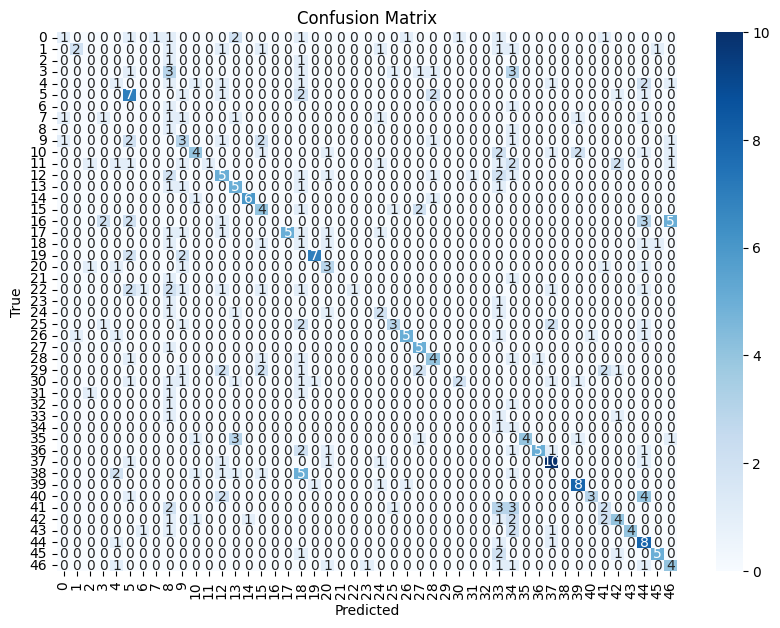

Confusion Matrix for ResSimDW:
[[1 0 0 ... 0 0 0]
 [0 2 0 ... 0 1 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 8 0 0]
 [0 0 0 ... 0 5 0]
 [0 0 0 ... 1 0 4]]

Loading ResSimDW_3Blocks_yoga.pt → factory key 'ResSimDW_3Blocks'
✅ Successfully loaded model ResSimDW_3Blocks


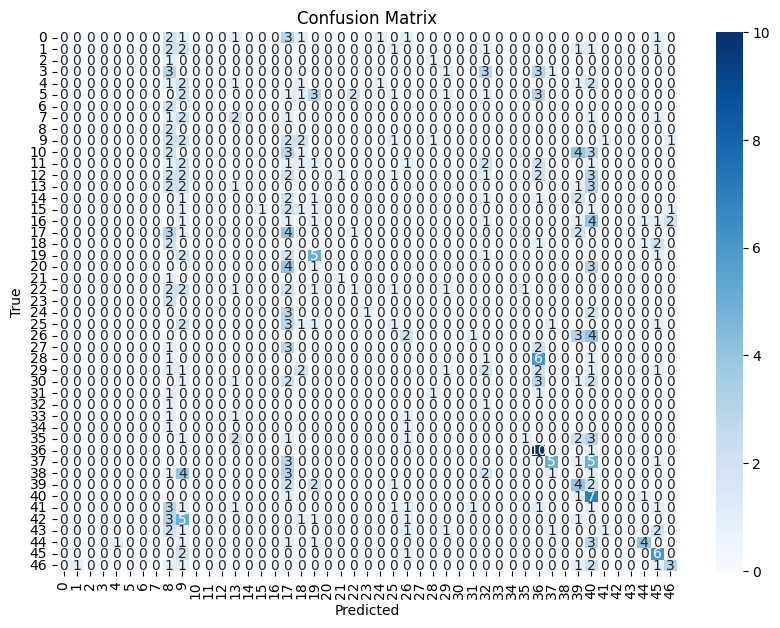

Confusion Matrix for ResSimDW_3Blocks:
[[0 0 0 ... 0 1 0]
 [0 0 0 ... 0 1 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 4 0 0]
 [0 0 0 ... 0 6 0]
 [0 1 0 ... 0 1 3]]

Loading ResSimDW_BatchNorm_yoga.pt → factory key 'ResSimDW_BatchNorm'
✅ Successfully loaded model ResSimDW_BatchNorm


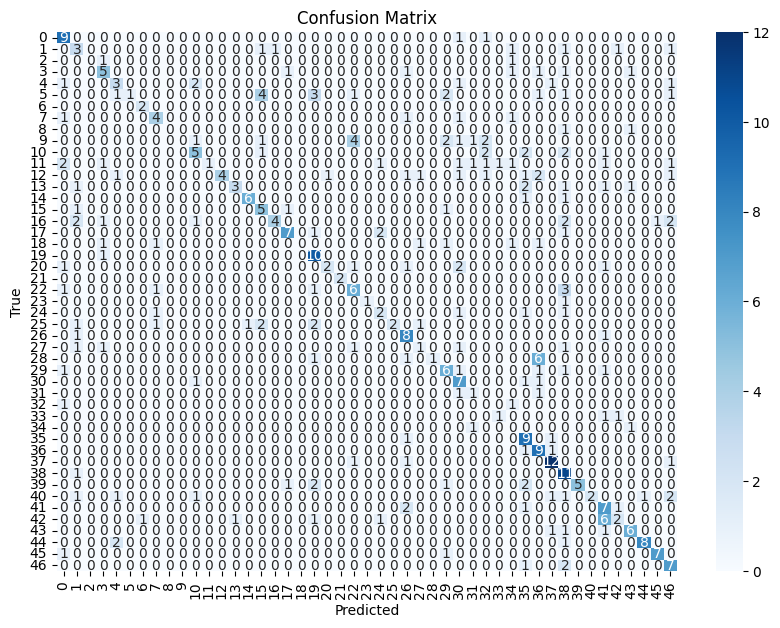

Confusion Matrix for ResSimDW_BatchNorm:
[[9 0 0 ... 0 0 0]
 [0 3 0 ... 0 0 1]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 8 0 0]
 [1 0 0 ... 0 7 0]
 [0 0 0 ... 0 0 7]]

Loading SmallMobileNet_yoga.pt → factory key 'SmallMobileNet'
✅ Successfully loaded model SmallMobileNet


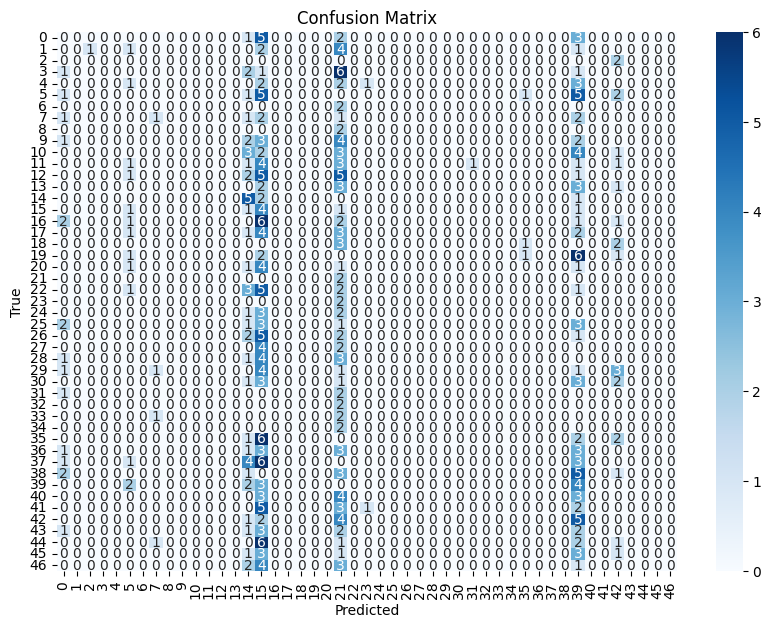

Confusion Matrix for SmallMobileNet:
[[0 0 0 ... 0 0 0]
 [0 0 1 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]

Loading SmallMobileNetV1_yoga.pt → factory key 'SmallMobileNetV1'
✅ Successfully loaded model SmallMobileNetV1


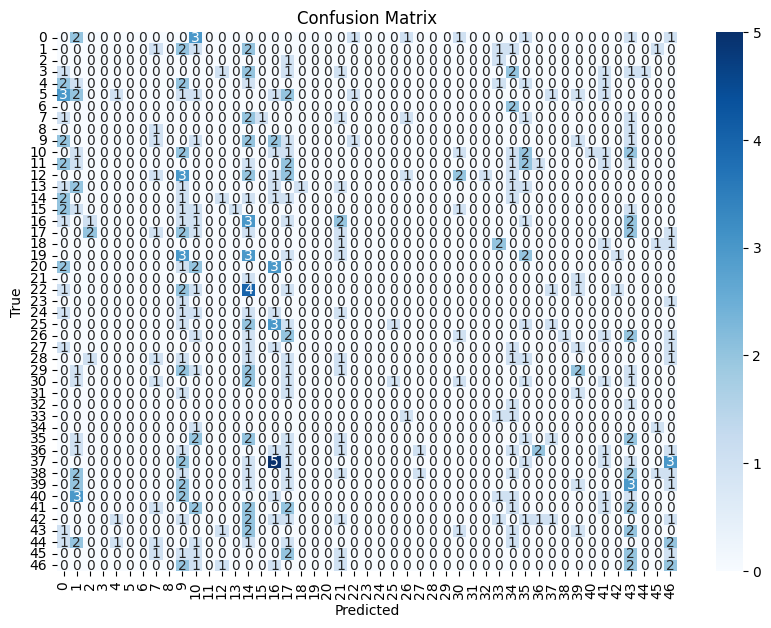

Confusion Matrix for SmallMobileNetV1:
[[0 2 0 ... 0 0 1]
 [0 0 0 ... 0 1 0]
 [0 0 0 ... 0 0 0]
 ...
 [1 2 0 ... 0 0 2]
 [0 0 0 ... 0 0 1]
 [0 0 0 ... 0 0 2]]

Loading SmallMobileNetV2_yoga.pt → factory key 'SmallMobileNetV2'
✅ Successfully loaded model SmallMobileNetV2


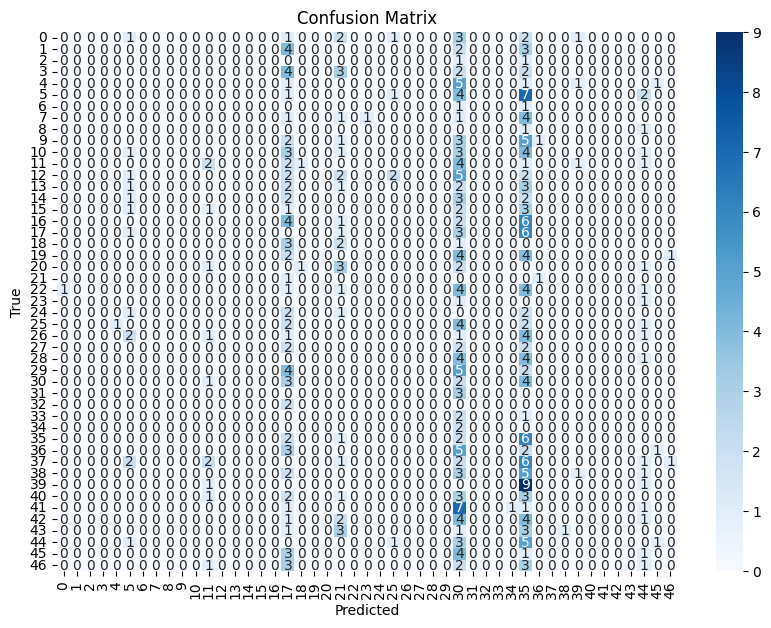

Confusion Matrix for SmallMobileNetV2:
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 1 0]
 [0 0 0 ... 1 0 0]
 [0 0 0 ... 1 0 0]]

Loading SmallMobileNetV2_LeakyRelu_yoga.pt → factory key 'SmallMobileNetV2_LeakyRelu'
✅ Successfully loaded model SmallMobileNetV2_LeakyRelu


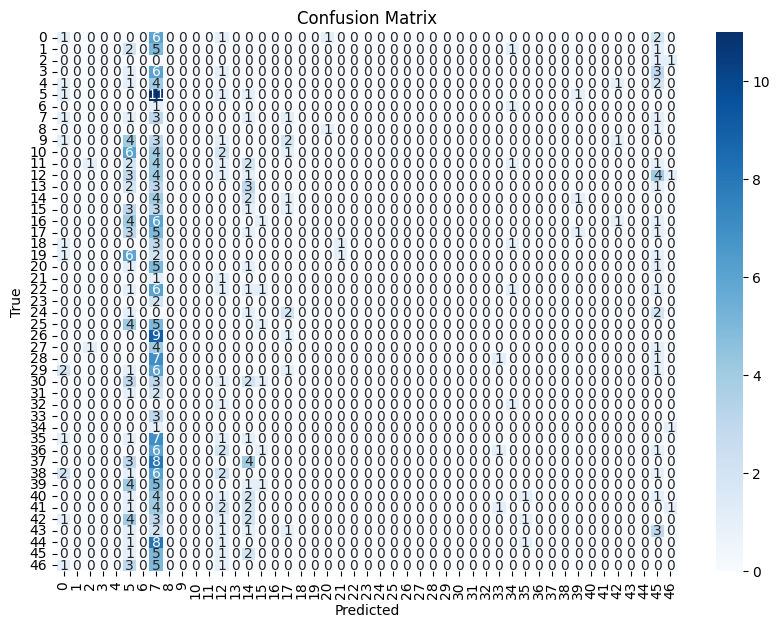

Confusion Matrix for SmallMobileNetV2_LeakyRelu:
[[1 0 0 ... 0 2 0]
 [0 0 0 ... 0 1 0]
 [0 0 0 ... 0 1 1]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [1 0 0 ... 0 0 0]]

Loading SmallMobileNetV3_yoga.pt → factory key 'SmallMobileNetV3'
✅ Successfully loaded model SmallMobileNetV3


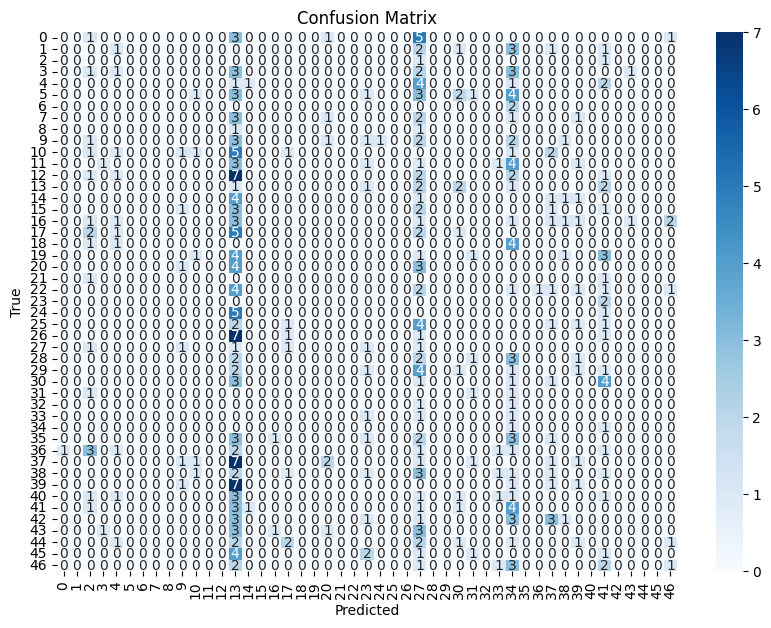

Confusion Matrix for SmallMobileNetV3:
[[0 0 1 ... 0 0 1]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 1]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 1]]
+----------------------------+--------------+-------------+-----------+------------+-------------+----------+------------+------------------------------+
| Model                      | Parameters   | Train Acc   | Val Acc   | Test Acc   |   Precision |   Recall |   F1-Score | Inference Time (sec/image)   |
+============================+==============+=============+===========+============+=============+==========+============+==============================+
| ResSimDW                   | 207,501      | 30.79%      | 32.45%    | 33.09%     |        0.54 |     0.33 |       0.33 | 0.000058 sec/image           |
+----------------------------+--------------+-------------+-----------+------------+-------------+----------+------------+------------------------------+
| ResSimDW_3Blocks           | 72,717       | 7.98%       | 11.62%    |

In [ ]:
# Model factories and checkpoint loading loop
model_factories = {

    #'lightweightnet': lambda num_classes: LightweightNet(NUM_CLASSES),
    #'mobilenet_v2_light': lambda num_classes: MobileNetV2_Lightweight(NUM_CLASSES),
    #'mobilenet_v3_large_light_yoga': lambda num_classes: MobileNetV3_Large_Light(NUM_CLASSES),

    # Additional models
    'ResSimDW': lambda num_classes: ResSimDW(NUM_CLASSES),
    'ResSimDW_3Blocks': lambda num_classes: ResSimDW_3Blocks(NUM_CLASSES),
    'ResSimDW_BatchNorm': lambda num_classes: ResSimDW_BatchNorm(NUM_CLASSES),
    'SmallMobileNet': lambda num_classes: SmallMobileNet(NUM_CLASSES),
    'SmallMobileNetV1': lambda num_classes: SmallMobileNetV1(NUM_CLASSES),
    'SmallMobileNetV2': lambda num_classes: SmallMobileNetV2(NUM_CLASSES),
    'SmallMobileNetV2_LeakyRelu': lambda num_classes: SmallMobileNetV2_LeakyRelu(NUM_CLASSES),
    'SmallMobileNetV3': lambda num_classes: SmallMobileNetV3(NUM_CLASSES),
}

# Checkpoint filenames
checkpoints = [

    #'lightweightnet_yoga.pt',
    #'mobilenet_v2_light_yoga.pt',
    #'mobilenet_v3_large_light_yoga.pt',
    'ResSimDW_yoga.pt',
    'ResSimDW_3Blocks_yoga.pt',
    'ResSimDW_BatchNorm_yoga.pt',
    'SmallMobileNet_yoga.pt',
    'SmallMobileNetV1_yoga.pt',
    'SmallMobileNetV2_yoga.pt',
    'SmallMobileNetV2_LeakyRelu_yoga.pt',
    'SmallMobileNetV3_yoga.pt',
]

# Directory with checkpoint files
# saved_dir = "/content/drive/MyDrive/UPF/Third_Year/Third_Trimester/Deep_Learning/Labs/Final Project-Yoga/results"  # Adjust path
saved_dir = '/content/drive/MyDrive/Data Science Enginnering/3r/T3/Deep Learning/DL Labs & Project/Final_Project_Joan_Adria/results'


# Results list
results = []

# Load and evaluate models
for ckpt in checkpoints:
    key = ckpt.replace("_yoga.pt", "")  # Get model key by stripping "_yoga.pt"
    print(f"\nLoading {ckpt} → factory key '{key}'")

    # Check if the model is in model_factories
    if key not in model_factories:
        print(f"⚠️ Model {key} not found in model_factories. Skipping.")
        continue

    # Instantiate the model using the factory
    model = model_factories[key](NUM_CLASSES).to(device)

    # Load checkpoint
    try:
        model_path = os.path.join(saved_dir, ckpt)
        model.load_state_dict(torch.load(model_path, map_location=device), strict=False)
        print(f"✅ Successfully loaded model {key}")
    except Exception as e:
        print(f"⚠️ Error loading model {key}: {e}")
        continue

    model.eval()

    # Run inference and compute metrics
    acc_train = inference(model, train_loader, device)
    acc_val = inference(model, val_loader, device)
    acc_test, precision, recall, f1, inference_time = inference_with_metrics(model, test_loader, device)

    # Compute model parameters
    param_count = compute_model_params(model)

    # Compute additional metrics (confusion matrix, precision, recall, F1)
    acc, precision, recall, f1, cm = compute_metrics(model, test_loader, device)

    # Print confusion matrix
    print(f"Confusion Matrix for {key}:")
    print(cm)

    # Add the results to the summary table
    results.append([
        key,
        f"{param_count:,}",  # Parameter count
        f"{acc_train:.2f}%",  # Train accuracy
        f"{acc_val:.2f}%",    # Validation accuracy
        f"{acc_test:.2f}%",   # Test accuracy
        f"{precision:.2f}",   # Precision
        f"{recall:.2f}",      # Recall
        f"{f1:.2f}",          # F1-Score
        f"{inference_time:.6f} sec/image",  # Inference time
    ])

# Print the summary table
headers = ["Model", "Parameters", "Train Acc", "Val Acc", "Test Acc", "Precision", "Recall", "F1-Score", "Inference Time (sec/image)"]
print(tabulate(results, headers=headers, tablefmt="grid"))


### 📊 Evaluation and Results:

The performance, as expected, dropped significantly:

Test accuracy across all models remained well below 40%, and most models hovered in the 1–4% range.

F1-scores and recall were especially low, confirming that the models failed to generalize to this new task.

Even the best-performing model, ResSimDW_BatchNorm, reached only ~47% test accuracy — far behind the baseline CNNs in Section 4.3.

These results highlight two key takeaways:

Image resolution matters: Downsampling to 32×32 for pose detection drastically hurt performance.

Dataset alignment is critical: Models trained on simple or different domains (like SVHN) struggle to transfer to more complex visual tasks without fine-tuning on similar-resolution, domain-relevant data.

### 🛠️ Model Training Loop (Partial Unfreezing of Deeper Layers)

This section contains the training logic for fine-tuning small pretrained models on the yoga pose classification task.

To improve over the previous results — where only the final classification layer was fine-tuned — we adopt a more flexible strategy:  
**unfreezing deeper convolutional blocks in addition to the final layer**. This allows the models to better adapt to the richer and more complex yoga dataset while still retaining some learned representations from the SVHN domain.

The unfreezing pattern depends on the model architecture:
- `ResSimDW` variants: blocks `block2`, `block3`, and `fc`
- `SmallMobileNet` variants: `blocks` and `fc`
- `MobileNetV2/3` variants: `features` and `classifier`

This targeted unfreezing, combined with a lower learning rate and fewer epochs, enables efficient transfer learning while avoiding overfitting or catastrophic forgetting.

✅ All fine-tuned models are saved as `*_finetuned.pt` for later evaluation.




===== Fine‐tuning mobilenet_v2_light =====


<ipython-input-73-2cb6afe2e6cb>:76: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(ckpt_path, map_location=DEVICE)


⚠️  Error loading state_dict for mobilenet_v2_light: Error(s) in loading state_dict for MobileNetV2_Lightweight:
	size mismatch for fc1.weight: copying a param with shape torch.Size([512, 819200]) from checkpoint, the shape in current model is torch.Size([512, 128]).


===== Fine‐tuning mobilenet_v3_large_light =====
⚠️  No factory defined for model 'mobilenet_v3_large_light'. Skipping.


===== Fine‐tuning ResSimDW =====
✅ Loaded weights from ResSimDW_yoga.pt
→ Unfrozen layers for ResSimDW: ['block2', 'block3', 'fc']
- Epoch 1: Metrics --> Train Loss: 2.2794 | Train  Acc: 47.0192 | Val Loss: 2.6847 | Val Acc: 38.4988 | Time: 0m 45.71s
- Epoch 2: Metrics --> Train Loss: 2.2470 | Train  Acc: 49.1965 | Val Loss: 2.6632 | Val Acc: 37.7724 | Time: 0m 39.01s
- Epoch 3: Metrics --> Train Loss: 2.2326 | Train  Acc: 49.8186 | Val Loss: 2.6627 | Val Acc: 39.4673 | Time: 0m 35.48s
- Epoch 4: Metrics --> Train Loss: 2.2513 | Train  Acc: 48.8336 | Val Loss: 2.6959 | Val Acc: 38.0145 | Time: 0m 40.1

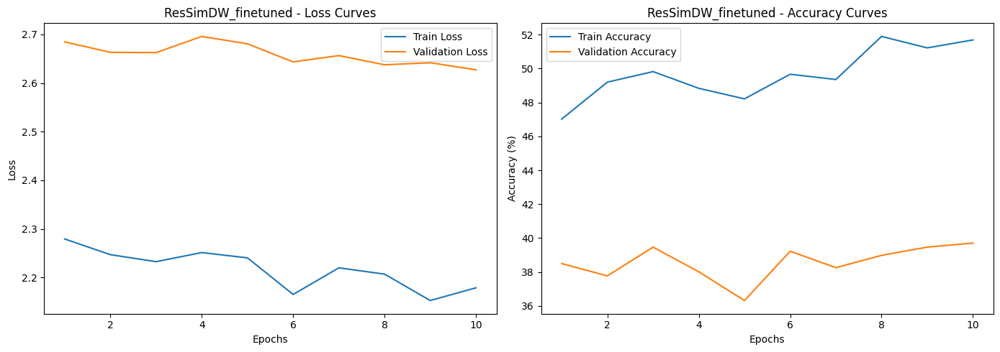

✅ Finished fine‐tuning ResSimDW. Best checkpoint saved as 'ResSimDW_finetuned.pt' in results_dir.


===== Fine‐tuning ResSimDW_3Blocks =====
✅ Loaded weights from ResSimDW_3Blocks_yoga.pt
→ Unfrozen layers for ResSimDW_3Blocks: ['block2', 'block3', 'fc']
- Epoch 1: Metrics --> Train Loss: 3.2713 | Train  Acc: 21.2545 | Val Loss: 3.4154 | Val Acc: 16.2228 | Time: 0m 27.16s
- Epoch 2: Metrics --> Train Loss: 3.2373 | Train  Acc: 23.6392 | Val Loss: 3.4110 | Val Acc: 17.4334 | Time: 0m 27.03s
- Epoch 3: Metrics --> Train Loss: 3.2255 | Train  Acc: 23.6910 | Val Loss: 3.4026 | Val Acc: 17.6755 | Time: 0m 27.28s
- Epoch 4: Metrics --> Train Loss: 3.2366 | Train  Acc: 23.4837 | Val Loss: 3.4152 | Val Acc: 15.9806 | Time: 0m 34.44s
- Epoch 5: Metrics --> Train Loss: 3.2330 | Train  Acc: 24.2094 | Val Loss: 3.3977 | Val Acc: 18.8862 | Time: 0m 27.29s
- Epoch 6: Metrics --> Train Loss: 3.1987 | Train  Acc: 25.9720 | Val Loss: 3.3955 | Val Acc: 18.1598 | Time: 0m 26.50s
- Epoch 7: Metrics --> Tr

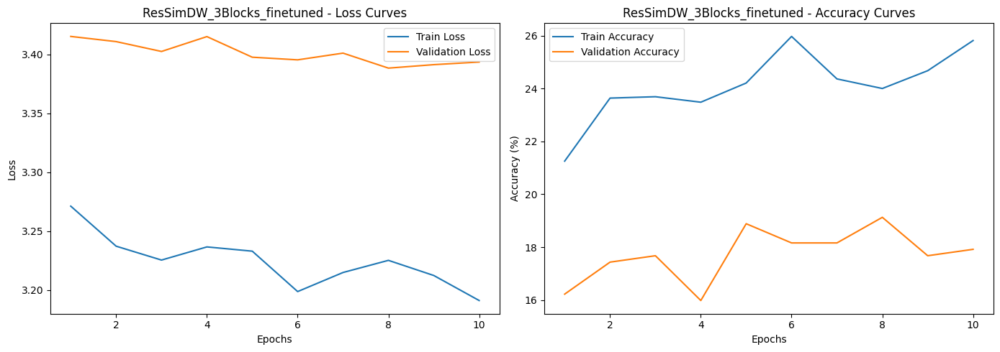

✅ Finished fine‐tuning ResSimDW_3Blocks. Best checkpoint saved as 'ResSimDW_3Blocks_finetuned.pt' in results_dir.


===== Fine‐tuning ResSimDW_BatchNorm =====
✅ Loaded weights from ResSimDW_BatchNorm_yoga.pt
→ Unfrozen layers for ResSimDW_BatchNorm: ['block2', 'block3', 'fc']
- Epoch 1: Metrics --> Train Loss: 0.5796 | Train  Acc: 85.6402 | Val Loss: 2.1485 | Val Acc: 55.2058 | Time: 0m 27.03s
- Epoch 2: Metrics --> Train Loss: 0.4778 | Train  Acc: 88.0767 | Val Loss: 2.1476 | Val Acc: 56.1743 | Time: 0m 28.16s
- Epoch 3: Metrics --> Train Loss: 0.4655 | Train  Acc: 87.9212 | Val Loss: 2.0959 | Val Acc: 56.4165 | Time: 0m 28.56s
- Epoch 4: Metrics --> Train Loss: 0.4846 | Train  Acc: 88.5951 | Val Loss: 2.1133 | Val Acc: 55.4479 | Time: 0m 28.39s
- Epoch 5: Metrics --> Train Loss: 0.4270 | Train  Acc: 89.3727 | Val Loss: 2.0611 | Val Acc: 56.9007 | Time: 0m 27.90s
- Epoch 6: Metrics --> Train Loss: 0.4441 | Train  Acc: 89.6319 | Val Loss: 2.0585 | Val Acc: 56.6586 | Time: 0m 28.61s
- E

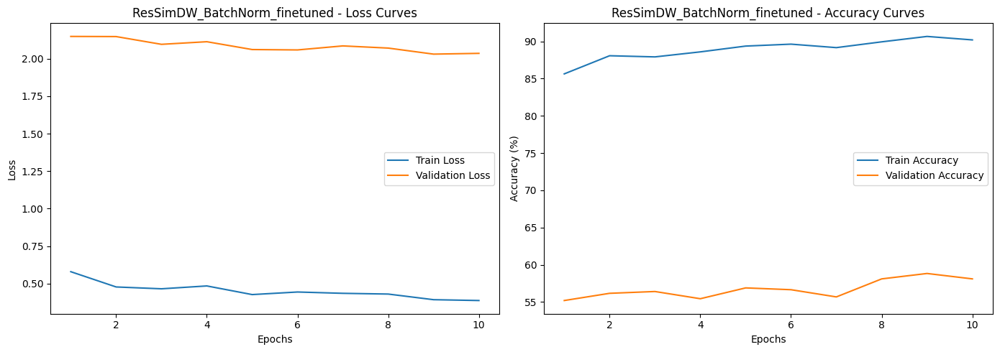

✅ Finished fine‐tuning ResSimDW_BatchNorm. Best checkpoint saved as 'ResSimDW_BatchNorm_finetuned.pt' in results_dir.


===== Fine‐tuning SmallMobileNet =====
✅ Loaded weights from SmallMobileNet_yoga.pt
→ Unfrozen layers for SmallMobileNet: ['blocks', 'fc']
- Epoch 1: Metrics --> Train Loss: 3.7985 | Train  Acc: 3.2659 | Val Loss: 3.8067 | Val Acc: 2.9056 | Time: 0m 47.10s
- Epoch 2: Metrics --> Train Loss: 3.7931 | Train  Acc: 4.4064 | Val Loss: 3.8045 | Val Acc: 3.6320 | Time: 0m 28.57s
- Epoch 3: Metrics --> Train Loss: 3.7937 | Train  Acc: 4.4064 | Val Loss: 3.8065 | Val Acc: 3.3898 | Time: 0m 28.18s
- Epoch 4: Metrics --> Train Loss: 3.7938 | Train  Acc: 3.7325 | Val Loss: 3.8056 | Val Acc: 2.9056 | Time: 0m 27.54s
- Epoch 5: Metrics --> Train Loss: 3.7860 | Train  Acc: 5.2359 | Val Loss: 3.8082 | Val Acc: 3.1477 | Time: 0m 28.88s
- Epoch 6: Metrics --> Train Loss: 3.7809 | Train  Acc: 5.2359 | Val Loss: 3.8075 | Val Acc: 3.1477 | Time: 0m 27.86s
- Epoch 7: Metrics --> Train Loss

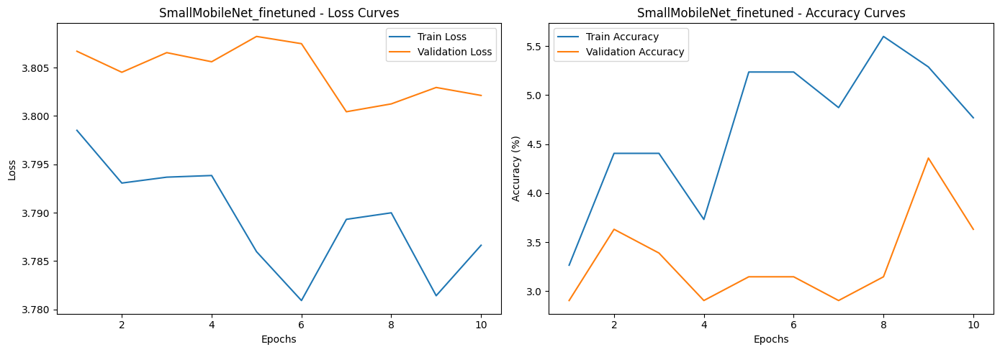

✅ Finished fine‐tuning SmallMobileNet. Best checkpoint saved as 'SmallMobileNet_finetuned.pt' in results_dir.


===== Fine‐tuning SmallMobileNetV1 =====
✅ Loaded weights from SmallMobileNetV1_yoga.pt
→ Unfrozen layers for SmallMobileNetV1: ['blocks', 'fc']
- Epoch 1: Metrics --> Train Loss: 3.8246 | Train  Acc: 3.4733 | Val Loss: 3.8259 | Val Acc: 2.6634 | Time: 0m 24.81s
- Epoch 2: Metrics --> Train Loss: 3.8154 | Train  Acc: 4.3546 | Val Loss: 3.8254 | Val Acc: 2.1792 | Time: 0m 25.23s
- Epoch 3: Metrics --> Train Loss: 3.8192 | Train  Acc: 2.8512 | Val Loss: 3.8236 | Val Acc: 2.6634 | Time: 0m 23.36s
- Epoch 4: Metrics --> Train Loss: 3.8104 | Train  Acc: 4.1472 | Val Loss: 3.8222 | Val Acc: 2.6634 | Time: 0m 26.17s
- Epoch 5: Metrics --> Train Loss: 3.8091 | Train  Acc: 3.9917 | Val Loss: 3.8196 | Val Acc: 2.9056 | Time: 0m 25.17s
- Epoch 6: Metrics --> Train Loss: 3.8039 | Train  Acc: 3.8362 | Val Loss: 3.8192 | Val Acc: 2.6634 | Time: 0m 23.21s
- Epoch 7: Metrics --> Train Loss: 

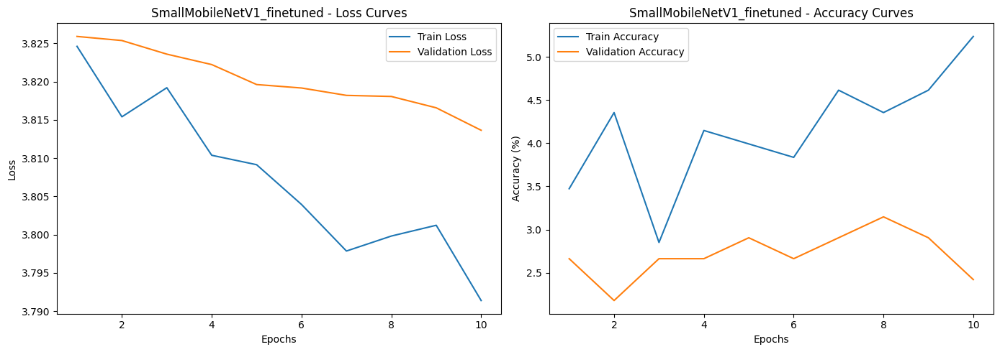

✅ Finished fine‐tuning SmallMobileNetV1. Best checkpoint saved as 'SmallMobileNetV1_finetuned.pt' in results_dir.


===== Fine‐tuning SmallMobileNetV2 =====
✅ Loaded weights from SmallMobileNetV2_yoga.pt
→ Unfrozen layers for SmallMobileNetV2: ['blocks', 'fc']
- Epoch 1: Metrics --> Train Loss: 3.8530 | Train  Acc: 2.4365 | Val Loss: 3.8429 | Val Acc: 1.9370 | Time: 0m 25.41s
- Epoch 2: Metrics --> Train Loss: 3.8482 | Train  Acc: 2.4883 | Val Loss: 3.8433 | Val Acc: 2.1792 | Time: 0m 25.70s
- Epoch 3: Metrics --> Train Loss: 3.8517 | Train  Acc: 2.8512 | Val Loss: 3.8418 | Val Acc: 2.1792 | Time: 0m 23.39s
- Epoch 4: Metrics --> Train Loss: 3.8499 | Train  Acc: 2.1255 | Val Loss: 3.8432 | Val Acc: 1.9370 | Time: 0m 25.24s
- Epoch 5: Metrics --> Train Loss: 3.8481 | Train  Acc: 2.2291 | Val Loss: 3.8425 | Val Acc: 1.4528 | Time: 0m 25.39s
- Epoch 6: Metrics --> Train Loss: 3.8413 | Train  Acc: 3.0067 | Val Loss: 3.8419 | Val Acc: 2.1792 | Time: 0m 24.45s
- Epoch 7: Metrics --> Train Lo

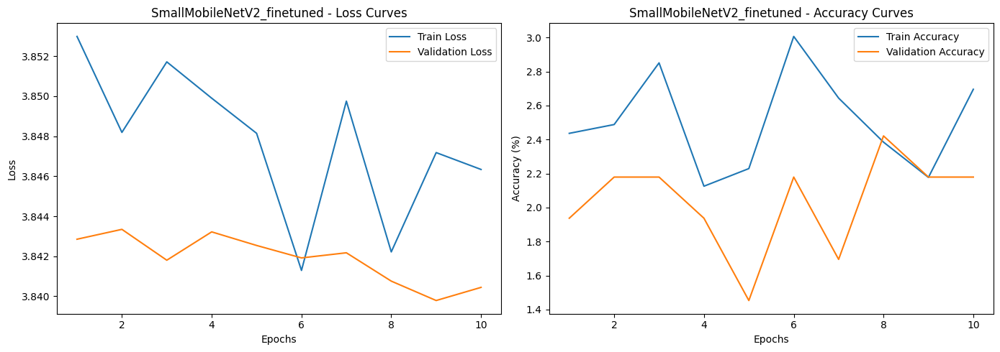

✅ Finished fine‐tuning SmallMobileNetV2. Best checkpoint saved as 'SmallMobileNetV2_finetuned.pt' in results_dir.


===== Fine‐tuning SmallMobileNetV2_LeakyRelu =====
✅ Loaded weights from SmallMobileNetV2_LeakyRelu_yoga.pt
→ Unfrozen layers for SmallMobileNetV2_LeakyRelu: ['blocks', 'fc']
- Epoch 1: Metrics --> Train Loss: 3.8367 | Train  Acc: 2.7475 | Val Loss: 3.8332 | Val Acc: 2.6634 | Time: 0m 24.29s
- Epoch 2: Metrics --> Train Loss: 3.8343 | Train  Acc: 2.2810 | Val Loss: 3.8330 | Val Acc: 2.6634 | Time: 0m 25.03s
- Epoch 3: Metrics --> Train Loss: 3.8341 | Train  Acc: 3.2141 | Val Loss: 3.8328 | Val Acc: 3.1477 | Time: 0m 25.39s
- Epoch 4: Metrics --> Train Loss: 3.8316 | Train  Acc: 2.7475 | Val Loss: 3.8319 | Val Acc: 3.3898 | Time: 0m 24.90s
- Epoch 5: Metrics --> Train Loss: 3.8301 | Train  Acc: 2.7475 | Val Loss: 3.8319 | Val Acc: 2.9056 | Time: 0m 24.69s
- Epoch 6: Metrics --> Train Loss: 3.8401 | Train  Acc: 2.6439 | Val Loss: 3.8310 | Val Acc: 3.3898 | Time: 0m 24.86s
-

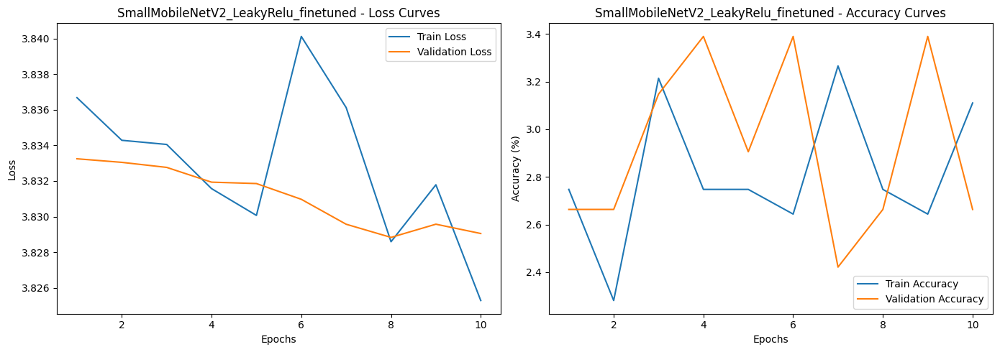

✅ Finished fine‐tuning SmallMobileNetV2_LeakyRelu. Best checkpoint saved as 'SmallMobileNetV2_LeakyRelu_finetuned.pt' in results_dir.


===== Fine‐tuning SmallMobileNetV3 =====
✅ Loaded weights from SmallMobileNetV3_yoga.pt
→ Unfrozen layers for SmallMobileNetV3: ['blocks', 'fc']
- Epoch 1: Metrics --> Train Loss: 3.8349 | Train  Acc: 2.7475 | Val Loss: 3.8319 | Val Acc: 4.1162 | Time: 0m 26.52s
- Epoch 2: Metrics --> Train Loss: 3.8315 | Train  Acc: 3.3178 | Val Loss: 3.8317 | Val Acc: 4.3584 | Time: 0m 26.10s
- Epoch 3: Metrics --> Train Loss: 3.8344 | Train  Acc: 3.5251 | Val Loss: 3.8300 | Val Acc: 4.8426 | Time: 0m 27.15s
- Epoch 4: Metrics --> Train Loss: 3.8359 | Train  Acc: 2.7994 | Val Loss: 3.8300 | Val Acc: 4.6005 | Time: 0m 24.79s
- Epoch 5: Metrics --> Train Loss: 3.8290 | Train  Acc: 3.5251 | Val Loss: 3.8281 | Val Acc: 5.3269 | Time: 0m 25.22s
- Epoch 6: Metrics --> Train Loss: 3.8309 | Train  Acc: 3.5770 | Val Loss: 3.8283 | Val Acc: 4.6005 | Time: 0m 25.90s
- Epoch 7: 

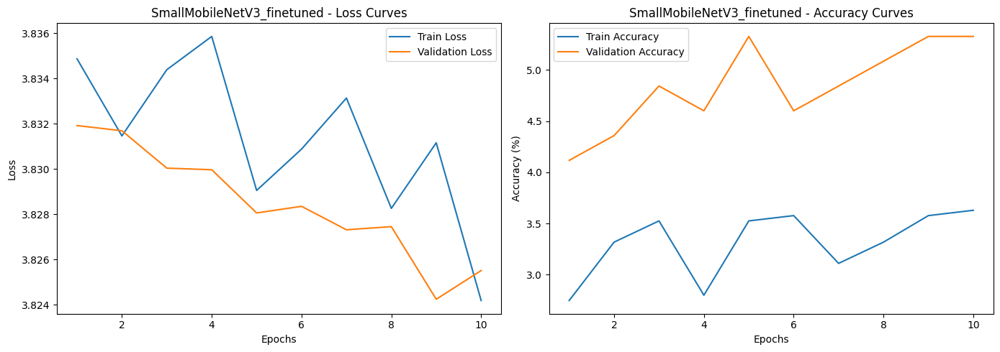

✅ Finished fine‐tuning SmallMobileNetV3. Best checkpoint saved as 'SmallMobileNetV3_finetuned.pt' in results_dir.

All specified models have been fine‐tuned.


In [ ]:
# ─── Fine‐tune multiple models by unfreezing deeper layers ─────────────────────────
# Assumptions:
# • The cells defining all model classes (e.g. ResSimDW, ResSimDW_3Blocks, ResSimDW_BatchNorm,
#   SmallMobileNet, SmallMobileNetV1, SmallMobileNetV2, SmallMobileNetV2_LeakyRelu, SmallMobileNetV3,
#   plus MobileNetV2_Lightweight and MobileNetV3_Large_Light) have already been run.
# • The `train_loader`, `val_loader`, `NUM_CLASSES`, `DEVICE`, and `results_dir` variables exist.
# • The `train_step`, `val_step`, and `train` functions are defined in this notebook.
# • Checkpoint files (e.g. “ResSimDW_yoga.pt”) live under `saved_dir`.
#
# Goal:
# For each pretrained checkpoint, load the model, freeze most weights, then “unfreeze”
# (mark requires_grad=True) for a deeper convolutional block (and the final FC), set up
# an optimizer that only updates those unfrozen layers, and then run `train(...)` to fine‐tune.

import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import StepLR

# ─── 1) Define model factories using the global NUM_CLASSES ──────────────────────
model_factories = {
    'mobilenet_v2_light'            : lambda: MobileNetV2_Lightweight(NUM_CLASSES),
    'mobilenet_v3_large_light_yoga' : lambda: MobileNetV3_Large_Light(NUM_CLASSES),
    'ResSimDW'                      : lambda: ResSimDW(NUM_CLASSES),
    'ResSimDW_3Blocks'              : lambda: ResSimDW_3Blocks(NUM_CLASSES),
    'ResSimDW_BatchNorm'            : lambda: ResSimDW_BatchNorm(NUM_CLASSES),
    'SmallMobileNet'                : lambda: SmallMobileNet(NUM_CLASSES),
    'SmallMobileNetV1'              : lambda: SmallMobileNetV1(NUM_CLASSES),
    'SmallMobileNetV2'              : lambda: SmallMobileNetV2(NUM_CLASSES),
    'SmallMobileNetV2_LeakyRelu'     : lambda: SmallMobileNetV2_LeakyRelu(NUM_CLASSES),
    'SmallMobileNetV3'              : lambda: SmallMobileNetV3(NUM_CLASSES),
}

# ─── 2) Specify checkpoint filenames (must match keys above plus “_yoga.pt”) ───────
checkpoints = [
    'mobilenet_v2_light_yoga.pt',
    'mobilenet_v3_large_light_yoga.pt',
    'ResSimDW_yoga.pt',
    'ResSimDW_3Blocks_yoga.pt',
    'ResSimDW_BatchNorm_yoga.pt',
    'SmallMobileNet_yoga.pt',
    'SmallMobileNetV1_yoga.pt',
    'SmallMobileNetV2_yoga.pt',
    'SmallMobileNetV2_LeakyRelu_yoga.pt',
    'SmallMobileNetV3_yoga.pt',
]

# saved_dir = "/content/drive/MyDrive/UPF/Third_Year/Third_Trimester/Deep_Learning/Labs/Final Project-Yoga/results"
saved_dir = '/content/drive/MyDrive/Data Science Enginnering/3r/T3/Deep Learning/DL Labs & Project/Final_Project_Joan_Adria/results'

NUM_EPOCHS      = 10    # number of fine‐tuning epochs
LR              = 1e-4  # lower LR for fine‐tuning
MOMENTUM        = 0.9
WEIGHT_DECAY    = 1e-4
STEP_LR_EPOCHS  = 3
GAMMA           = 0.1

# ─── 3) Loop over each checkpoint, load, freeze, unfreeze certain layers, then train ─
for ckpt_filename in checkpoints:
    key = ckpt_filename.replace("_yoga.pt", "")
    print(f"\n\n===== Fine‐tuning {key} =====")

    # 3.1) Verify the factory exists
    if key not in model_factories:
        print(f"⚠️  No factory defined for model '{key}'. Skipping.")
        continue

    # 3.2) Instantiate model (with final‐fc size = NUM_CLASSES)
    model = model_factories[key]().to(DEVICE)

    # 3.3) Load pretrained checkpoint (ignore missing/mismatched fc if any)
    ckpt_path = os.path.join(saved_dir, ckpt_filename)
    if not os.path.isfile(ckpt_path):
        print(f"⚠️  Checkpoint file not found: {ckpt_path}. Skipping.")
        continue
    try:
        state_dict = torch.load(ckpt_path, map_location=DEVICE)
        # If checkpoint is a dict with "model_state_dict":
        if isinstance(state_dict, dict) and "model_state_dict" in state_dict:
            state_dict = state_dict["model_state_dict"]
        model.load_state_dict(state_dict, strict=False)
        print(f"✅ Loaded weights from {ckpt_filename}")
    except Exception as e:
        print(f"⚠️  Error loading state_dict for {key}: {e}")
        continue

    # 3.4) Freeze all parameters by default
    for param in model.parameters():
        param.requires_grad = False

    # 3.5) Choose which blocks to unfreeze for fine‐tuning
    #       We unfreeze:
    #       • The final fully‐connected layer (“fc” or “classifier” depending on architecture)
    #       • A deeper convolutional block. For ResSimDW variants: “block2” (and “block3” if it exists).
    #         For SmallMobileNet variants: unfreeze the entire “blocks” sequential module plus “fc”.
    #         For MobileNetV2/3 variants: unfreeze the “features” module plus “classifier”.

    unfrozen_patterns = []
    if key.startswith("ResSimDW"):
        # For ResSimDW and variants
        unfrozen_patterns = ["block2", "block3", "fc"]
    elif key.startswith("SmallMobileNet"):
        # For SmallMobileNet variants: unfreeze “blocks” and “fc”
        unfrozen_patterns = ["blocks", "fc"]
    elif key.startswith("mobilenet_v2"):
        # For MobileNetV2_Lightweight: unfreeze “features” and “classifier”
        unfrozen_patterns = ["features", "classifier"]
    elif key.startswith("mobilenet_v3"):
        # For MobileNetV3_Large_Light: unfreeze “features” and “classifier”
        unfrozen_patterns = ["features", "classifier"]
    else:
        # Fallback: only unfreeze final layer
        unfrozen_patterns = ["fc", "classifier"]

    # 3.6) Apply unfreeze logic
    for name, param in model.named_parameters():
        for pat in unfrozen_patterns:
            if pat in name:
                param.requires_grad = True
                break

    # 3.7) Build optimizer on only unfrozen parameters
    trainable_params = [p for p in model.parameters() if p.requires_grad]
    if not trainable_params:
        print(f"⚠️  No parameters are unfrozen for {key}. Skipping training.")
        continue

    optimizer = optim.SGD(
        trainable_params,
        lr=LR,
        momentum=MOMENTUM,
        weight_decay=WEIGHT_DECAY
    )
    scheduler = StepLR(optimizer, step_size=STEP_LR_EPOCHS, gamma=GAMMA)
    criterion = nn.CrossEntropyLoss()

    print(f"→ Unfrozen layers for {key}: {unfrozen_patterns}")
    train_losses, train_accs, val_losses, val_accs = train(
        model        = model,
        train_loader = train_loader,
        val_loader   = val_loader,
        criterion    = criterion,
        optimizer    = optimizer,
        device       = device,
        num_epochs   = NUM_EPOCHS,
        model_name   = f"{key}_finetuned.pt"
    )

    # 3.8) Plot the training curves
    plot_training_results(
        train_losses,
        val_losses,
        train_accs,
        val_accs,
        model_name = key + "_finetuned"
    )

    print(f"✅ Finished fine‐tuning {key}. Best checkpoint saved as '{key}_finetuned.pt' in results_dir.")

print("\nAll specified models have been fine‐tuned.")


### 🧪 Checkpoint Loading and Evaluation

This section defines a model factory and loads the fine-tuned versions of each small CNN model.

For each model:
- The architecture is reconstructed using its factory function
- Fine-tuned weights are loaded from disk
- Evaluation is performed on the training, validation, and test sets
- Key metrics (accuracy, precision, recall, F1-score, inference time) are computed
- Confusion matrices are generated to visualize class-wise performance

The purpose is to assess whether small CNNs, enhanced through **partial unfreezing and fine-tuning**, can be viable for our yoga pose classification task — despite their original training on a different dataset (SVHN) and a smaller input resolution.



Loading ResSimDW_finetuned.pt → factory key 'ResSimDW'
✅ Successfully loaded ResSimDW_finetuned.pt


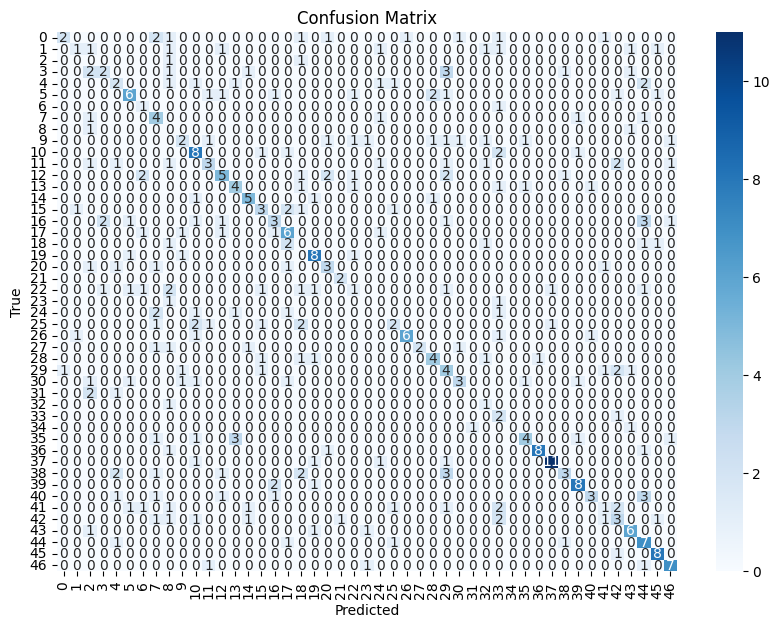

Confusion Matrix for ResSimDW:
[[2 0 0 ... 0 0 0]
 [0 1 1 ... 0 1 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 7 0 0]
 [0 0 0 ... 0 8 0]
 [0 0 0 ... 1 0 7]]

Loading ResSimDW_3Blocks_finetuned.pt → factory key 'ResSimDW_3Blocks'
✅ Successfully loaded ResSimDW_3Blocks_finetuned.pt


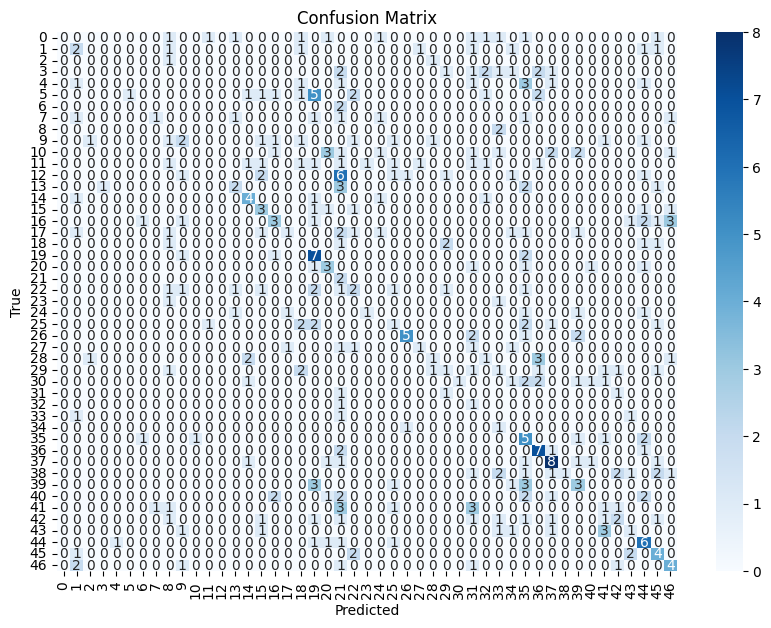

Confusion Matrix for ResSimDW_3Blocks:
[[0 0 0 ... 0 1 0]
 [0 2 0 ... 1 1 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 6 0 0]
 [0 1 0 ... 0 4 0]
 [0 2 0 ... 0 0 4]]

Loading ResSimDW_BatchNorm_finetuned.pt → factory key 'ResSimDW_BatchNorm'
✅ Successfully loaded ResSimDW_BatchNorm_finetuned.pt


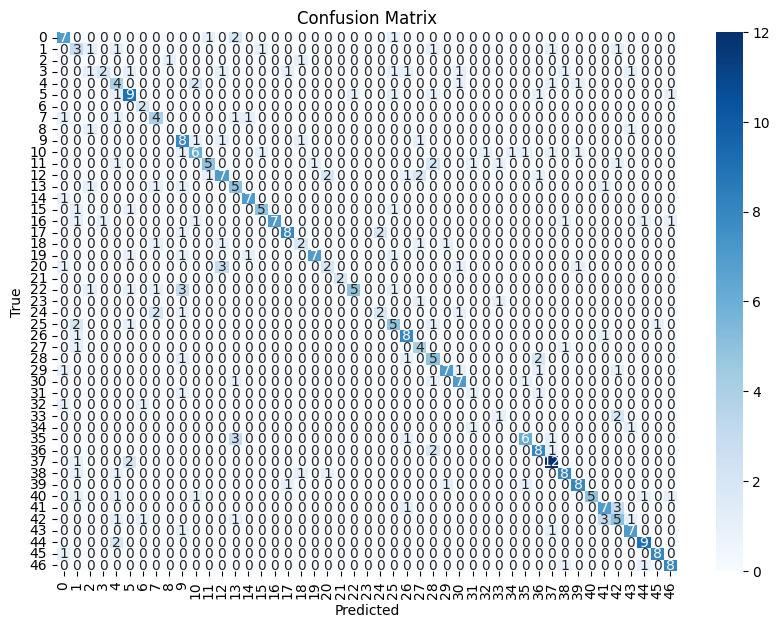

Confusion Matrix for ResSimDW_BatchNorm:
[[7 0 0 ... 0 0 0]
 [0 3 1 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 9 0 0]
 [1 0 0 ... 0 8 0]
 [0 0 0 ... 1 0 8]]

Loading SmallMobileNet_finetuned.pt → factory key 'SmallMobileNet'
✅ Successfully loaded SmallMobileNet_finetuned.pt


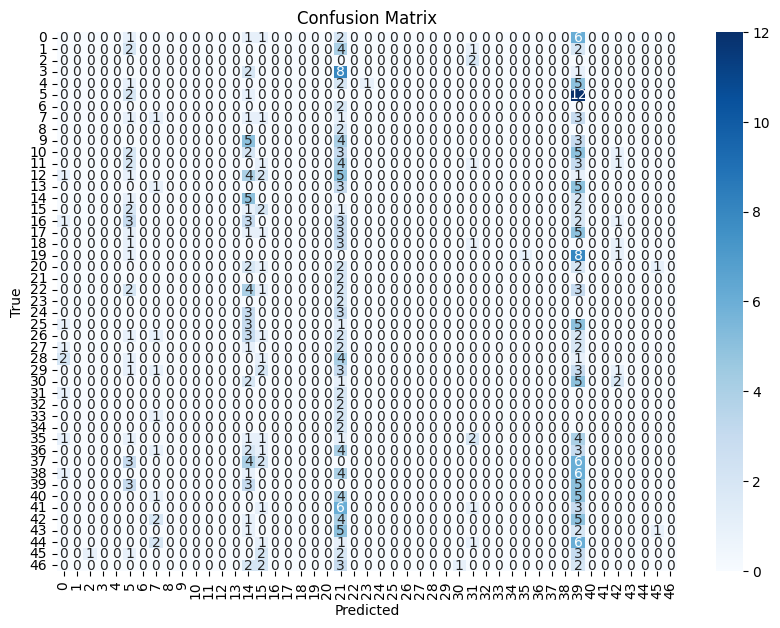

Confusion Matrix for SmallMobileNet:
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 1 ... 0 0 0]
 [0 0 0 ... 0 0 0]]

Loading SmallMobileNetV1_finetuned.pt → factory key 'SmallMobileNetV1'
✅ Successfully loaded SmallMobileNetV1_finetuned.pt


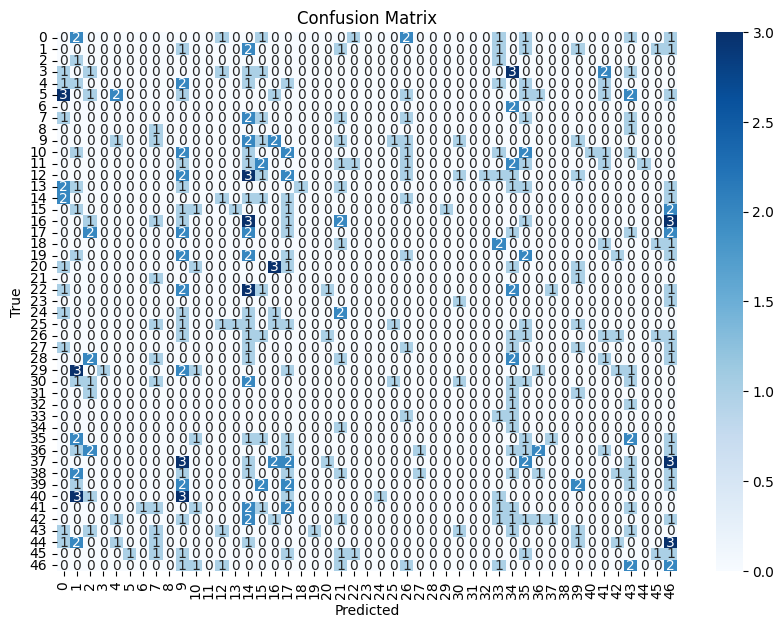

Confusion Matrix for SmallMobileNetV1:
[[0 2 0 ... 0 0 1]
 [0 0 0 ... 0 1 1]
 [0 1 0 ... 0 0 0]
 ...
 [1 2 0 ... 0 0 3]
 [0 0 0 ... 0 1 1]
 [0 0 0 ... 0 0 2]]

Loading SmallMobileNetV2_finetuned.pt → factory key 'SmallMobileNetV2'
✅ Successfully loaded SmallMobileNetV2_finetuned.pt


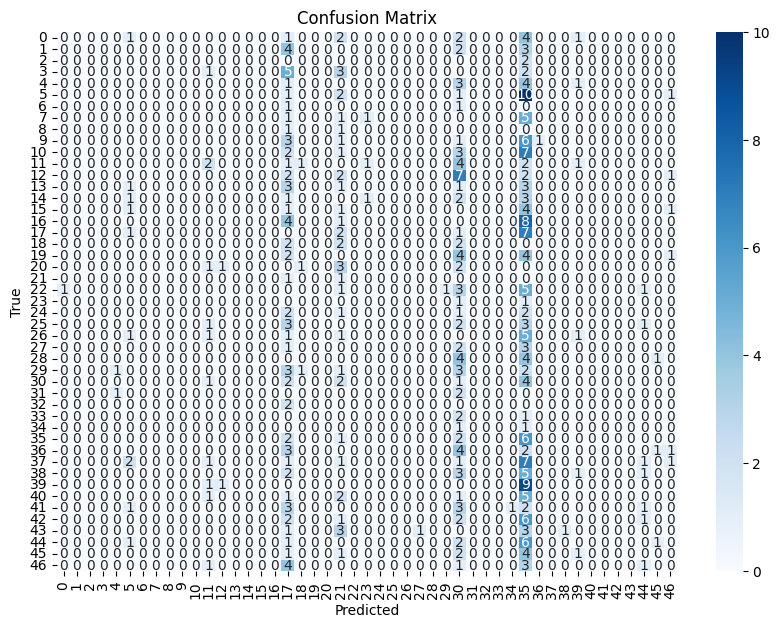

Confusion Matrix for SmallMobileNetV2:
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 1 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 1 0 0]]

Loading SmallMobileNetV2_LeakyRelu_finetuned.pt → factory key 'SmallMobileNetV2_LeakyRelu'
✅ Successfully loaded SmallMobileNetV2_LeakyRelu_finetuned.pt


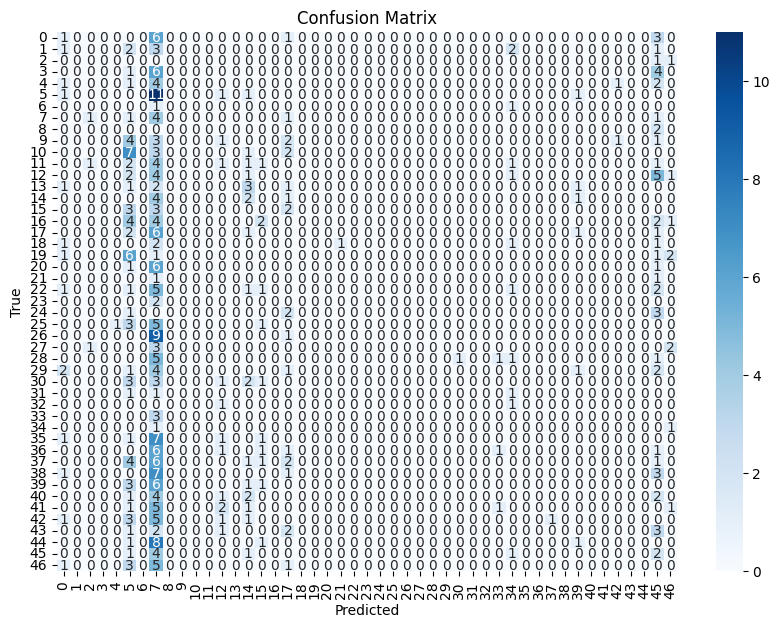

Confusion Matrix for SmallMobileNetV2_LeakyRelu:
[[1 0 0 ... 0 3 0]
 [1 0 0 ... 0 1 0]
 [0 0 0 ... 0 1 1]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 2 0]
 [1 0 0 ... 0 0 0]]

Loading SmallMobileNetV3_finetuned.pt → factory key 'SmallMobileNetV3'
✅ Successfully loaded SmallMobileNetV3_finetuned.pt


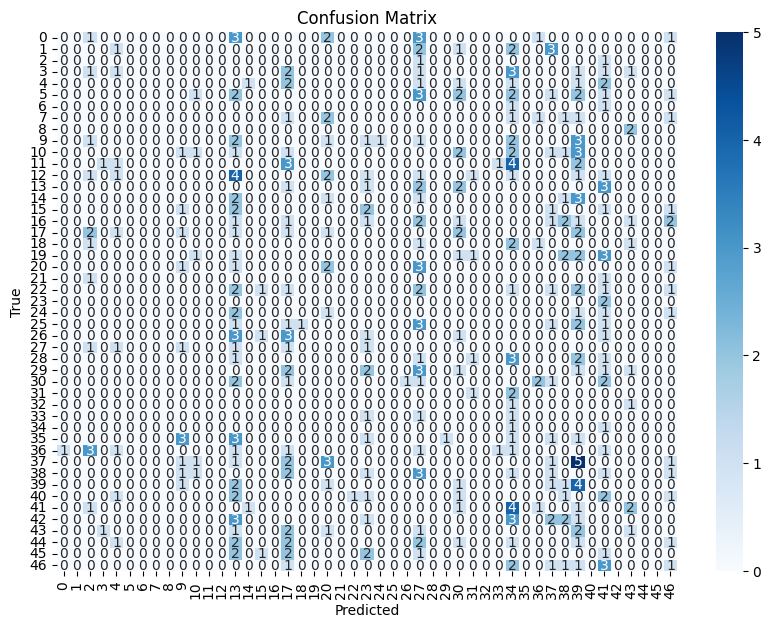

Confusion Matrix for SmallMobileNetV3:
[[0 0 1 ... 0 0 1]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 1]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 1]]

+----------------------------+--------------+-------------+-----------+------------+-------------+----------+------------+------------------------------+
| Model                      | Parameters   | Train Acc   | Val Acc   | Test Acc   |   Precision |   Recall |   F1-Score | Inference Time (sec/image)   |
+============================+==============+=============+===========+============+=============+==========+============+==============================+
| ResSimDW                   | 207,501      | 38.05%      | 39.71%    | 39.61%     |        0.46 |     0.4  |       0.4  | 0.000047 sec/image           |
+----------------------------+--------------+-------------+-----------+------------+-------------+----------+------------+------------------------------+
| ResSimDW_3Blocks           | 72,717       | 11.30%      | 19.13%    

In [ ]:
# ─── Evaluate all fine‐tuned models using their “_finetuned.pt” checkpoints ─────────────────────────
# Assumptions:
# • The cells defining all model classes and utility functions (inference, inference_with_metrics,
#   compute_model_params, compute_metrics) have already been run.
# • The `train_loader`, `val_loader`, `test_loader`, `NUM_CLASSES`, and `DEVICE` variables exist.
# • Fine‐tuned checkpoint files have names like “ResSimDW_finetuned.pt” under `saved_dir`.
#
# Goal:
# Load each “<ModelKey>_finetuned.pt” file, instantiate the corresponding model,
# compute train/val/test accuracy plus precision/recall/F1, and print a summary table.

import os
import torch
from tabulate import tabulate

# ─── 1) Define the same model factories as used during fine‐tuning ─────────────────────
model_factories = {
    #'mobilenet_v2_light'            : lambda: MobileNetV2_Lightweight(NUM_CLASSES),
    #'mobilenet_v3_large_light_yoga' : lambda: MobileNetV3_Large_Light(NUM_CLASSES),
    'ResSimDW'                      : lambda: ResSimDW(NUM_CLASSES),
    'ResSimDW_3Blocks'              : lambda: ResSimDW_3Blocks(NUM_CLASSES),
    'ResSimDW_BatchNorm'            : lambda: ResSimDW_BatchNorm(NUM_CLASSES),
    'SmallMobileNet'                : lambda: SmallMobileNet(NUM_CLASSES),
    'SmallMobileNetV1'              : lambda: SmallMobileNetV1(NUM_CLASSES),
    'SmallMobileNetV2'              : lambda: SmallMobileNetV2(NUM_CLASSES),
    'SmallMobileNetV2_LeakyRelu'     : lambda: SmallMobileNetV2_LeakyRelu(NUM_CLASSES),
    'SmallMobileNetV3'              : lambda: SmallMobileNetV3(NUM_CLASSES),
}

# ─── 2) Build the list of fine‐tuned checkpoint filenames ──────────────────────────────
# Each key in model_factories should correspond to a file named "<key>_finetuned.pt"
checkpoints = [f"{key}_finetuned.pt" for key in model_factories.keys()]

# saved_dir = "/content/drive/MyDrive/UPF/Third_Year/Third_Trimester/Deep_Learning/Labs/Final Project-Yoga/results"
saved_dir = '/content/drive/MyDrive/Data Science Enginnering/3r/T3/Deep Learning/DL Labs & Project/Final_Project_Joan_Adria/results'



# ─── 3) Prepare to collect evaluation results ────────────────────────────────────────
results = []

for ckpt_filename in checkpoints:
    key = ckpt_filename.replace("_finetuned.pt", "")
    print(f"\nLoading {ckpt_filename} → factory key '{key}'")

    # 3.1) Verify that factory exists
    if key not in model_factories:
        print(f"⚠️  Model key '{key}' not found in model_factories. Skipping.")
        continue

    # 3.2) Instantiate model and load the fine‐tuned checkpoint
    model = model_factories[key]().to(device)
    ckpt_path = os.path.join(saved_dir, ckpt_filename)
    if not os.path.isfile(ckpt_path):
        print(f"⚠️  Checkpoint file not found: {ckpt_path}. Skipping.")
        continue

    try:
        state_dict = torch.load(ckpt_path, map_location=device)
        # If checkpoint was saved as a dict with more keys, extract the state_dict
        if isinstance(state_dict, dict) and "model_state_dict" in state_dict:
            state_dict = state_dict["model_state_dict"]
        model.load_state_dict(state_dict, strict=False)
        print(f"✅ Successfully loaded {ckpt_filename}")
    except Exception as e:
        print(f"⚠️  Error loading model '{key}': {e}")
        continue

    model.eval()

    # 3.3) Run inference on train, val, and test splits
    acc_train     = inference(model, train_loader, device)
    acc_val       = inference(model, val_loader, device)
    acc_test, precision, recall, f1, inference_time = inference_with_metrics(model, test_loader, device)

    # 3.4) Compute total parameter count
    param_count = compute_model_params(model)

    # 3.5) Generate confusion‐matrix‐based metrics on test set
    acc, precision_conf, recall_conf, f1_conf, cm = compute_metrics(model, test_loader, device)

    print(f"Confusion Matrix for {key}:")
    print(cm)

    # 3.6) Append to results table
    results.append([
        key,
        f"{param_count:,}",          # number of parameters
        f"{acc_train:.2f}%",         # train accuracy
        f"{acc_val:.2f}%",           # val accuracy
        f"{acc_test:.2f}%",          # test accuracy
        f"{precision:.2f}",          # precision (from inference_with_metrics)
        f"{recall:.2f}",             # recall (from inference_with_metrics)
        f"{f1:.2f}",                 # F1‐Score (from inference_with_metrics)
        f"{inference_time:.6f} sec/image"  # inference time per image
    ])

# ─── 4) Print summary table ─────────────────────────────────────────────────────────
headers = [
    "Model",
    "Parameters",
    "Train Acc",
    "Val Acc",
    "Test Acc",
    "Precision",
    "Recall",
    "F1-Score",
    "Inference Time (sec/image)"
]
print("\n" + tabulate(results, headers=headers, tablefmt="grid"))


### 📊 Evaluation and Results

In this section, we explored several lightweight CNN variants, aiming to improve performance on the yoga pose dataset while keeping model size and inference time low. Despite testing multiple configurations — including ResSim-style models and small MobileNet-inspired architectures — the results remained **well below practical deployment thresholds**.

- The only model to reach a **moderate level of performance** was `ResSimDW_BatchNorm`, achieving a **test accuracy of 57.49%**, with a corresponding F1-score of 0.57 — a noticeable improvement over other small models.
- Other models such as `ResSimDW`, `SmallMobileNet`, and all variants of `SmallMobileNetV1/V2/V3` performed **very poorly**, with test accuracies ranging from **2% to 40%**, and F1-scores as low as 0.01.
- This suggests that, while **batch normalization and depthwise separable convolutions** can help, **extreme downsizing** of models severely limits their ability to generalize to fine-grained tasks like yoga pose recognition.

These findings emphasize several important insights:
- 📏 **Drastic model compression** (e.g. under 100k parameters) often leads to underfitting, especially for high-variability, multi-class datasets.
- 🔁 Techniques like **batch normalization** and **depthwise separable convolutions** help stabilize training and can yield modest gains in small networks.
- ⚠️ **Transferring architectures from domains like SVHN or CIFAR** does not guarantee success when applied to more complex domains such as human poses.

🧠 Overall, while this experiment provided valuable understanding of the trade-offs between size and performance, it reaffirms that **aggressive model miniaturization** without architectural adaptations or pretraining in a closer domain is not sufficient for this task.


### 🔁 Reverting to Original Setup:

After this experiment, we reverted our input transformations back to the original 256×256 format, which had proven more effective in earlier sections. This restored setup is used in the next section (4.6) to continue improving performance through better architectural and training strategies.

In [ ]:
#################################################################################################################################################################################

# =========================
# LOAD RAW DATASET FOR YOGA POSE RECOGNITION
# =========================
from torchvision.datasets import ImageFolder
from torchvision import transforms as T
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from sklearn.model_selection import train_test_split
from collections import Counter
from PIL import Image
import torch
import os

# ✅ CONFIG
BATCH_SIZE = 32

# ✅ Load dataset using ImageFolder
raw_ds = ImageFolder(root=data_dir)
targets = [label for _, label in raw_ds.samples]
NUM_CLASSES = len(raw_ds.classes)

print(f"✅ Loaded samples: {len(raw_ds.samples)}")
print(f"🏷️  Classes: {NUM_CLASSES}")

# =========================
# DEFINE TRANSFORMS
# =========================
train_transforms = T.Compose([
    T.Resize((256, 256)),                        # Resize to fixed dimensions
    T.RandomResizedCrop(224, scale=(0.85, 1.0)), # Slight zooms
    T.RandomHorizontalFlip(p=0.5),               # Flip left-right
    T.RandomRotation(degrees=10),                # Small angle rotation
    T.ColorJitter(brightness=0.1, contrast=0.1), # Slight brightness/contrast shift
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406],
                [0.229, 0.224, 0.225])

])

val_test_transforms = T.Compose([
    T.Resize((256, 256)),               # First resize to a known size
    T.CenterCrop(224),                  # Crop to fixed size
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406],
                [0.229, 0.224, 0.225])
])


# =========================
# STRATIFIED SPLIT (70/15/15)
# =========================
indices = list(range(len(targets)))
train_idx, temp_idx, _, temp_y = train_test_split(indices, targets, test_size=0.30, stratify=targets, random_state=42)
val_idx, test_idx, _, _ = train_test_split(temp_idx, temp_y, test_size=0.50, stratify=temp_y, random_state=42)

train_samples = [raw_ds.samples[i] for i in train_idx]
val_samples   = [raw_ds.samples[i] for i in val_idx]
test_samples  = [raw_ds.samples[i] for i in test_idx]

# =========================
# DEFINE Custom Dataset class
# =========================
class ImageDatasetWithTransform(Dataset):
    def __init__(self, samples, transform):
        self.samples = samples
        self.transform = transform

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        path, label = self.samples[idx]
        image = Image.open(path).convert("RGB")
        image = self.transform(image)
        return image, label

# ✅ Apply transforms to datasets
train_dataset = ImageDatasetWithTransform(train_samples, train_transforms)
val_dataset   = ImageDatasetWithTransform(val_samples, val_test_transforms)
test_dataset  = ImageDatasetWithTransform(test_samples, val_test_transforms)

# =========================
# CLASS-WEIGHTED SAMPLER
# =========================
counts = Counter(targets)
class_counts = torch.tensor([counts[i] for i in range(NUM_CLASSES)], dtype=torch.float)
class_weights = 1.0 / class_counts
sample_weights = [class_weights[label] for _, label in train_samples]

sampler = WeightedRandomSampler(
    weights=sample_weights,
    num_samples=len(sample_weights),
    replacement=True
)

# =========================
# DATALOADERS
# =========================
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, sampler=sampler, num_workers=2, pin_memory=True)
val_loader   = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)
test_loader  = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)

# =========================
# FINAL CHECK
# =========================
print("\n✅ DataLoader verification")
print(f"   🟢 Train samples: {len(train_dataset)}")
print(f"   🔵 Validation samples: {len(val_dataset)}")
print(f"   🟠 Test samples: {len(test_dataset)}")

batch = next(iter(train_loader))
print("📦 Batch type:", type(batch[0]), batch[0].shape)
print("🎯 Ready for training!")

#################################################################################################################################################################################


✅ Loaded samples: 2756
🏷️  Classes: 47

✅ DataLoader verification
   🟢 Train samples: 1929
   🔵 Validation samples: 413
   🟠 Test samples: 414
📦 Batch type: <class 'torch.Tensor'> torch.Size([32, 3, 224, 224])
🎯 Ready for training!


## **4.6. Final Architecture Choice: ConvNeXt‑Tiny & ResNet34**

After thoroughly evaluating a wide range of CNN architectures — from lightweight custom designs to state-of-the-art pretrained models — two architectures stood out as the most promising for yoga pose classification. These models achieved the best balance between **accuracy**, **model complexity**, and **inference time**:

- 🏆 **ConvNeXt-Tiny** – Our top-performing model across all evaluation metrics.
- ⚖️ **ResNet34** – A strong contender that combines excellent accuracy with moderate parameter count and very fast inference.

These models clearly outperformed others in terms of test accuracy, F1-score, and robustness (see Section 4.7), making them ideal candidates for further optimization and deployment.


### 🧠 ConvNeXt-Tiny Architecture

ConvNeXt-Tiny is a modern convolutional neural network that blends transformer-inspired design with efficient convolutional operations. Introduced in [“A ConvNet for the 2020s”](https://arxiv.org/abs/2201.03545), it integrates residual connections, GELU activations, and deep stage-wise structures to deliver top-tier performance.

**Key architectural components**:
1. **Patchify Stem**:
   - A `4×4` stride-4 convolution embeds patches, reducing resolution early on.
   - Followed by `LayerNorm` over 96 channels.

2. **Four Stages of ConvNeXt Blocks**:
   - Each block contains:
     - Depthwise 7×7 convs  
     - Pointwise 1×1 convs  
     - GELU activations  
     - Residual connections  
   - Stage depth: `[3, 3, 9, 3]`; channel sizes: `[96, 192, 384, 768]`

3. **Classifier Head**:
   - Global average pooling → LayerNorm → Linear → Output

**Performance Summary**:
- 🟢 **89.37%** Test Accuracy / **F1 = 0.89**
- 🟡 27.9M Parameters
- ⚡ Inference time: **0.000571 sec/image**

➡️ **Recommendation**: Use ConvNeXt-Tiny when top accuracy is critical and you can afford moderate parameter size and minimal inference latency.

### 🧠 ResNet34 Architecture

ResNet34, part of the Residual Network family by [He et al. (2015)](https://arxiv.org/abs/1512.03385), remains highly competitive thanks to its deep residual learning and strong generalization capabilities. It features identity shortcuts that mitigate the vanishing gradient problem in deeper networks.

**Architectural highlights**:
- 34 layers with grouped residual blocks  
- Deep architecture with repeated skip connections  
- Simple yet powerful design, ideal for stable training

**Performance Summary**:
- 🟢 **87.44%** Test Accuracy / **F1 = 0.87**
- 🟡 21.3M Parameters
- ⚡ Inference time: **0.000288 sec/image**

➡️ **Recommendation**: Choose ResNet34 for top-tier accuracy with faster inference and fewer parameters than ConvNeXt-Tiny.

### ⭐ Honorable Mention: EfficientNet-B1

While it did not reach the absolute top in test accuracy, **EfficientNet-B1** deserves special mention for its exceptional **accuracy-to-parameter ratio**:

- ✅ Test Accuracy: **86.23%**
- 🔧 Parameters: **6.57M** (≈3× smaller than ResNet34)
- 🚀 Inference Time: **0.000976 sec/image**

This makes it a **highly efficient alternative** when memory constraints or deployment on edge devices are a concern.


### 🤔 Why These Three Models?

| Model           | Test Acc | Params   | Inference Time      | Strengths                                             |
|----------------|----------|----------|----------------------|--------------------------------------------------------|
| ConvNeXt-Tiny  | **89.37%** | 27.9M   | 0.000571 s/img       | Best accuracy, robust modern architecture              |
| ResNet34        | 87.44%   | 21.3M   | 0.000288 s/img       | Excellent accuracy with fast inference                 |
| EfficientNet-B1 | 86.23%   | **6.6M** | 0.000976 s/img       | Strong performance with small size and fast training   |

These models combine **scalability**, **robustness**, and **efficient computation**, and they significantly outperform earlier lightweight and custom CNNs. ConvNeXt-Tiny is the **accuracy leader**, ResNet34 offers a strong balance, and EfficientNet-B1 stands out as a **resource-conscious choice**.

## **4.7. Hyperparameter Tunning on the FAC**

### 🧠 Final Freeze-Aware Fine-Tuning (Classifier Only): Hyperparameter Exploration on ConvNeXt-Tiny & ResNet34

As the final step in our yoga pose classification pipeline, we perform **classifier-only fine-tuning** on our two best models:  
- 🏆 **ConvNeXt-Tiny**: our top performer in accuracy (**89.37%**)  
- ⚖️ **ResNet34**: a strong contender offering high accuracy (**87.44%**) with fewer parameters and faster training time

In this stage, we freeze all pretrained feature extractor layers and **fine-tune only the classifier head**. This allows us to:
- Efficiently adapt powerful ImageNet-pretrained backbones to our specific yoga dataset.
- Reduce computational overhead and prevent overfitting.
- Quickly compare multiple hyperparameter configurations under a low-resource setting.

---

### 🔧 Why These Hyperparameters? Our Experimental Grid

We define a 12-run search (`FT_C1`–`FT_C6` for ConvNeXt, `FT_R1`–`FT_R6` for ResNet34) combining key training hyperparameters:

| Hyperparameter       | Values Explored                         | Rationale |
|----------------------|------------------------------------------|-----------|
| **Optimizer**        | `AdamW`, `SGD`, `RMSprop`                | Evaluate adaptive vs classical momentum optimizers in low-gradient regimes. |
| **Learning Rate**    | `1e-5` to `5e-4`                          | Lower LRs ensure stable updates when only a few layers are trained. |
| **Weight Decay**     | `5e-5`, `1e-4`                            | Regularizes the classifier to avoid overfitting. |
| **Scheduler**        | `CosineAnneal`, `OneCycle`, `StepLR`     | Test smooth vs aggressive learning rate decay strategies. |
| **Dropout**          | `0.0`, `0.2`                              | Regularizes the classifier when the dataset is small. |
| **Label Smoothing**  | `0.0`, `0.1`                              | Encourages generalization and reduces overconfidence. |
| **Batch Sizes**      | `16`, `24`, `32`, `48`, `64`             | Trade-off between speed, convergence, and GPU memory. |

Each run represents a unique combination of these settings, aimed at identifying the **most effective configuration for transfer learning** under frozen-backbone constraints.

---

### ⚙️ What This Cell Does

This loop automates the entire training and evaluation pipeline for each experiment:
1. Loads the latest pretrained checkpoint (if available).
2. Freezes all feature extraction layers; unfreezes only the classifier.
3. Optionally adds dropout and redefines the classifier for the yoga label count.
4. Instantiates the appropriate optimizer and learning rate scheduler.
5. Trains the model for 10 epochs and tracks train/val curves.
6. Evaluates the final model on the test set:
   - Accuracy, Precision, Recall, F1-score, Inference Time
   - Confusion Matrix for qualitative insight
7. Saves all results to `freeze_aware_finetune_summary.csv` for ranked comparison.

---

### 🧩 Why This Matters

This stage offers a **cost-effective, reliable benchmark** to select the best configurations before moving to more advanced strategies (like **partial unfreezing**). It finalizes the comparison of our best models and ensures we make an informed decision for deployment or further refinement.

✅ With this, we conclude the structured exploration of yoga pose classification using deep learning — from naive baselines to efficient, state-of-the-art transfer learning.



==== Starting FT_C1 (ConvNeXt-Tiny) ====


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ConvNeXt_Tiny_Weights.IMAGENET1K_V1`. You can also use `weights=ConvNeXt_Tiny_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/convnext_tiny-983f1562.pth" to /root/.cache/torch/hub/checkpoints/convnext_tiny-983f1562.pth
100%|██████████| 109M/109M [00:00<00:00, 211MB/s]


→ Loading checkpoint: /content/drive/MyDrive/Final_Project_Joan_Adria/results/convnext_tiny_yoga.pt
→ Inserting Dropout(0.2) into ConvNeXt-Tiny classifier
→ Optimizer: AdamW (lr=1e-05, wd=0.0001)
→ Scheduler: CosineAnnealLR
→ Batch size: 64, Max epochs: 10

→ Beginning training …
- Epoch 1: Metrics --> Train Loss: 3.9916 | Train  Acc: 1.5034 | Val Loss: 3.8575 | Val Acc: 3.3898 | Time: 34m 12.20s
- Epoch 2: Metrics --> Train Loss: 3.9075 | Train  Acc: 2.2291 | Val Loss: 3.8007 | Val Acc: 4.3584 | Time: 10m 54.50s
- Epoch 3: Metrics --> Train Loss: 3.8422 | Train  Acc: 3.9917 | Val Loss: 3.7456 | Val Acc: 4.8426 | Time: 4m 45.64s
- Epoch 4: Metrics --> Train Loss: 3.8244 | Train  Acc: 4.8212 | Val Loss: 3.6903 | Val Acc: 6.0533 | Time: 2m 17.85s
- Epoch 5: Metrics --> Train Loss: 3.7532 | Train  Acc: 5.9616 | Val Loss: 3.6357 | Val Acc: 8.2324 | Time: 1m 35.56s
- Epoch 6: Metrics --> Train Loss: 3.6821 | Train  Acc: 7.3613 | Val Loss: 3.5819 | Val Acc: 11.3801 | Time: 0m 54.12s
- Epoch 

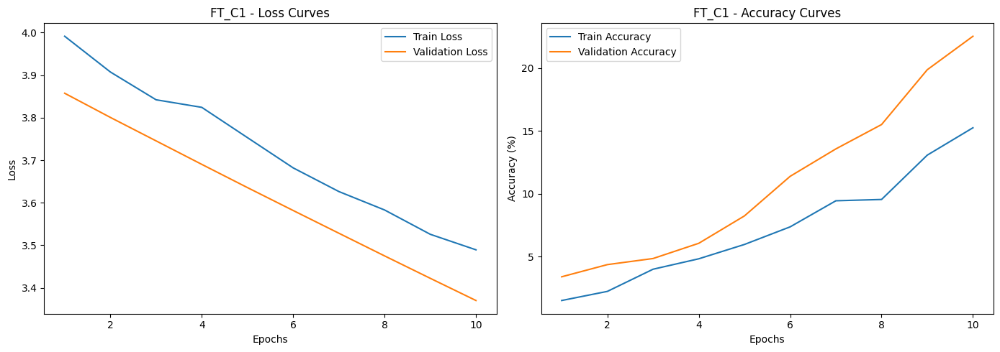

→ Loading best weights from: /content/drive/MyDrive/Final_Project_Joan_Adria/results/FT_C1_best.pt
→ Evaluating on test set …
→ Test Accuracy:  23.43%
→ Test Precision: 0.278
→ Test Recall:    0.234
→ Test F1:        0.204
→ Avg time/img:   0.000134s

→ Confusion matrix (test set):


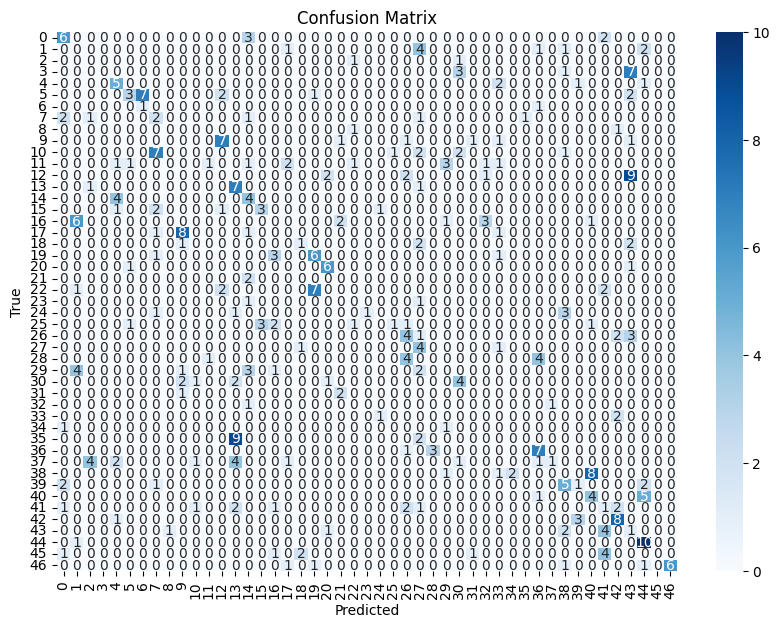


==== Starting FT_C2 (ConvNeXt-Tiny) ====


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ConvNeXt_Tiny_Weights.IMAGENET1K_V1`. You can also use `weights=ConvNeXt_Tiny_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


→ Loading checkpoint: /content/drive/MyDrive/Final_Project_Joan_Adria/results/convnext_tiny_yoga.pt
→ Inserting Dropout(0.2) into ConvNeXt-Tiny classifier
→ Optimizer: AdamW (lr=5e-05, wd=5e-05)
→ Scheduler: OneCycleLR
→ Batch size: 64, Max epochs: 10

→ Beginning training …
- Epoch 1: Metrics --> Train Loss: 3.8839 | Train  Acc: 3.4733 | Val Loss: 3.8723 | Val Acc: 3.6320 | Time: 0m 26.47s
- Epoch 2: Metrics --> Train Loss: 3.9094 | Train  Acc: 3.8880 | Val Loss: 3.8608 | Val Acc: 3.8741 | Time: 0m 28.53s
- Epoch 3: Metrics --> Train Loss: 3.8918 | Train  Acc: 3.6807 | Val Loss: 3.8495 | Val Acc: 3.8741 | Time: 0m 27.44s
- Epoch 4: Metrics --> Train Loss: 3.8886 | Train  Acc: 3.7325 | Val Loss: 3.8382 | Val Acc: 3.8741 | Time: 0m 29.15s
- Epoch 5: Metrics --> Train Loss: 3.8630 | Train  Acc: 4.7693 | Val Loss: 3.8268 | Val Acc: 3.8741 | Time: 0m 27.07s
- Epoch 6: Metrics --> Train Loss: 3.8788 | Train  Acc: 3.6288 | Val Loss: 3.8157 | Val Acc: 4.3584 | Time: 0m 27.85s
- Epoch 7: Metri

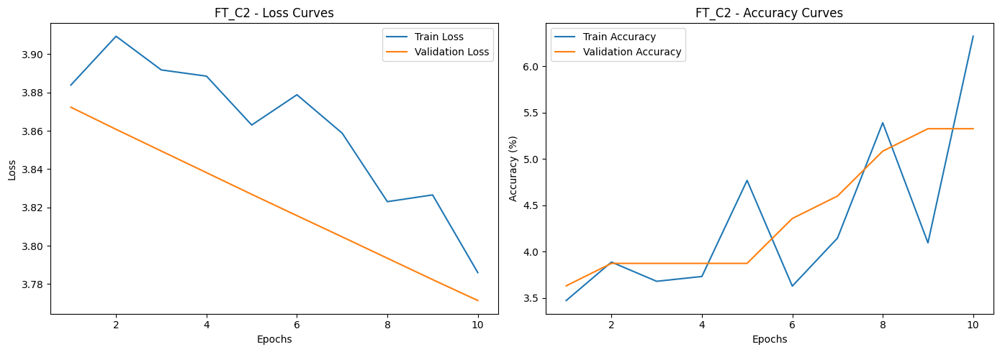

→ Loading best weights from: /content/drive/MyDrive/Final_Project_Joan_Adria/results/FT_C2_best.pt
→ Evaluating on test set …
→ Test Accuracy:  7.25%
→ Test Precision: 0.085
→ Test Recall:    0.072
→ Test F1:        0.058
→ Avg time/img:   0.000193s

→ Confusion matrix (test set):


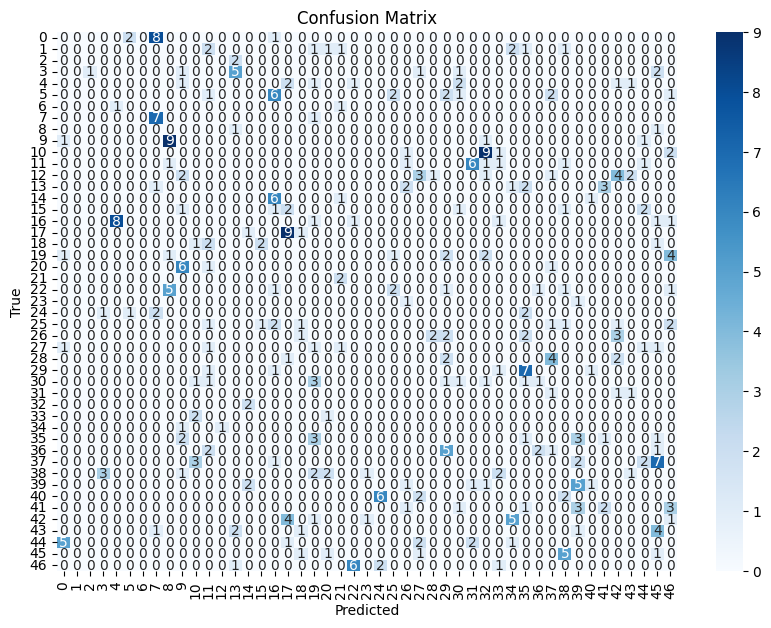


==== Starting FT_C3 (ConvNeXt-Tiny) ====


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ConvNeXt_Tiny_Weights.IMAGENET1K_V1`. You can also use `weights=ConvNeXt_Tiny_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


→ Loading checkpoint: /content/drive/MyDrive/Final_Project_Joan_Adria/results/convnext_tiny_yoga.pt
→ Inserting Dropout(0.2) into ConvNeXt-Tiny classifier
→ Optimizer: AdamW (lr=0.0001, wd=5e-05)
→ Scheduler: StepLR
→ Batch size: 48, Max epochs: 10

→ Beginning training …
- Epoch 1: Metrics --> Train Loss: 3.6606 | Train  Acc: 7.3613 | Val Loss: 3.2504 | Val Acc: 23.9709 | Time: 0m 30.50s
- Epoch 2: Metrics --> Train Loss: 2.9253 | Train  Acc: 42.6646 | Val Loss: 2.5665 | Val Acc: 63.1961 | Time: 0m 28.30s
- Epoch 3: Metrics --> Train Loss: 2.3097 | Train  Acc: 69.2068 | Val Loss: 1.9990 | Val Acc: 78.2082 | Time: 0m 27.85s
- Epoch 4: Metrics --> Train Loss: 1.7526 | Train  Acc: 84.9663 | Val Loss: 1.5539 | Val Acc: 84.9879 | Time: 0m 28.16s
- Epoch 5: Metrics --> Train Loss: 1.3481 | Train  Acc: 90.9798 | Val Loss: 1.2318 | Val Acc: 85.9564 | Time: 0m 27.51s
- Epoch 6: Metrics --> Train Loss: 1.0379 | Train  Acc: 92.8460 | Val Loss: 1.0093 | Val Acc: 87.1671 | Time: 0m 27.59s
- Epoch 

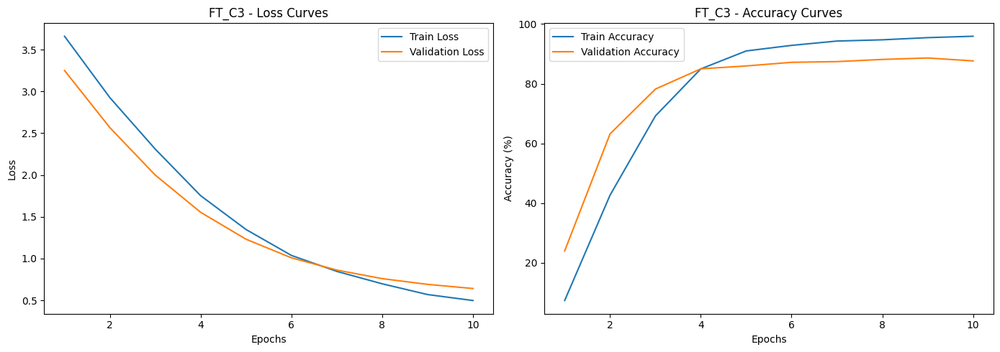

→ Loading best weights from: /content/drive/MyDrive/Final_Project_Joan_Adria/results/FT_C3_best.pt
→ Evaluating on test set …
→ Test Accuracy:  91.79%
→ Test Precision: 0.932
→ Test Recall:    0.918
→ Test F1:        0.916
→ Avg time/img:   0.000491s

→ Confusion matrix (test set):


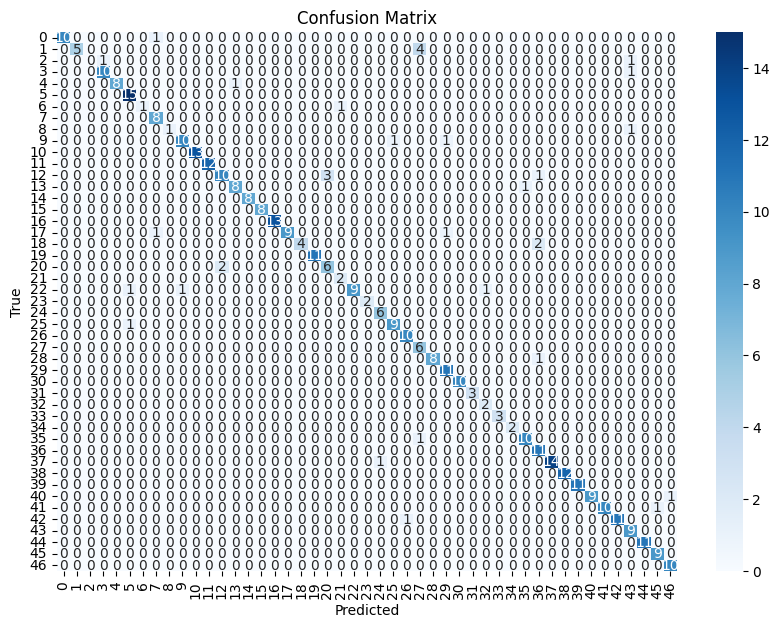


==== Starting FT_C4 (ConvNeXt-Tiny) ====


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ConvNeXt_Tiny_Weights.IMAGENET1K_V1`. You can also use `weights=ConvNeXt_Tiny_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


→ Loading checkpoint: /content/drive/MyDrive/Final_Project_Joan_Adria/results/convnext_tiny_yoga.pt
→ Inserting Dropout(0.2) into ConvNeXt-Tiny classifier
→ Optimizer: SGD (lr=0.0005, wd=0.0001)
→ Scheduler: CosineAnnealLR
→ Batch size: 48, Max epochs: 10

→ Beginning training …
- Epoch 1: Metrics --> Train Loss: 3.5836 | Train  Acc: 13.8414 | Val Loss: 3.1166 | Val Acc: 41.6465 | Time: 0m 27.60s
- Epoch 2: Metrics --> Train Loss: 2.6649 | Train  Acc: 58.3722 | Val Loss: 2.3019 | Val Acc: 71.4286 | Time: 0m 28.68s
- Epoch 3: Metrics --> Train Loss: 1.9827 | Train  Acc: 82.7372 | Val Loss: 1.7904 | Val Acc: 81.3559 | Time: 0m 26.93s
- Epoch 4: Metrics --> Train Loss: 1.5559 | Train  Acc: 89.8911 | Val Loss: 1.5119 | Val Acc: 84.2615 | Time: 0m 27.74s
- Epoch 5: Metrics --> Train Loss: 1.3204 | Train  Acc: 93.4163 | Val Loss: 1.3654 | Val Acc: 85.2300 | Time: 0m 27.59s
- Epoch 6: Metrics --> Train Loss: 1.1830 | Train  Acc: 94.7641 | Val Loss: 1.2841 | Val Acc: 85.2300 | Time: 0m 27.87s


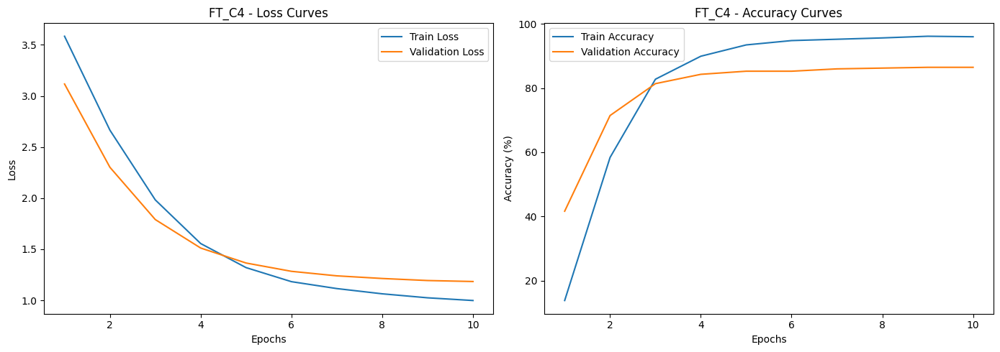

→ Loading best weights from: /content/drive/MyDrive/Final_Project_Joan_Adria/results/FT_C4_best.pt
→ Evaluating on test set …
→ Test Accuracy:  91.55%
→ Test Precision: 0.927
→ Test Recall:    0.915
→ Test F1:        0.914
→ Avg time/img:   0.000389s

→ Confusion matrix (test set):


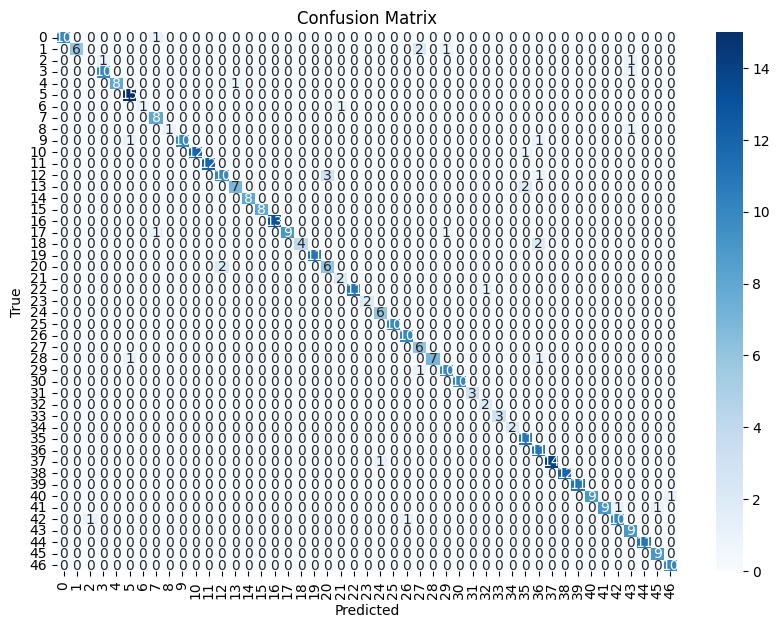


==== Starting FT_C5 (ConvNeXt-Tiny) ====


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ConvNeXt_Tiny_Weights.IMAGENET1K_V1`. You can also use `weights=ConvNeXt_Tiny_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


→ Loading checkpoint: /content/drive/MyDrive/Final_Project_Joan_Adria/results/convnext_tiny_yoga.pt
→ Optimizer: SGD (lr=0.0001, wd=5e-05)
→ Scheduler: OneCycleLR
→ Batch size: 32, Max epochs: 10

→ Beginning training …
- Epoch 1: Metrics --> Train Loss: 0.9898 | Train  Acc: 95.4381 | Val Loss: 1.2922 | Val Acc: 86.1985 | Time: 0m 26.70s
- Epoch 2: Metrics --> Train Loss: 0.9986 | Train  Acc: 94.6604 | Val Loss: 1.2914 | Val Acc: 86.1985 | Time: 0m 28.34s
- Epoch 3: Metrics --> Train Loss: 0.9799 | Train  Acc: 95.7491 | Val Loss: 1.2908 | Val Acc: 86.1985 | Time: 0m 28.57s
- Epoch 4: Metrics --> Train Loss: 0.9778 | Train  Acc: 95.3344 | Val Loss: 1.2900 | Val Acc: 86.1985 | Time: 0m 28.02s
- Epoch 5: Metrics --> Train Loss: 0.9735 | Train  Acc: 95.4381 | Val Loss: 1.2893 | Val Acc: 86.1985 | Time: 0m 27.80s
- Epoch 6: Metrics --> Train Loss: 0.9697 | Train  Acc: 95.8528 | Val Loss: 1.2887 | Val Acc: 86.1985 | Time: 0m 28.30s
- Epoch 7: Metrics --> Train Loss: 0.9784 | Train  Acc: 95.4

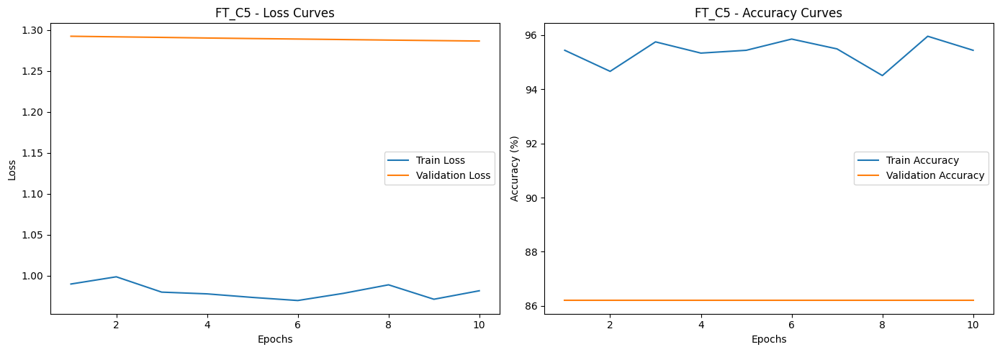

→ Loading best weights from: /content/drive/MyDrive/Final_Project_Joan_Adria/results/FT_C5_best.pt
→ Evaluating on test set …
→ Test Accuracy:  89.37%
→ Test Precision: 0.913
→ Test Recall:    0.894
→ Test F1:        0.892
→ Avg time/img:   0.000466s

→ Confusion matrix (test set):


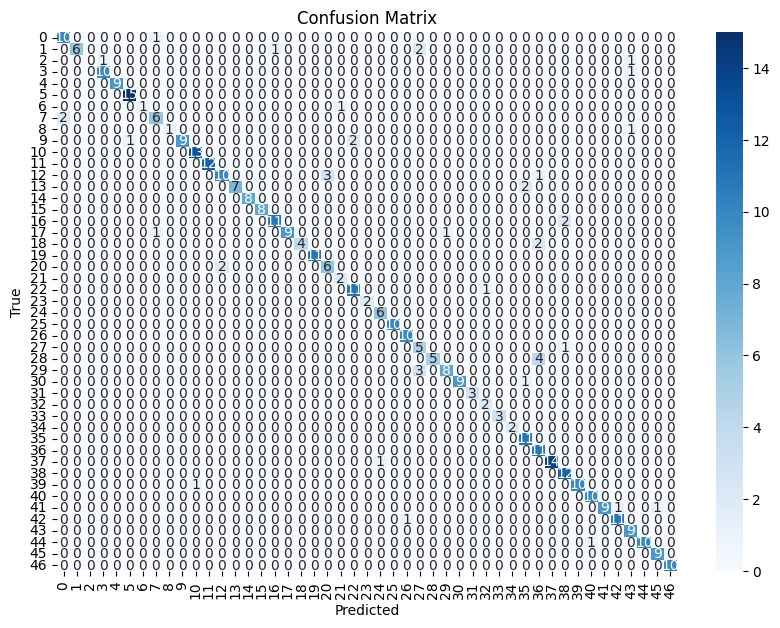


==== Starting FT_C6 (ConvNeXt-Tiny) ====


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ConvNeXt_Tiny_Weights.IMAGENET1K_V1`. You can also use `weights=ConvNeXt_Tiny_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


→ Loading checkpoint: /content/drive/MyDrive/Final_Project_Joan_Adria/results/convnext_tiny_yoga.pt
→ Inserting Dropout(0.2) into ConvNeXt-Tiny classifier
→ Optimizer: RMSprop (lr=3e-05, wd=5e-05)
→ Scheduler: CosineAnnealLR
→ Batch size: 32, Max epochs: 10

→ Beginning training …
- Epoch 1: Metrics --> Train Loss: 1.9398 | Train  Acc: 72.2654 | Val Loss: 1.2069 | Val Acc: 86.4407 | Time: 0m 27.71s
- Epoch 2: Metrics --> Train Loss: 0.9686 | Train  Acc: 96.0083 | Val Loss: 1.1485 | Val Acc: 86.9249 | Time: 0m 28.97s
- Epoch 3: Metrics --> Train Loss: 0.9146 | Train  Acc: 97.2525 | Val Loss: 1.1512 | Val Acc: 87.1671 | Time: 0m 28.41s
- Epoch 4: Metrics --> Train Loss: 0.8949 | Train  Acc: 97.3043 | Val Loss: 1.1446 | Val Acc: 87.1671 | Time: 0m 28.05s
- Epoch 5: Metrics --> Train Loss: 0.8920 | Train  Acc: 96.5785 | Val Loss: 1.1294 | Val Acc: 87.6513 | Time: 0m 28.15s
- Epoch 6: Metrics --> Train Loss: 0.8687 | Train  Acc: 97.5117 | Val Loss: 1.1312 | Val Acc: 87.1671 | Time: 0m 28.37

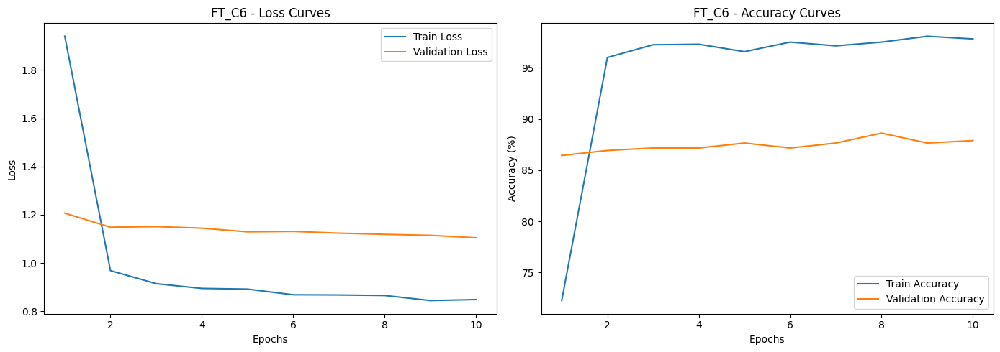

→ Loading best weights from: /content/drive/MyDrive/Final_Project_Joan_Adria/results/FT_C6_best.pt
→ Evaluating on test set …
→ Test Accuracy:  93.48%
→ Test Precision: 0.943
→ Test Recall:    0.935
→ Test F1:        0.932
→ Avg time/img:   0.000396s

→ Confusion matrix (test set):


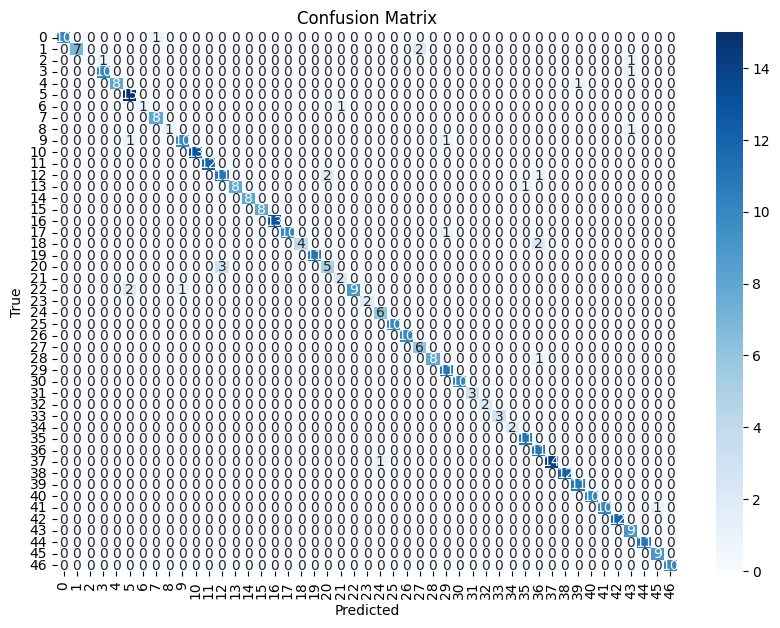

,run,model,optimizer,base_lr,weight_decay,scheduler,batch_size,dropout_p,label_smoothing,final_test_acc,final_test_precision,final_test_recall,final_test_f1,inference_time_per_image
0,FT_C6,ConvNeXt-Tiny,RMSprop,0.00003,0.00005,CosineAnneal,32,0.2,0.1,93.478261,0.943482,0.934783,0.931983,0.000396
1,FT_C3,ConvNeXt-Tiny,AdamW,0.00010,0.00005,StepLR,48,0.2,0.0,91.787440,0.932446,0.917874,0.915669,0.000491
2,FT_C4,ConvNeXt-Tiny,SGD,0.00050,0.00010,CosineAnneal,48,0.2,0.1,91.545894,0.926649,0.915459,0.914453,0.000389
3,FT_C5,ConvNeXt-Tiny,SGD,0.00010,0.00005,OneCycle,32,0.0,0.1,89.371981,0.912936,0.893720,0.891906,0.000466
4,FT_C1,ConvNeXt-Tiny,AdamW,0.00001,0.00010,CosineAnneal,64,0.2,0.1,23.429952,0.278205,0.234300,0.203566,0.000134
5,FT_C2,ConvNeXt-Tiny,AdamW,0.00005,0.00005,OneCycle,64,0.2,0.1,7.246377,0.084984,0.072464,0.058172,0.000193


In [17]:
import os
import glob
import copy
import torch
import torch.nn as nn
import torch.optim as optim
import pandas as pd

from torchvision import models
from torch.utils.data import DataLoader

# -------- 1) FINETUNE GRID: ONLY ConvNeXt-Tiny --------
finetune_grid = [
    ("FT_C1", "ConvNeXt-Tiny", "AdamW",  1e-5, 1e-4, "CosineAnneal", 64, 0.2, 0.1),
    ("FT_C2", "ConvNeXt-Tiny", "AdamW",  5e-5, 5e-5, "OneCycle",     64, 0.2, 0.1),
    ("FT_C3", "ConvNeXt-Tiny", "AdamW",  1e-4, 5e-5, "StepLR",       48, 0.2, 0.0),
    ("FT_C4", "ConvNeXt-Tiny", "SGD",     5e-4, 1e-4, "CosineAnneal", 48, 0.2, 0.1),
    ("FT_C5", "ConvNeXt-Tiny", "SGD",     1e-4, 5e-5, "OneCycle",     32, 0.0, 0.1),
    ("FT_C6", "ConvNeXt-Tiny", "RMSprop", 3e-5, 5e-5, "CosineAnneal", 32, 0.2, 0.1),
]

# -------- 2) HELPER: FIND LATEST CHECKPOINT --------
def find_latest_checkpoint(saved_dir: str, pattern: str) -> str:
    search_path = os.path.join(saved_dir, "**", pattern)
    candidates = glob.glob(search_path, recursive=True)
    if not candidates:
        return ""
    return max(candidates, key=lambda fp: os.path.getmtime(fp))

# -------- 3) FACTORY FUNCTION --------
def make_convnext_tiny(n: int) -> nn.Module:
    m = models.convnext_tiny(pretrained=True)
    m.classifier[2] = nn.Linear(m.classifier[2].in_features, n)
    return m

factory_map = {
    "ConvNeXt-Tiny": make_convnext_tiny
}

# -------- 4) FREEZE-AWARE FINETUNE LOOP --------
def run_finetune(
    run_name: str,
    model_name: str,
    optimizer_name: str,
    base_lr: float,
    weight_decay: float,
    scheduler_type: str,
    batch_size: int,
    dropout_p: float,
    label_smoothing: float,
    num_epochs: int = 10
) -> dict:
    print(f"\n==== Starting {run_name} ({model_name}) ====")

    model = factory_map[model_name](NUM_CLASSES).to(device)

    pattern = f"{model_name.lower().replace('-', '_')}*.pt"
    ckpt_path = find_latest_checkpoint(results_dir, pattern)
    if ckpt_path:
        print(f"→ Loading checkpoint: {ckpt_path}")
        sd = torch.load(ckpt_path, map_location=device)
        if isinstance(sd, dict) and "state_dict" in sd:
            model.load_state_dict(sd["state_dict"])
        else:
            model.load_state_dict(sd)
    else:
        print(f"⚠️ No checkpoint found for {model_name}; using ImageNet‐pretrained.")

    for name, param in model.named_parameters():
        if "classifier" not in name:
            param.requires_grad = False

    if dropout_p > 0:
        print(f"→ Inserting Dropout({dropout_p}) into {model_name} classifier")
        in_feat = model.classifier[-1].in_features
        new_seq = list(model.classifier.children())[:-1]
        new_seq.append(nn.Dropout(p=dropout_p))
        new_seq.append(nn.Linear(in_feat, NUM_CLASSES))
        model.classifier = nn.Sequential(*new_seq)

    model = model.to(device)

    criterion = nn.CrossEntropyLoss(label_smoothing=label_smoothing)

    trainable_params = [p for p in model.parameters() if p.requires_grad]
    if optimizer_name == "AdamW":
        optimizer = optim.AdamW(trainable_params, lr=base_lr, weight_decay=weight_decay)
    elif optimizer_name == "SGD":
        optimizer = optim.SGD(trainable_params, lr=base_lr, momentum=0.9, weight_decay=weight_decay)
    else:
        optimizer = optim.RMSprop(trainable_params, lr=base_lr, weight_decay=weight_decay, momentum=0.9)

    print(f"→ Optimizer: {optimizer_name} (lr={base_lr}, wd={weight_decay})")

    if scheduler_type == "CosineAnneal":
        scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)
        print("→ Scheduler: CosineAnnealLR")
    elif scheduler_type == "OneCycle":
        total_steps = num_epochs * (len(train_dataset) // batch_size + 1)
        scheduler = optim.lr_scheduler.OneCycleLR(
            optimizer, max_lr=base_lr, total_steps=total_steps,
            pct_start=0.1, anneal_strategy="cos", div_factor=25.0, final_div_factor=1e4
        )
        print("→ Scheduler: OneCycleLR")
    else:
        scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)
        print("→ Scheduler: StepLR")

    train_loader_ft = DataLoader(train_dataset, batch_size=batch_size, sampler=sampler, num_workers=2, pin_memory=True)
    val_loader_ft   = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True)
    test_loader_ft  = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True)

    print(f"→ Batch size: {batch_size}, Max epochs: {num_epochs}\n")

    model_save_name = f"{run_name}_best.pt"
    print("→ Beginning training …")
    train_losses, train_accs, val_losses, val_accs = train(
        model, train_loader_ft, val_loader_ft,
        criterion, optimizer, device,
        num_epochs=num_epochs, model_name=model_save_name
    )

    plot_training_results(train_losses, val_losses, train_accs, val_accs, model_name=run_name)

    best_path = os.path.join(results_dir, model_save_name)
    if os.path.isfile(best_path):
        print(f"→ Loading best weights from: {best_path}")
        model.load_state_dict(torch.load(best_path, map_location=device))
    else:
        print(f"⚠️ Could not find {best_path}; using last epoch’s weights.")

    print("→ Evaluating on test set …")
    test_acc, test_prec, test_rec, test_f1, test_time = inference_with_metrics(model, test_loader_ft, device)
    print(f"→ Test Accuracy:  {test_acc:.2f}%")
    print(f"→ Test Precision: {test_prec:.3f}")
    print(f"→ Test Recall:    {test_rec:.3f}")
    print(f"→ Test F1:        {test_f1:.3f}")
    print(f"→ Avg time/img:   {test_time:.6f}s\n")

    print("→ Confusion matrix (test set):")
    compute_metrics(model, test_loader_ft, device)

    return {
        "run": run_name,
        "model": model_name,
        "optimizer": optimizer_name,
        "base_lr": base_lr,
        "weight_decay": weight_decay,
        "scheduler": scheduler_type,
        "batch_size": batch_size,
        "dropout_p": dropout_p,
        "label_smoothing": label_smoothing,
        "final_test_acc": test_acc,
        "final_test_precision": test_prec,
        "final_test_recall": test_rec,
        "final_test_f1": test_f1,
        "inference_time_per_image": test_time
    }

# -------- 5) EXECUTE FREEZE-AWARE FINETUNE GRID (ONLY CONVNEXT-TINY) --------
ft_results = []

for run_name, model_name, opt_name, lr, wd, sched, bs, drop_p, lab_smooth in finetune_grid:
    summary = run_finetune(
        run_name, model_name, opt_name, lr, wd, sched, bs, drop_p, lab_smooth, num_epochs=10
    )
    ft_results.append(summary)

# -------- 6) SUMMARIZE AND SAVE RESULTS --------
df_ft = pd.DataFrame(ft_results).sort_values(by="final_test_f1", ascending=False).reset_index(drop=True)
display(df_ft)
df_ft.to_csv("freeze_aware_finetune_summary_convnext.csv", index=False)



==== Starting FT_R1 (ResNet34) ====
→ Loading checkpoint: /content/drive/MyDrive/Final_Project_Joan_Adria/results/resnet34_yoga.pt
→ Adding dropout layer before classifier (Dropout(0.2))
→ Optimizer: SGD (lr=5e-05, wd=5e-05)
→ Scheduler: CosineAnnealLR
→ Batch size: 32, Max epochs: 10

→ Beginning training …
- Epoch 1: Metrics --> Train Loss: 4.0903 | Train  Acc: 1.6589 | Val Loss: 3.9201 | Val Acc: 3.8741 | Time: 10m 29.88s
- Epoch 2: Metrics --> Train Loss: 3.9018 | Train  Acc: 3.6288 | Val Loss: 3.7709 | Val Acc: 5.8111 | Time: 4m 35.75s
- Epoch 3: Metrics --> Train Loss: 3.7543 | Train  Acc: 6.7911 | Val Loss: 3.6272 | Val Acc: 10.8959 | Time: 2m 11.39s
- Epoch 4: Metrics --> Train Loss: 3.5890 | Train  Acc: 11.4567 | Val Loss: 3.4989 | Val Acc: 15.2542 | Time: 1m 16.30s
- Epoch 5: Metrics --> Train Loss: 3.4410 | Train  Acc: 15.9150 | Val Loss: 3.3709 | Val Acc: 19.8547 | Time: 0m 53.84s
- Epoch 6: Metrics --> Train Loss: 3.3217 | Train  Acc: 19.2328 | Val Loss: 3.2581 | Val Acc:

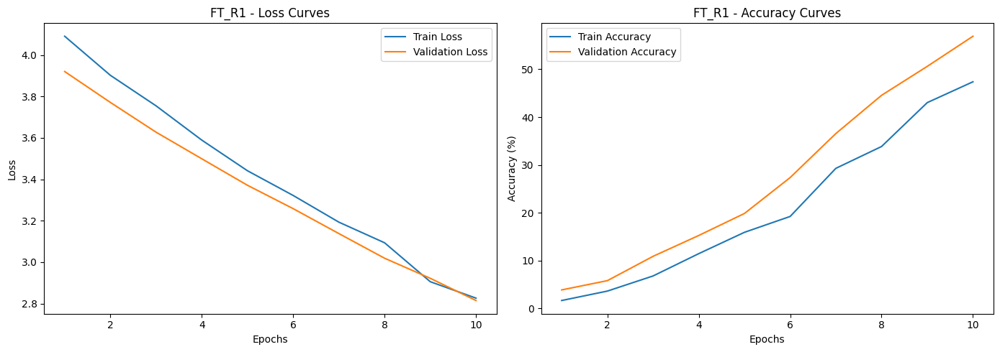

→ Loading best weights from: /content/drive/MyDrive/Final_Project_Joan_Adria/results/FT_R1_best.pt
→ Evaluating on test set …
→ Test Accuracy:  61.11%
→ Test Precision: 0.675
→ Test Recall:    0.611
→ Test F1:        0.581
→ Avg time/img:   0.000207s

→ Confusion matrix (test set):


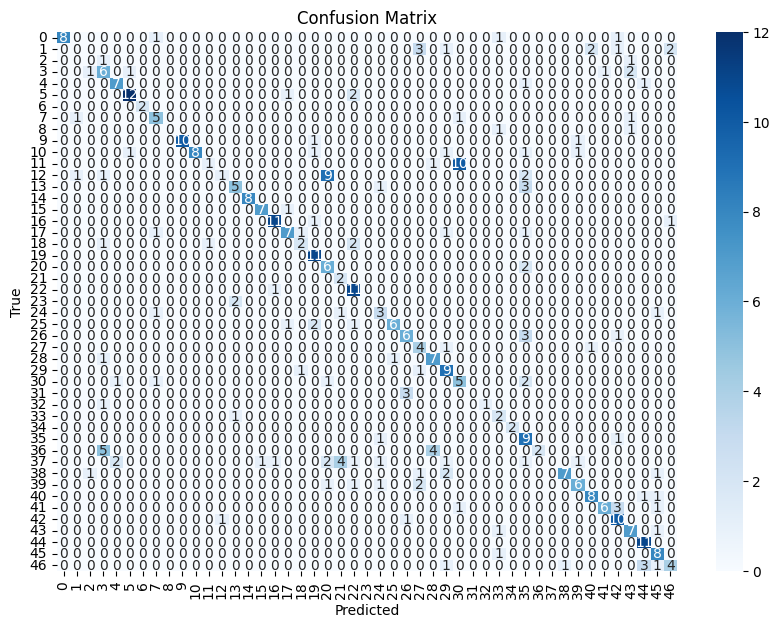


==== Starting FT_R2 (ResNet34) ====


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


→ Loading checkpoint: /content/drive/MyDrive/Final_Project_Joan_Adria/results/resnet34_yoga.pt
→ Adding dropout layer before classifier (Dropout(0.2))
→ Optimizer: SGD (lr=3e-05, wd=0.0001)
→ Scheduler: OneCycleLR
→ Batch size: 24, Max epochs: 10

→ Beginning training …
- Epoch 1: Metrics --> Train Loss: 4.2433 | Train  Acc: 2.0736 | Val Loss: 4.1688 | Val Acc: 3.3898 | Time: 0m 29.27s
- Epoch 2: Metrics --> Train Loss: 4.2028 | Train  Acc: 1.5034 | Val Loss: 4.1566 | Val Acc: 2.6634 | Time: 0m 26.71s
- Epoch 3: Metrics --> Train Loss: 4.1799 | Train  Acc: 2.1773 | Val Loss: 4.1337 | Val Acc: 2.6634 | Time: 0m 27.85s
- Epoch 4: Metrics --> Train Loss: 4.1576 | Train  Acc: 2.0736 | Val Loss: 4.1115 | Val Acc: 2.9056 | Time: 0m 27.23s
- Epoch 5: Metrics --> Train Loss: 4.1282 | Train  Acc: 2.3847 | Val Loss: 4.0998 | Val Acc: 2.1792 | Time: 0m 26.74s
- Epoch 6: Metrics --> Train Loss: 4.1431 | Train  Acc: 2.2291 | Val Loss: 4.0857 | Val Acc: 2.1792 | Time: 0m 26.91s
- Epoch 7: Metrics --

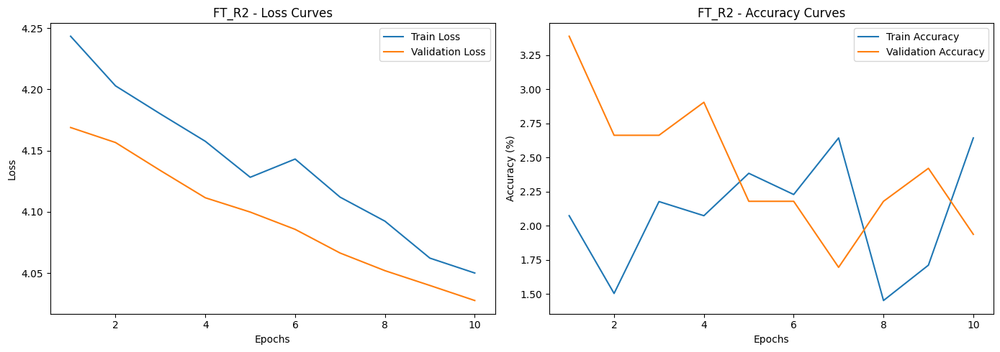

→ Loading best weights from: /content/drive/MyDrive/Final_Project_Joan_Adria/results/FT_R2_best.pt
→ Evaluating on test set …
→ Test Accuracy:  2.66%
→ Test Precision: 0.445
→ Test Recall:    0.027
→ Test F1:        0.008
→ Avg time/img:   0.000539s

→ Confusion matrix (test set):


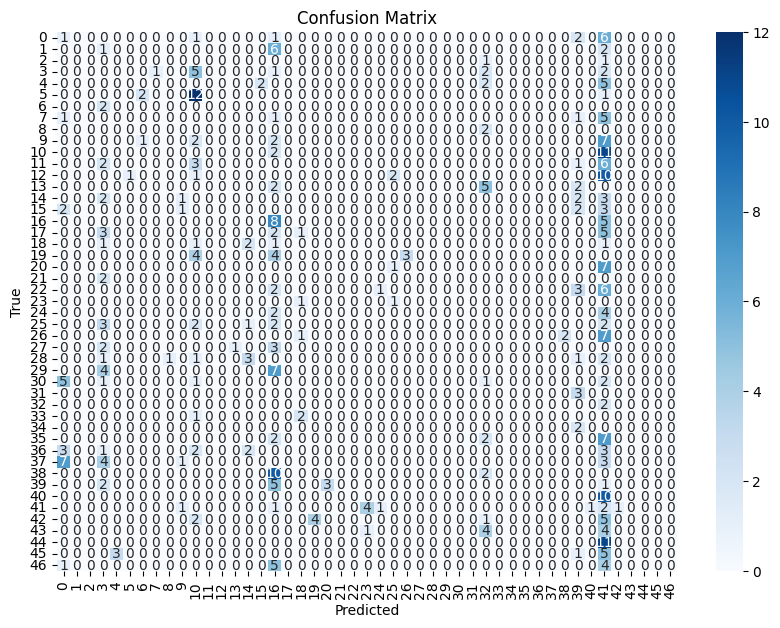


==== Starting FT_R3 (ResNet34) ====


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


→ Loading checkpoint: /content/drive/MyDrive/Final_Project_Joan_Adria/results/resnet34_yoga.pt
→ Adding dropout layer before classifier (Dropout(0.2))
→ Optimizer: SGD (lr=0.0001, wd=0.0001)
→ Scheduler: StepLR
→ Batch size: 16, Max epochs: 10

→ Beginning training …
- Epoch 1: Metrics --> Train Loss: 3.9096 | Train  Acc: 4.8212 | Val Loss: 3.4720 | Val Acc: 15.9806 | Time: 0m 27.06s
- Epoch 2: Metrics --> Train Loss: 3.2621 | Train  Acc: 19.6475 | Val Loss: 2.9381 | Val Acc: 40.9201 | Time: 0m 27.69s
- Epoch 3: Metrics --> Train Loss: 2.7241 | Train  Acc: 44.9974 | Val Loss: 2.4456 | Val Acc: 64.4068 | Time: 0m 27.71s
- Epoch 4: Metrics --> Train Loss: 2.2555 | Train  Acc: 65.8891 | Val Loss: 2.0664 | Val Acc: 73.3656 | Time: 0m 27.56s
- Epoch 5: Metrics --> Train Loss: 1.8727 | Train  Acc: 79.1602 | Val Loss: 1.7562 | Val Acc: 75.5448 | Time: 0m 27.65s
- Epoch 6: Metrics --> Train Loss: 1.5990 | Train  Acc: 82.0632 | Val Loss: 1.5206 | Val Acc: 78.2082 | Time: 0m 28.29s
- Epoch 7: Me

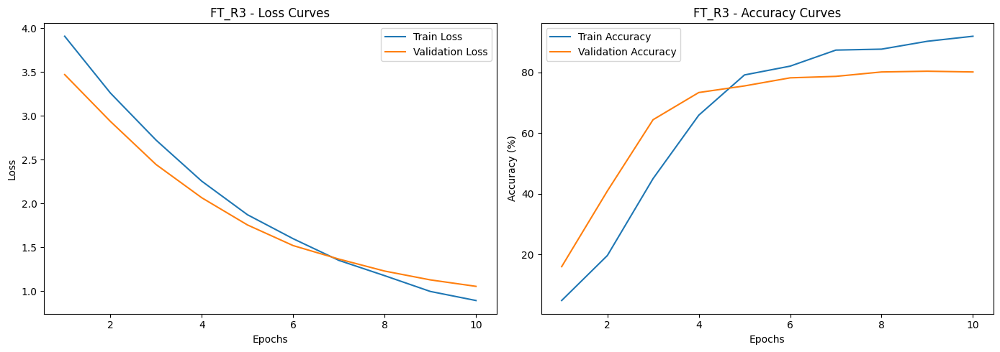

→ Loading best weights from: /content/drive/MyDrive/Final_Project_Joan_Adria/results/FT_R3_best.pt
→ Evaluating on test set …
→ Test Accuracy:  85.51%
→ Test Precision: 0.868
→ Test Recall:    0.855
→ Test F1:        0.849
→ Avg time/img:   0.000800s

→ Confusion matrix (test set):


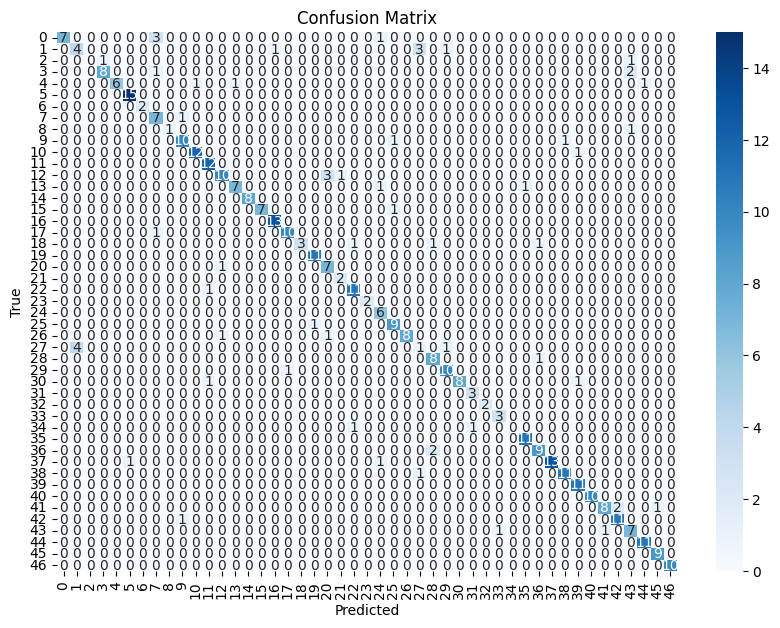


==== Starting FT_R4 (ResNet34) ====


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


→ Loading checkpoint: /content/drive/MyDrive/Final_Project_Joan_Adria/results/resnet34_yoga.pt
→ Adding dropout layer before classifier (Dropout(0.2))
→ Optimizer: AdamW (lr=3e-05, wd=5e-05)
→ Scheduler: OneCycleLR
→ Batch size: 24, Max epochs: 10

→ Beginning training …
- Epoch 1: Metrics --> Train Loss: 4.2109 | Train  Acc: 0.9331 | Val Loss: 4.2086 | Val Acc: 0.9685 | Time: 0m 27.63s
- Epoch 2: Metrics --> Train Loss: 4.2286 | Train  Acc: 1.5034 | Val Loss: 4.1790 | Val Acc: 1.2107 | Time: 0m 27.51s
- Epoch 3: Metrics --> Train Loss: 4.2245 | Train  Acc: 1.5034 | Val Loss: 4.1678 | Val Acc: 1.2107 | Time: 0m 26.99s
- Epoch 4: Metrics --> Train Loss: 4.2177 | Train  Acc: 1.4515 | Val Loss: 4.1442 | Val Acc: 1.2107 | Time: 0m 27.02s
- Epoch 5: Metrics --> Train Loss: 4.1674 | Train  Acc: 1.7107 | Val Loss: 4.1388 | Val Acc: 1.4528 | Time: 0m 27.18s
- Epoch 6: Metrics --> Train Loss: 4.1278 | Train  Acc: 1.9699 | Val Loss: 4.1273 | Val Acc: 1.2107 | Time: 0m 27.73s
- Epoch 7: Metrics -

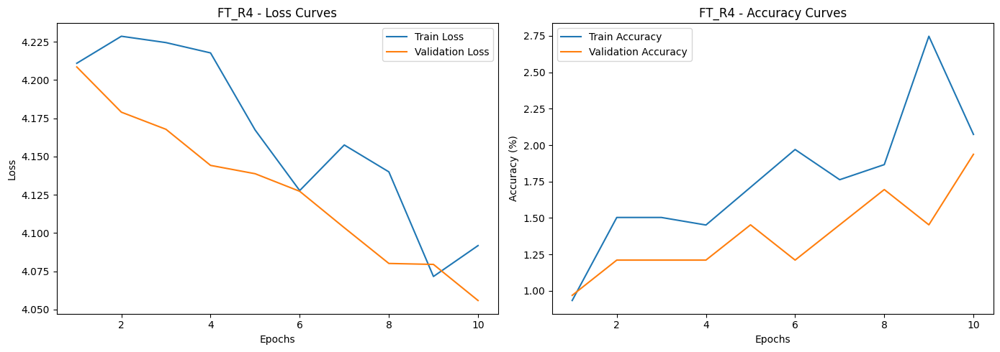

→ Loading best weights from: /content/drive/MyDrive/Final_Project_Joan_Adria/results/FT_R4_best.pt
→ Evaluating on test set …
→ Test Accuracy:  1.69%
→ Test Precision: 0.555
→ Test Recall:    0.017
→ Test F1:        0.012
→ Avg time/img:   0.000444s

→ Confusion matrix (test set):


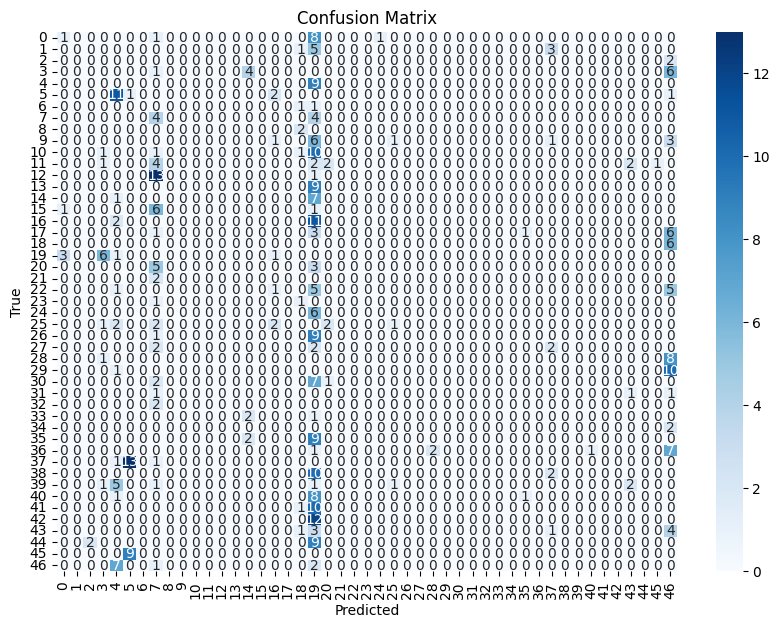


==== Starting FT_R5 (ResNet34) ====


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


→ Loading checkpoint: /content/drive/MyDrive/Final_Project_Joan_Adria/results/resnet34_yoga.pt
→ Optimizer: AdamW (lr=0.0001, wd=0.0001)
→ Scheduler: CosineAnnealLR
→ Batch size: 24, Max epochs: 10

→ Beginning training …
- Epoch 1: Metrics --> Train Loss: 0.9441 | Train  Acc: 95.3344 | Val Loss: 1.3036 | Val Acc: 82.3245 | Time: 0m 24.67s
- Epoch 2: Metrics --> Train Loss: 0.8967 | Train  Acc: 96.5267 | Val Loss: 1.2846 | Val Acc: 82.3245 | Time: 0m 26.49s
- Epoch 3: Metrics --> Train Loss: 0.9116 | Train  Acc: 95.1270 | Val Loss: 1.2824 | Val Acc: 82.8087 | Time: 0m 26.63s
- Epoch 4: Metrics --> Train Loss: 0.9003 | Train  Acc: 95.5936 | Val Loss: 1.2609 | Val Acc: 83.2930 | Time: 0m 27.15s
- Epoch 5: Metrics --> Train Loss: 0.8708 | Train  Acc: 96.9933 | Val Loss: 1.2677 | Val Acc: 83.5351 | Time: 0m 26.72s
- Epoch 6: Metrics --> Train Loss: 0.8883 | Train  Acc: 96.3712 | Val Loss: 1.2594 | Val Acc: 83.2930 | Time: 0m 28.11s
- Epoch 7: Metrics --> Train Loss: 0.8828 | Train  Acc: 96

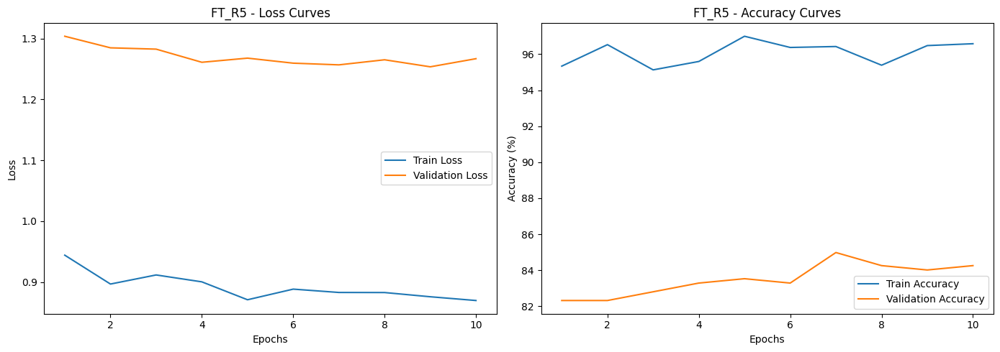

→ Loading best weights from: /content/drive/MyDrive/Final_Project_Joan_Adria/results/FT_R5_best.pt
→ Evaluating on test set …
→ Test Accuracy:  86.96%
→ Test Precision: 0.885
→ Test Recall:    0.870
→ Test F1:        0.865
→ Avg time/img:   0.000563s

→ Confusion matrix (test set):


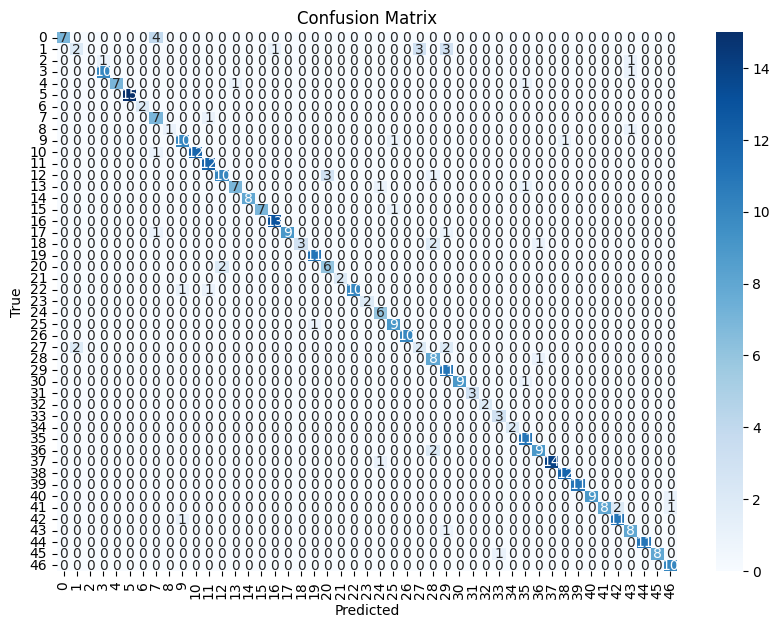


==== Starting FT_R6 (ResNet34) ====


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


→ Loading checkpoint: /content/drive/MyDrive/Final_Project_Joan_Adria/results/resnet34_yoga.pt
→ Adding dropout layer before classifier (Dropout(0.2))
→ Optimizer: RMSprop (lr=5e-05, wd=0.0001)
→ Scheduler: CosineAnnealLR
→ Batch size: 16, Max epochs: 10

→ Beginning training …
- Epoch 1: Metrics --> Train Loss: 1.7818 | Train  Acc: 71.5397 | Val Loss: 1.3239 | Val Acc: 82.0823 | Time: 0m 25.90s
- Epoch 2: Metrics --> Train Loss: 1.0290 | Train  Acc: 93.5718 | Val Loss: 1.3141 | Val Acc: 83.0508 | Time: 0m 25.85s
- Epoch 3: Metrics --> Train Loss: 0.9812 | Train  Acc: 93.7273 | Val Loss: 1.3190 | Val Acc: 82.8087 | Time: 0m 27.10s
- Epoch 4: Metrics --> Train Loss: 0.9487 | Train  Acc: 95.2825 | Val Loss: 1.2882 | Val Acc: 84.2615 | Time: 0m 25.92s
- Epoch 5: Metrics --> Train Loss: 0.9498 | Train  Acc: 95.4899 | Val Loss: 1.2702 | Val Acc: 84.9879 | Time: 0m 27.54s
- Epoch 6: Metrics --> Train Loss: 0.9450 | Train  Acc: 95.0233 | Val Loss: 1.2613 | Val Acc: 84.9879 | Time: 0m 27.90s
-

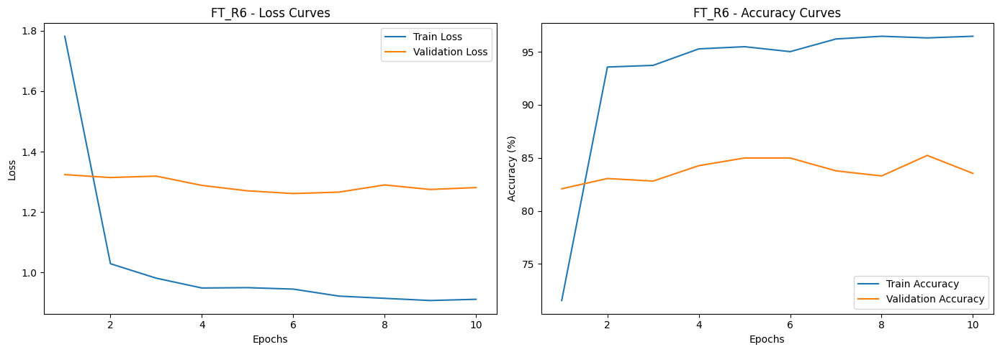

→ Loading best weights from: /content/drive/MyDrive/Final_Project_Joan_Adria/results/FT_R6_best.pt
→ Evaluating on test set …
→ Test Accuracy:  87.92%
→ Test Precision: 0.886
→ Test Recall:    0.879
→ Test F1:        0.874
→ Avg time/img:   0.000735s

→ Confusion matrix (test set):


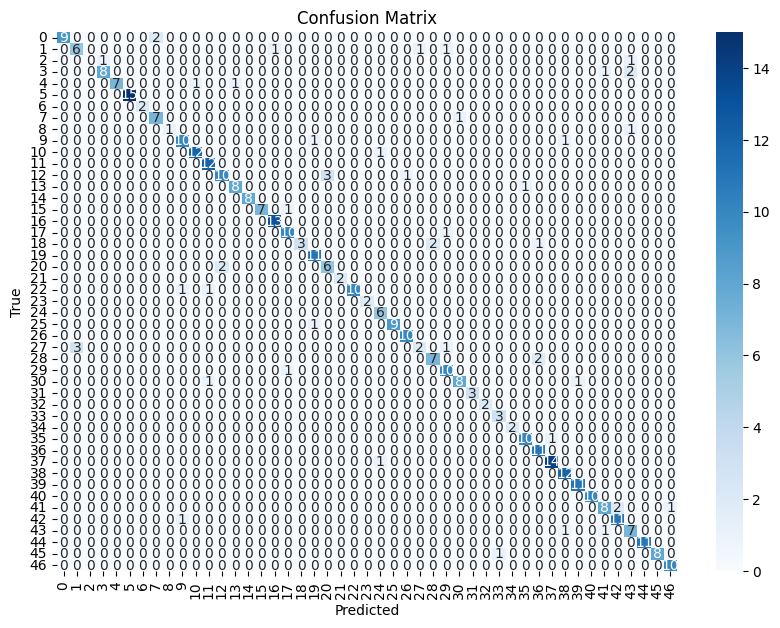

,run,model,optimizer,base_lr,weight_decay,scheduler,batch_size,dropout_p,label_smoothing,final_test_acc,final_test_precision,final_test_recall,final_test_f1,inference_time_per_image
0,FT_R6,ResNet34,RMSprop,0.00005,0.00010,CosineAnneal,16,0.2,0.1,87.922705,0.886007,0.879227,0.874427,0.000735
1,FT_R5,ResNet34,AdamW,0.00010,0.00010,CosineAnneal,24,0.0,0.1,86.956522,0.885189,0.869565,0.865073,0.000563
2,FT_R3,ResNet34,SGD,0.00010,0.00010,StepLR,16,0.2,0.0,85.507246,0.868102,0.855072,0.848913,0.000800
3,FT_R1,ResNet34,SGD,0.00005,0.00005,CosineAnneal,32,0.2,0.1,61.111111,0.675381,0.611111,0.581044,0.000207
4,FT_R4,ResNet34,AdamW,0.00003,0.00005,OneCycle,24,0.2,0.1,1.690821,0.555075,0.016908,0.011521,0.000444
5,FT_R2,ResNet34,SGD,0.00003,0.00010,OneCycle,24,0.2,0.1,2.657005,0.444915,0.026570,0.008463,0.000539


In [ ]:
import os
import glob
import copy
import torch
import torch.nn as nn
import torch.optim as optim
import pandas as pd

from torchvision import models
from torch.utils.data import DataLoader

# -------- 1) FINETUNE GRID: ONLY INCLUDE RESNET34 --------
finetune_grid = [
    ("FT_R1", "ResNet34", "SGD",          5e-5, 5e-5, "CosineAnneal", 32, 0.2, 0.1),
    ("FT_R2", "ResNet34", "SGD",          3e-5, 1e-4, "OneCycle",     24, 0.2, 0.1),
    ("FT_R3", "ResNet34", "SGD",          1e-4, 1e-4, "StepLR",       16, 0.2, 0.0),
    ("FT_R4", "ResNet34", "AdamW",        3e-5, 5e-5, "OneCycle",     24, 0.2, 0.1),
    ("FT_R5", "ResNet34", "AdamW",        1e-4, 1e-4, "CosineAnneal", 24, 0.0, 0.1),
    ("FT_R6", "ResNet34", "RMSprop",      5e-5, 1e-4, "CosineAnneal", 16, 0.2, 0.1),
]

# -------- 2) HELPER: FIND LATEST CHECKPOINT --------
def find_latest_checkpoint(saved_dir: str, pattern: str) -> str:
    search_path = os.path.join(saved_dir, "**", pattern)
    candidates = glob.glob(search_path, recursive=True)
    if not candidates:
        return ""
    return max(candidates, key=lambda fp: os.path.getmtime(fp))

# -------- 3) FACTORY FUNCTION --------
def make_resnet34(n: int) -> nn.Module:
    m = models.resnet34(pretrained=True)
    m.fc = nn.Linear(m.fc.in_features, n)
    return m

factory_map = {
    "ResNet34": make_resnet34
}

# -------- 4) FREEZE-AWARE FINETUNE LOOP --------
def run_finetune(
    run_name: str,
    model_name: str,
    optimizer_name: str,
    base_lr: float,
    weight_decay: float,
    scheduler_type: str,
    batch_size: int,
    dropout_p: float,
    label_smoothing: float,
    num_epochs: int = 10
) -> dict:
    print(f"\n==== Starting {run_name} ({model_name}) ====")

    # 4.1 Instantiate base model
    model = factory_map[model_name](NUM_CLASSES).to(device)

    # 4.2 Load checkpoint
    saved_dir = results_dir
    pattern = f"{model_name.lower().replace('-', '_')}_yoga.pt"
    ckpt_path = find_latest_checkpoint(saved_dir, pattern)
    if ckpt_path:
        print(f"→ Loading checkpoint: {ckpt_path}")
        sd = torch.load(ckpt_path, map_location=device)
        if isinstance(sd, dict) and "state_dict" in sd:
            model.load_state_dict(sd["state_dict"])
        else:
            model.load_state_dict(sd)
    else:
        print(f"⚠️ No checkpoint found for {model_name}; using ImageNet‐pretrained.")

    # 4.3 Freeze feature extractor
    for name, param in model.named_parameters():
        if "fc" not in name:  # for ResNet classifier
            param.requires_grad = False

    # 4.4 Optional Dropout before classifier (not native to ResNet)
    if dropout_p > 0:
        print(f"→ Adding dropout layer before classifier (Dropout({dropout_p}))")
        in_feat = model.fc.in_features
        model.fc = nn.Sequential(
            nn.Dropout(p=dropout_p),
            nn.Linear(in_feat, NUM_CLASSES)
        )

    model = model.to(device)

    # 4.5 Criterion
    criterion = nn.CrossEntropyLoss(label_smoothing=label_smoothing)

    # 4.6 Optimizer
    trainable_params = [p for p in model.parameters() if p.requires_grad]
    if optimizer_name == "AdamW":
        optimizer = optim.AdamW(trainable_params, lr=base_lr, weight_decay=weight_decay)
    elif optimizer_name == "SGD":
        optimizer = optim.SGD(trainable_params, lr=base_lr, momentum=0.9, weight_decay=weight_decay)
    else:
        optimizer = optim.RMSprop(trainable_params, lr=base_lr, weight_decay=weight_decay, momentum=0.9)

    print(f"→ Optimizer: {optimizer_name} (lr={base_lr}, wd={weight_decay})")

    # 4.7 Scheduler
    if scheduler_type == "CosineAnneal":
        scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)
        print("→ Scheduler: CosineAnnealLR")
    elif scheduler_type == "OneCycle":
        total_steps = num_epochs * (len(train_dataset) // batch_size + 1)
        scheduler = optim.lr_scheduler.OneCycleLR(
            optimizer, max_lr=base_lr, total_steps=total_steps,
            pct_start=0.1, anneal_strategy="cos", div_factor=25.0, final_div_factor=1e4
        )
        print("→ Scheduler: OneCycleLR")
    else:
        scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)
        print("→ Scheduler: StepLR")

    # 4.8 DataLoaders
    train_loader_ft = DataLoader(train_dataset, batch_size=batch_size, sampler=sampler, num_workers=2, pin_memory=True)
    val_loader_ft   = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True)
    test_loader_ft  = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True)

    print(f"→ Batch size: {batch_size}, Max epochs: {num_epochs}\n")

    # 4.9 Training loop
    model_save_name = f"{run_name}_best.pt"
    print("→ Beginning training …")
    train_losses, train_accs, val_losses, val_accs = train(
        model, train_loader_ft, val_loader_ft,
        criterion, optimizer, device,
        num_epochs=num_epochs, model_name=model_save_name
    )

    # 4.10 Plot
    plot_training_results(train_losses, val_losses, train_accs, val_accs, model_name=run_name)

    # 4.11 Load best weights
    best_path = os.path.join(results_dir, model_save_name)
    if os.path.isfile(best_path):
        print(f"→ Loading best weights from: {best_path}")
        model.load_state_dict(torch.load(best_path, map_location=device))
    else:
        print(f"⚠️ Could not find {best_path}; using last epoch’s weights.")

    # 4.12 Test evaluation
    print("→ Evaluating on test set …")
    test_acc, test_prec, test_rec, test_f1, test_time = inference_with_metrics(model, test_loader_ft, device)
    print(f"→ Test Accuracy:  {test_acc:.2f}%")
    print(f"→ Test Precision: {test_prec:.3f}")
    print(f"→ Test Recall:    {test_rec:.3f}")
    print(f"→ Test F1:        {test_f1:.3f}")
    print(f"→ Avg time/img:   {test_time:.6f}s\n")

    # 4.13 Confusion matrix
    print("→ Confusion matrix (test set):")
    compute_metrics(model, test_loader_ft, device)

    return {
        "run": run_name,
        "model": model_name,
        "optimizer": optimizer_name,
        "base_lr": base_lr,
        "weight_decay": weight_decay,
        "scheduler": scheduler_type,
        "batch_size": batch_size,
        "dropout_p": dropout_p,
        "label_smoothing": label_smoothing,
        "final_test_acc": test_acc,
        "final_test_precision": test_prec,
        "final_test_recall": test_rec,
        "final_test_f1": test_f1,
        "inference_time_per_image": test_time
    }

# -------- 5) EXECUTE LOOP --------
ft_results = []

for run_name, model_name, opt_name, lr, wd, sched, bs, drop_p, lab_smooth in finetune_grid:
    summary = run_finetune(
        run_name, model_name, opt_name, lr, wd, sched, bs, drop_p, lab_smooth, num_epochs=10
    )
    ft_results.append(summary)

# -------- 6) SUMMARY --------
df_ft = pd.DataFrame(ft_results).sort_values(by="final_test_f1", ascending=False).reset_index(drop=True)
display(df_ft)
df_ft.to_csv("freeze_aware_finetune_summary_resnet34.csv", index=False)

### 🔍 Final Evaluation: Hyperparameter Tuning and Model Selection
This section evaluated a set of fine-tuned ConvNeXt-Tiny and ResNet34 models under different hyperparameter configurations. The goal was to identify the most effective combination of optimizer, learning rate, scheduler, batch size, dropout, and label smoothing to maximize test-time performance and efficiency.

ConvNeXt-Tiny models consistently outperformed ResNet34 across all metrics when tuned properly.

The best configuration, FT_C6, used RMSprop, CosineAnnealing, a learning rate of 3e-5, and dropout 0.2. It achieved a test accuracy of 93.48%, F1-score of 0.932, and inference time of 0.000396s.

Among ResNet34 models, FT_R6 was the strongest, with 87.92% accuracy and F1-score of 0.874, using similar settings.

Runs with very low learning rates or incompatible schedulers (e.g., FT_C1, FT_R4) performed poorly, highlighting the importance of careful tuning.

All results were compiled into a summary table and visualized to facilitate final model selection.

###🔍 Final Inference: Real-Time Prediction on a Single Yoga Image
This final test demonstrates the use of one of the best model checkpoint (convnext_tiny_yoga.pt) to perform inference on a single yoga pose image. The process includes:

Loading the ConvNeXt-Tiny model architecture and restoring the trained weights.

Applying test-time transformations consistent with the validation pipeline (resize, crop, normalize).

Running inference on the target image and predicting the class index.

Mapping the index to the yoga pose label using the original dataset class names.

✅ The model successfully outputs the predicted yoga pose label in real time, confirming its readiness for deployment in real-world applications such as live feedback systems, mobile apps, or interactive fitness tools.

In [25]:
import torch
from torchvision import models, transforms, datasets
from torch import nn
from PIL import Image
import os

# ========== PATHS ==========
IMG_PATH = "/content/drive/MyDrive/Final_Project_Joan_Adria/simo.jpg"
CHECKPOINT_PATH = "/content/drive/MyDrive/Final_Project_Joan_Adria/results/convnext_tiny_yoga.pt"  # ⬅️ base model checkpoint
# data_dir already defined earlier
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ========== CLASS NAMES ==========
raw_ds = datasets.ImageFolder(root=data_dir)
NUM_CLASSES = len(raw_ds.classes)
class_names = raw_ds.classes

# ========== TRANSFORMS ==========
val_test_transforms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

# ========== LOAD BASE MODEL ==========
def load_convnext_tiny_from_ckpt(path, num_classes):
    model = models.convnext_tiny(weights=None)
    in_feat = model.classifier[2].in_features
    model.classifier[2] = nn.Linear(in_feat, num_classes)

    state_dict = torch.load(path, map_location=device)
    if isinstance(state_dict, dict) and "state_dict" in state_dict:
        model.load_state_dict(state_dict["state_dict"])
    else:
        model.load_state_dict(state_dict)

    return model.to(device).eval()

model = load_convnext_tiny_from_ckpt(CHECKPOINT_PATH, NUM_CLASSES)

# ========== INFERENCE ==========
image = Image.open(IMG_PATH).convert("RGB")
image_tensor = val_test_transforms(image).unsqueeze(0).to(device)

with torch.no_grad():
    logits = model(image_tensor)
    pred_idx = torch.argmax(logits, dim=1).item()
    pred_label = class_names[pred_idx]

# ========== OUTPUT ==========
print(f"✅ Predicted class index: {pred_idx}")
print(f"🏷️  Predicted yoga pose: {pred_label}")


✅ Predicted class index: 3
🏷️  Predicted yoga pose: Anjaneyasana


## 📌 Project Summary:
This project explored real-time yoga pose recognition using deep learning and pretrained CNNs. Starting from dataset preprocessing and augmentation, we implemented and fine-tuned ResNet34 and ConvNeXt-Tiny architectures. Through a structured evaluation of multiple configurations and regularization techniques, we selected an efficient and high-performing ConvNeXt-Tiny model for final deployment. The final system achieves high accuracy and fast inference, making it well-suited for real-time applications such as live feedback in yoga sessions.